# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter

#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import Conditional_VAE as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

## load config and set logger

In [4]:
log_file = config['IO_OPTION']['OUTPUT_ROOT']+'/train_{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_file, '00_train.py')

## Setting

In [5]:
# Setting seed
modeler.set_seed(777)

In [6]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
#dev_dir = INPUT_ROOT + "/dev_data"
#add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = ['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
OUT_SCORE_DIR = OUTPUT_ROOT + '/score'
OUT_PRED_DIR = OUTPUT_ROOT + '/pred'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
os.makedirs(OUT_SCORE_DIR, exist_ok=True)
os.makedirs(OUT_PRED_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/dcase2021_task2/output/ID_Conditional_VAE/CVAE/config.yaml'

In [7]:
torch.cuda.is_available()

True

In [8]:
#ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine_types[0]}_features.pkl')
#dataloaders_dict = modeler.make_dataloader(ext_data)

In [9]:
#for sample in dataloaders_dict['train']:
#    hoge = sample['features']

## training

In [10]:
#############################################################################
# run
#############################################################################
def run(machine_type):
    com.tic()
    
    logger.info('TARGET MACHINE_TYPE: {0}'.format(machine_type))
    logger.info('MAKE DATA_LOADER')
    # dataloader
    ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine_type}_features.pkl')
    dataloaders_dict = modeler.make_dataloader(ext_data)
    # define writer for tensorbord
    os.makedirs(TB_DIR+'/'+machine_type, exist_ok=True)
    tb_log_dir = TB_DIR + '/' + machine_type
    writer = SummaryWriter(log_dir = tb_log_dir)
    # out path
    model_out_path = MODEL_DIR+'/{}_model.pth'.format(machine_type)
    score_out_path = OUT_SCORE_DIR + '/{}_score.csv'.format(machine_type)
    pred_out_path = OUT_PRED_DIR + '/{}_pred.csv'.format(machine_type)
    logger.info('TRAINING')
    # parameter setting
    in_features = ext_data['train']['features'].shape[1]
    mid_size = config['param']['mid_size']
    latent_size = config['param']['latent_size']
    num_classes = 6
    net = Model(in_features, mid_size, latent_size, num_classes)
    optimizer = optim.Adam(net.parameters(), lr=1e-3)
    num_epochs = config['param']['num_epochs']
    #scheduler = optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e-2, 
    #                                          max_lr=1e-3, epochs=num_epochs, steps_per_epoch=len(dataloaders_dict['train']))
    # training
    output_dicts = modeler.train_net(net, dataloaders_dict, optimizer, num_epochs, writer, model_out_path, score_out_path, pred_out_path)
    
    com.toc()

In [11]:
machine_types

['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']

2021-04-23 22:33:14,738 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-04-23 22:33:14,739 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-23 22:33:14,773 - 00_train.py - INFO - TRAINING


use: cuda:0


2021-04-23 22:33:16,649 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  2.01it/s]
2021-04-23 22:33:17,648 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:33:17,838 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


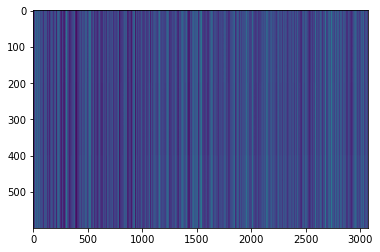

,AUC,pAUC
Source_0,0.549000,0.531053
Source_1,0.543900,0.495789
Source_2,0.556800,0.546842
Target_0,0.524350,0.510000
Target_1,0.542500,0.532105
Target_2,0.543200,0.522105
mean,0.543292,0.522982
h_mean,0.543113,0.522459


2021-04-23 22:33:19,105 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:53.783707, val_AUC_hmean:0.543113, val_pAUC_hmean:0.522459, best_flag:True
2021-04-23 22:33:19,106 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.13it/s]
2021-04-23 22:33:19,593 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.24it/s]
2021-04-23 22:33:19,810 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


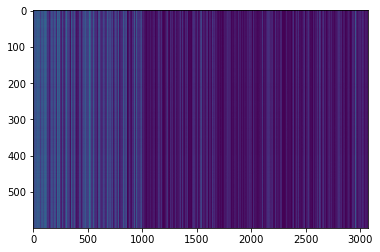

,AUC,pAUC
Source_0,0.568100,0.515263
Source_1,0.566400,0.515789
Source_2,0.590200,0.551053
Target_0,0.550800,0.537368
Target_1,0.567100,0.542632
Target_2,0.493000,0.501053
mean,0.555933,0.527193
h_mean,0.554148,0.526601


2021-04-23 22:33:21,033 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:17.666887, val_AUC_hmean:0.554148, val_pAUC_hmean:0.526601, best_flag:True
2021-04-23 22:33:21,034 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.14it/s]
2021-04-23 22:33:21,519 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-23 22:33:21,709 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:33:21,904 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:8.914346, val_AUC_hmean:0.544207, val_pAUC_hmean:0.524362, best_flag:False
2021-04-23 22:33:21,907 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:33:22,356 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:33:22,539 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


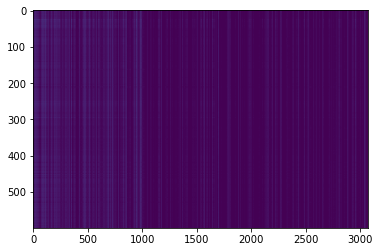

,AUC,pAUC
Source_0,0.545800,0.516842
Source_1,0.572900,0.527895
Source_2,0.587800,0.551053
Target_0,0.529000,0.534211
Target_1,0.571000,0.555263
Target_2,0.469400,0.494737
mean,0.545983,0.530000
h_mean,0.542938,0.529194


2021-04-23 22:33:23,628 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:5.416807, val_AUC_hmean:0.542938, val_pAUC_hmean:0.529194, best_flag:True
2021-04-23 22:33:23,629 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.26it/s]
2021-04-23 22:33:24,101 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:33:24,285 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


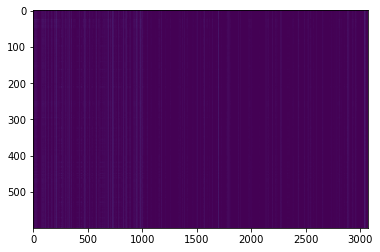

,AUC,pAUC
Source_0,0.542900,0.530000
Source_1,0.580000,0.541053
Source_2,0.591100,0.554737
Target_0,0.521200,0.541053
Target_1,0.581900,0.567895
Target_2,0.472200,0.494211
mean,0.548217,0.538158
h_mean,0.544822,0.537140


2021-04-23 22:33:25,411 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:3.517528, val_AUC_hmean:0.544822, val_pAUC_hmean:0.537140, best_flag:True
2021-04-23 22:33:25,412 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 22:33:25,850 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:33:26,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


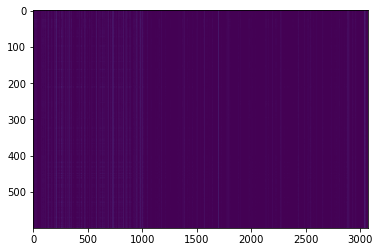

,AUC,pAUC
Source_0,0.539900,0.538421
Source_1,0.592000,0.549474
Source_2,0.595800,0.548421
Target_0,0.517400,0.550526
Target_1,0.607300,0.591579
Target_2,0.478000,0.497895
mean,0.555067,0.546053
h_mean,0.550902,0.544667


2021-04-23 22:33:27,248 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:2.581348, val_AUC_hmean:0.550902, val_pAUC_hmean:0.544667, best_flag:True
2021-04-23 22:33:27,250 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:33:27,699 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.30it/s]
2021-04-23 22:33:27,909 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


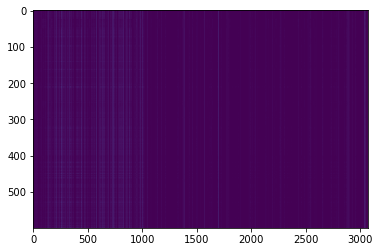

,AUC,pAUC
Source_0,0.580100,0.557368
Source_1,0.606000,0.562632
Source_2,0.623100,0.567368
Target_0,0.546000,0.573684
Target_1,0.664600,0.636842
Target_2,0.494000,0.508947
mean,0.585633,0.567807
h_mean,0.580308,0.565385


2021-04-23 22:33:29,054 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:2.010593, val_AUC_hmean:0.580308, val_pAUC_hmean:0.565385, best_flag:True
2021-04-23 22:33:29,055 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.42it/s]
2021-04-23 22:33:29,642 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.31it/s]
2021-04-23 22:33:29,853 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]


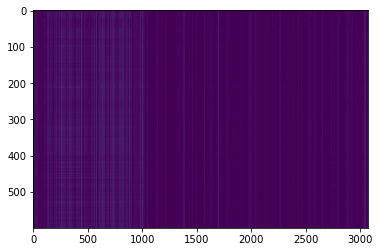

,AUC,pAUC
Source_0,0.623300,0.565263
Source_1,0.617500,0.566316
Source_2,0.659300,0.591053
Target_0,0.574400,0.577368
Target_1,0.707200,0.669474
Target_2,0.514700,0.526842
mean,0.616067,0.582719
h_mean,0.609855,0.579677


2021-04-23 22:33:31,024 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:1.651148, val_AUC_hmean:0.609855, val_pAUC_hmean:0.579677, best_flag:True
2021-04-23 22:33:31,025 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 22:33:31,603 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:33:31,783 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


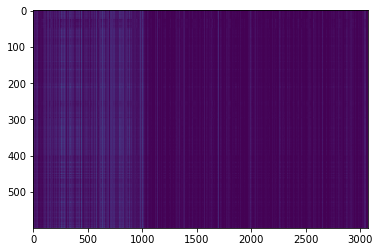

,AUC,pAUC
Source_0,0.656300,0.575789
Source_1,0.628400,0.544737
Source_2,0.689400,0.609474
Target_0,0.593300,0.584737
Target_1,0.740000,0.694737
Target_2,0.537900,0.541053
mean,0.640883,0.591754
h_mean,0.634149,0.587598


2021-04-23 22:33:32,918 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:1.352300, val_AUC_hmean:0.634149, val_pAUC_hmean:0.587598, best_flag:True
2021-04-23 22:33:32,920 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-23 22:33:33,497 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 22:33:33,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.42it/s]
2021-04-23 22:33:33,888 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:1.148555, val_AUC_hmean:0.651043, val_pAUC_hmean:0.584438, best_flag:False
2021-04-23 22:33:33,890 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.63it/s]
2021-04-23 22:33:34,444 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.70it/s]
2021-04-23 22:33:34,640 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-23 22:33:34,823 - 

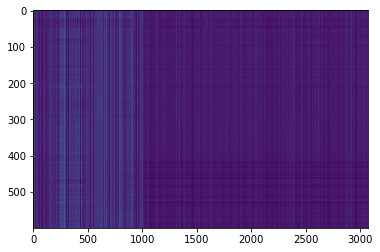

,AUC,pAUC
Source_0,0.692200,0.536842
Source_1,0.644300,0.521579
Source_2,0.738900,0.634211
Target_0,0.655000,0.607368
Target_1,0.780100,0.671053
Target_2,0.589900,0.590000
mean,0.683400,0.593509
h_mean,0.677667,0.588910


2021-04-23 22:33:42,404 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.492681, val_AUC_hmean:0.677667, val_pAUC_hmean:0.588910, best_flag:True
2021-04-23 22:33:42,405 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.59it/s]
2021-04-23 22:33:42,964 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 22:33:43,145 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


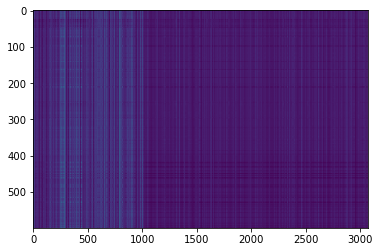

,AUC,pAUC
Source_0,0.693600,0.538947
Source_1,0.643700,0.520526
Source_2,0.736900,0.638421
Target_0,0.656300,0.614211
Target_1,0.777400,0.670526
Target_2,0.586600,0.588421
mean,0.682417,0.595175
h_mean,0.676660,0.590441


2021-04-23 22:33:44,267 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:0.455567, val_AUC_hmean:0.676660, val_pAUC_hmean:0.590441, best_flag:True
2021-04-23 22:33:44,268 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-23 22:33:44,839 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:33:45,021 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-23 22:33:45,203 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:0.431752, val_AUC_hmean:0.676923, val_pAUC_hmean:0.589949, best_flag:False
2021-04-23 22:33:45,204 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.54it/s]
2021-04-23 22:33:45,772 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:33:45,961 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


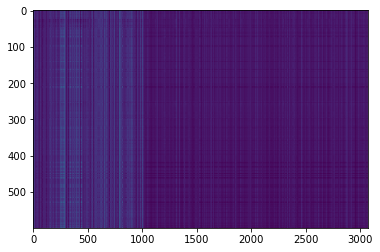

,AUC,pAUC
Source_0,0.701000,0.549474
Source_1,0.649200,0.517368
Source_2,0.733300,0.645789
Target_0,0.661900,0.621053
Target_1,0.789100,0.666842
Target_2,0.574600,0.583684
mean,0.684850,0.597368
h_mean,0.678043,0.592633


2021-04-23 22:33:47,102 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:0.414221, val_AUC_hmean:0.678043, val_pAUC_hmean:0.592633, best_flag:True
2021-04-23 22:33:47,103 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.59it/s]
2021-04-23 22:33:47,662 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:33:47,853 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-23 22:33:48,036 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.389016, val_AUC_hmean:0.680250, val_pAUC_hmean:0.588089, best_flag:False
2021-04-23 22:33:48,037 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.57it/s]
2021-04-23 22:33:48,600 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:33:48,783 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:33:48,972 -

100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-23 22:34:03,544 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:0.292630, val_AUC_hmean:0.567670, val_pAUC_hmean:0.516791, best_flag:False
2021-04-23 22:34:03,545 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.70it/s]
2021-04-23 22:34:04,088 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-23 22:34:04,263 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:34:04,461 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:0.288461, val_AUC_hmean:0.557664, val_pAUC_hmean:0.516556, best_flag:False
2021-04-23 22:34:04,462 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.51it/s]
2021-04-23 22:34:05,034 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:34:05,219 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

100%|██████████| 1/1 [00:00<00:00,  5.69it/s]
2021-04-23 22:34:20,106 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.55it/s]
2021-04-23 22:34:20,314 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:0.266094, val_AUC_hmean:0.575419, val_pAUC_hmean:0.505972, best_flag:False
2021-04-23 22:34:20,315 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.31it/s]
2021-04-23 22:34:20,922 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]
2021-04-23 22:34:21,121 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:34:21,320 - pytorch_modeler.py - INFO - epoch:56/300, train_losses:0.260786, val_AUC_hmean:0.563318, val_pAUC_hmean:0.507824, best_flag:False
2021-04-23 22:34:21,321 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  2.98it/s]
2021-04-23 22:34:21,994 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00

100%|██████████| 2/2 [00:00<00:00,  3.02it/s]
2021-04-23 22:34:38,190 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.21it/s]
2021-04-23 22:34:38,527 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.26it/s]
2021-04-23 22:34:38,858 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:0.245869, val_AUC_hmean:0.573036, val_pAUC_hmean:0.505960, best_flag:False
2021-04-23 22:34:38,859 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.28it/s]
2021-04-23 22:34:39,471 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.50it/s]
2021-04-23 22:34:39,777 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.50it/s]
2021-04-23 22:34:40,087 - pytorch_modeler.py - INFO - epoch:73/300, train_losses:0.255438, val_AUC_hmean:0.556140, val_pAUC_hmean:0.501290, best_flag:False
2021-04-23 22:34:40,088 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00

2021-04-23 22:34:56,157 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.25it/s]
2021-04-23 22:34:56,776 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.43it/s]
2021-04-23 22:34:56,985 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.17it/s]
2021-04-23 22:34:57,206 - pytorch_modeler.py - INFO - epoch:89/300, train_losses:0.232461, val_AUC_hmean:0.560995, val_pAUC_hmean:0.506436, best_flag:False
2021-04-23 22:34:57,207 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.26it/s]
2021-04-23 22:34:57,823 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.66it/s]
2021-04-23 22:34:58,020 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 22:34:58,207 - pytorch_modeler.py - INFO - epoch:90/300, train_losses:0.237398, val_AUC_hmean:0.557017, val_pAUC_hmean:0.503622, best_flag:False
2021-04-23 22:34:58,208 

2021-04-23 22:35:13,433 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 22:35:14,015 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:35:14,194 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 22:35:14,388 - pytorch_modeler.py - INFO - epoch:106/300, train_losses:0.207768, val_AUC_hmean:0.567795, val_pAUC_hmean:0.518514, best_flag:False
2021-04-23 22:35:14,390 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.31it/s]
2021-04-23 22:35:14,996 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:35:15,176 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:35:15,368 - pytorch_modeler.py - INFO - epoch:107/300, train_losses:0.205616, val_AUC_hmean:0.574522, val_pAUC_hmean:0.519010, best_flag:False
2021-04-23 22:35:15,36

2021-04-23 22:35:29,974 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:35:30,548 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:35:30,736 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2021-04-23 22:35:30,932 - pytorch_modeler.py - INFO - epoch:123/300, train_losses:0.191409, val_AUC_hmean:0.582745, val_pAUC_hmean:0.522753, best_flag:False
2021-04-23 22:35:30,933 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:35:31,507 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 22:35:31,696 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-23 22:35:31,889 - pytorch_modeler.py - INFO - epoch:124/300, train_losses:0.188001, val_AUC_hmean:0.578438, val_pAUC_hmean:0.519792, best_flag:False
2021-04-23 22:35:31,89

2021-04-23 22:35:46,560 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 22:35:47,139 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:35:47,323 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.49it/s]
2021-04-23 22:35:47,528 - pytorch_modeler.py - INFO - epoch:140/300, train_losses:0.178344, val_AUC_hmean:0.572696, val_pAUC_hmean:0.521472, best_flag:False
2021-04-23 22:35:47,529 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
2021-04-23 22:35:48,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-23 22:35:48,300 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-23 22:35:48,496 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:0.175948, val_AUC_hmean:0.585717, val_pAUC_hmean:0.523457, best_flag:False
2021-04-23 22:35:48,49

2021-04-23 22:36:04,219 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.38it/s]
2021-04-23 22:36:04,814 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.63it/s]
2021-04-23 22:36:05,110 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.52it/s]
2021-04-23 22:36:05,417 - pytorch_modeler.py - INFO - epoch:157/300, train_losses:0.175099, val_AUC_hmean:0.575890, val_pAUC_hmean:0.514090, best_flag:False
2021-04-23 22:36:05,418 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
2021-04-23 22:36:05,999 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.54it/s]
2021-04-23 22:36:06,300 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.56it/s]
2021-04-23 22:36:06,603 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:0.171932, val_AUC_hmean:0.590187, val_pAUC_hmean:0.515814, best_flag:False
2021-04-23 22:36:06,60

2021-04-23 22:36:25,791 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 22:36:26,378 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.48it/s]
2021-04-23 22:36:26,581 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 22:36:26,777 - pytorch_modeler.py - INFO - epoch:174/300, train_losses:0.155170, val_AUC_hmean:0.586166, val_pAUC_hmean:0.518276, best_flag:False
2021-04-23 22:36:26,778 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.21it/s]
2021-04-23 22:36:27,256 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.31it/s]
2021-04-23 22:36:27,464 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 22:36:27,647 - pytorch_modeler.py - INFO - epoch:175/300, train_losses:0.157606, val_AUC_hmean:0.592404, val_pAUC_hmean:0.525856, best_flag:False
2021-04-23 22:36:27,64

2021-04-23 22:36:40,353 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.22it/s]
2021-04-23 22:36:40,830 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  4.98it/s]
2021-04-23 22:36:41,052 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:36:41,244 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:0.145720, val_AUC_hmean:0.583122, val_pAUC_hmean:0.533336, best_flag:False
2021-04-23 22:36:41,245 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.99it/s]
2021-04-23 22:36:41,750 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:36:41,933 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:36:42,123 - pytorch_modeler.py - INFO - epoch:192/300, train_losses:0.142577, val_AUC_hmean:0.602752, val_pAUC_hmean:0.536593, best_flag:False
2021-04-23 22:36:42,12

2021-04-23 22:36:54,538 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:36:54,992 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:36:55,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:36:55,373 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:0.137621, val_AUC_hmean:0.597950, val_pAUC_hmean:0.528083, best_flag:False
2021-04-23 22:36:55,375 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.21it/s]
2021-04-23 22:36:55,852 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-23 22:36:56,026 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:36:56,212 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:0.137088, val_AUC_hmean:0.595607, val_pAUC_hmean:0.532522, best_flag:False
2021-04-23 22:36:56,21

2021-04-23 22:37:09,298 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 22:37:09,748 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 22:37:09,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:37:10,132 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:0.127130, val_AUC_hmean:0.600611, val_pAUC_hmean:0.529893, best_flag:False
2021-04-23 22:37:10,133 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.08it/s]
2021-04-23 22:37:10,626 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]
2021-04-23 22:37:10,822 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-23 22:37:11,020 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:0.126092, val_AUC_hmean:0.609230, val_pAUC_hmean:0.537811, best_flag:False
2021-04-23 22:37:11,02

2021-04-23 22:37:23,536 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.31it/s]
2021-04-23 22:37:24,002 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:37:24,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:37:24,374 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:0.124453, val_AUC_hmean:0.597792, val_pAUC_hmean:0.539497, best_flag:False
2021-04-23 22:37:24,375 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.39it/s]
2021-04-23 22:37:24,833 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:37:25,013 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 22:37:25,199 - pytorch_modeler.py - INFO - epoch:243/300, train_losses:0.123642, val_AUC_hmean:0.598272, val_pAUC_hmean:0.531221, best_flag:False
2021-04-23 22:37:25,20

2021-04-23 22:37:37,984 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.06it/s]
2021-04-23 22:37:38,479 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 22:37:38,672 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:37:38,868 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:0.120527, val_AUC_hmean:0.589001, val_pAUC_hmean:0.534138, best_flag:False
2021-04-23 22:37:38,869 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-23 22:37:39,329 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:37:39,512 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:37:39,701 - pytorch_modeler.py - INFO - epoch:260/300, train_losses:0.118446, val_AUC_hmean:0.588144, val_pAUC_hmean:0.518729, best_flag:False
2021-04-23 22:37:39,70

2021-04-23 22:37:52,685 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:37:53,126 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:37:53,302 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-23 22:37:53,481 - pytorch_modeler.py - INFO - epoch:276/300, train_losses:0.109711, val_AUC_hmean:0.619261, val_pAUC_hmean:0.543085, best_flag:False
2021-04-23 22:37:53,482 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.70it/s]
2021-04-23 22:37:54,025 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-23 22:37:54,221 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]
2021-04-23 22:37:54,419 - pytorch_modeler.py - INFO - epoch:277/300, train_losses:0.110394, val_AUC_hmean:0.610771, val_pAUC_hmean:0.537731, best_flag:False
2021-04-23 22:37:54,42

2021-04-23 22:38:07,367 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 22:38:07,827 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:38:08,018 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.20it/s]
2021-04-23 22:38:08,237 - pytorch_modeler.py - INFO - epoch:293/300, train_losses:0.103955, val_AUC_hmean:0.609173, val_pAUC_hmean:0.539138, best_flag:False
2021-04-23 22:38:08,238 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.10it/s]
2021-04-23 22:38:08,728 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.48it/s]
2021-04-23 22:38:08,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-23 22:38:09,125 - pytorch_modeler.py - INFO - epoch:294/300, train_losses:0.102338, val_AUC_hmean:0.600168, val_pAUC_hmean:0.530064, best_flag:False
2021-04-23 22:38:09,12

,AUC,pAUC
Source_0,0.701000,0.549474
Source_1,0.649200,0.517368
Source_2,0.733300,0.645789
Target_0,0.661900,0.621053
Target_1,0.789100,0.666842
Target_2,0.574600,0.583684
mean,0.684850,0.597368
h_mean,0.678043,0.592633


2021-04-23 22:38:14,190 - 00_train.py - INFO - TARGET MACHINE_TYPE: gearbox
2021-04-23 22:38:14,191 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-23 22:38:14,226 - 00_train.py - INFO - TRAINING


elapsed time: 299.452036858 [sec]


2021-04-23 22:38:14,435 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-23 22:38:14,881 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:38:15,067 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


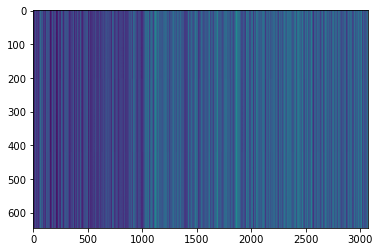

,AUC,pAUC
Source_0,0.371233,0.481653
Source_1,0.241598,0.478558
Source_2,0.361715,0.481594
Target_0,0.198110,0.478862
Target_1,0.204132,0.474496
Target_2,0.329444,0.474728
mean,0.284372,0.478315
h_mean,0.265730,0.478298


2021-04-23 22:38:16,220 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:52.628544, val_AUC_hmean:0.265730, val_pAUC_hmean:0.478298, best_flag:True
2021-04-23 22:38:16,221 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.21it/s]
2021-04-23 22:38:16,698 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 22:38:16,879 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:38:17,067 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:14.439671, val_AUC_hmean:0.199545, val_pAUC_hmean:0.476431, best_flag:False
2021-04-23 22:38:17,068 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-23 22:38:17,529 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.66it/s]
2021-04-23 22:38:17,729 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


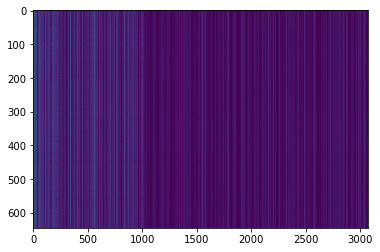

,AUC,pAUC
Source_0,0.363907,0.484737
Source_1,0.173783,0.477926
Source_2,0.333132,0.476792
Target_0,0.178434,0.484548
Target_1,0.121399,0.473684
Target_2,0.303889,0.476817
mean,0.245757,0.479084
h_mean,0.209524,0.479048


2021-04-23 22:38:18,788 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:7.196144, val_AUC_hmean:0.209524, val_pAUC_hmean:0.479048, best_flag:True
2021-04-23 22:38:18,789 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 22:38:19,245 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 22:38:19,442 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


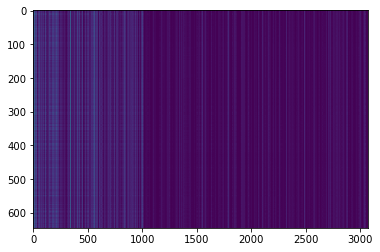

,AUC,pAUC
Source_0,0.407717,0.493863
Source_1,0.219907,0.490380
Source_2,0.351315,0.503842
Target_0,0.244020,0.478050
Target_1,0.196845,0.480904
Target_2,0.343333,0.494152
mean,0.293856,0.490198
h_mean,0.273507,0.490046


2021-04-23 22:38:20,631 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:5.226766, val_AUC_hmean:0.273507, val_pAUC_hmean:0.490046, best_flag:True
2021-04-23 22:38:20,632 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.25it/s]
2021-04-23 22:38:21,104 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.53it/s]
2021-04-23 22:38:21,308 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:38:21,507 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:3.657844, val_AUC_hmean:0.386676, val_pAUC_hmean:0.487614, best_flag:False
2021-04-23 22:38:21,508 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.14it/s]
2021-04-23 22:38:21,994 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.44it/s]
2021-04-23 22:38:22,202 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  4.91it/s]
2021-04-23 22:38:22,430 - p

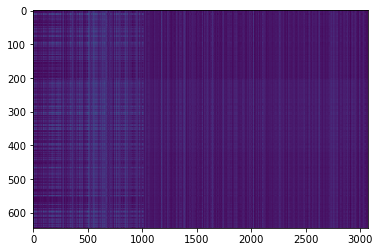

,AUC,pAUC
Source_0,0.593309,0.511471
Source_1,0.638203,0.481536
Source_2,0.547437,0.481171
Target_0,0.711227,0.506376
Target_1,0.661780,0.476662
Target_2,0.576905,0.490602
mean,0.621477,0.491303
h_mean,0.616679,0.490952


2021-04-23 22:38:33,515 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:0.654483, val_AUC_hmean:0.616679, val_pAUC_hmean:0.490952, best_flag:True
2021-04-23 22:38:33,516 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.35it/s]
2021-04-23 22:38:33,978 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.67it/s]
2021-04-23 22:38:34,175 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


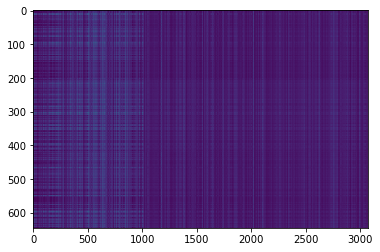

,AUC,pAUC
Source_0,0.596190,0.511085
Source_1,0.650806,0.484604
Source_2,0.566559,0.479688
Target_0,0.720968,0.507594
Target_1,0.672840,0.479370
Target_2,0.588492,0.488304
mean,0.632643,0.491774
h_mean,0.628178,0.491445


2021-04-23 22:38:35,259 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.592175, val_AUC_hmean:0.628178, val_pAUC_hmean:0.491445, best_flag:True
2021-04-23 22:38:35,261 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
2021-04-23 22:38:35,730 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2021-04-23 22:38:35,922 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


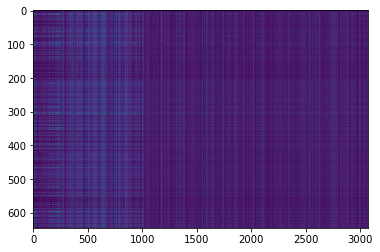

,AUC,pAUC
Source_0,0.602344,0.515070
Source_1,0.660751,0.493538
Source_2,0.569512,0.475238
Target_0,0.730035,0.516427
Target_1,0.678498,0.483160
Target_2,0.595556,0.482665
mean,0.639449,0.494350
h_mean,0.634770,0.493835


2021-04-23 22:38:37,068 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:0.563655, val_AUC_hmean:0.634770, val_pAUC_hmean:0.493835, best_flag:True
2021-04-23 22:38:37,069 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-23 22:38:37,488 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 22:38:37,667 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]


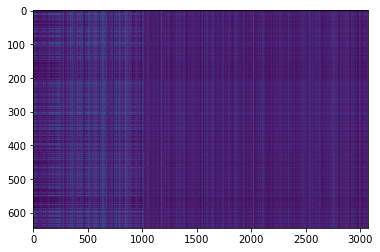

,AUC,pAUC
Source_0,0.608645,0.528179
Source_1,0.665809,0.501751
Source_2,0.571524,0.477004
Target_0,0.735918,0.531352
Target_1,0.684156,0.486860
Target_2,0.599444,0.482038
mean,0.644250,0.501197
h_mean,0.639431,0.500282


2021-04-23 22:38:38,755 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:0.529084, val_AUC_hmean:0.639431, val_pAUC_hmean:0.500282, best_flag:True
2021-04-23 22:38:38,756 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 22:38:39,195 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-23 22:38:39,387 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


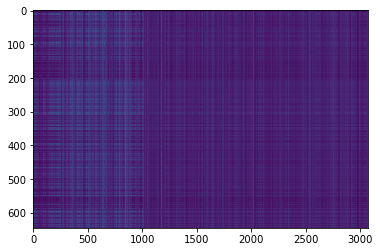

,AUC,pAUC
Source_0,0.613382,0.541803
Source_1,0.678326,0.506444
Source_2,0.570921,0.481877
Target_0,0.742091,0.545159
Target_1,0.689129,0.487311
Target_2,0.603968,0.481621
mean,0.649636,0.507369
h_mean,0.644437,0.505980


2021-04-23 22:38:40,473 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:0.497594, val_AUC_hmean:0.644437, val_pAUC_hmean:0.505980, best_flag:True
2021-04-23 22:38:40,474 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.78it/s]
2021-04-23 22:38:40,894 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:38:41,074 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]


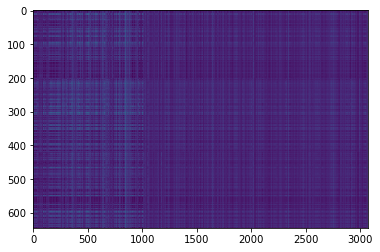

,AUC,pAUC
Source_0,0.621832,0.548744
Source_1,0.675497,0.512851
Source_2,0.567901,0.483925
Target_0,0.742573,0.551352
Target_1,0.691015,0.494260
Target_2,0.601667,0.484336
mean,0.650081,0.512578
h_mean,0.644795,0.511060


2021-04-23 22:38:42,138 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.465083, val_AUC_hmean:0.644795, val_pAUC_hmean:0.511060, best_flag:True
2021-04-23 22:38:42,139 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-23 22:38:42,571 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:38:42,751 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]


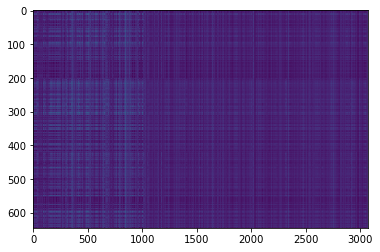

,AUC,pAUC
Source_0,0.630623,0.570079
Source_1,0.692130,0.532164
Source_2,0.570585,0.488375
Target_0,0.750675,0.565769
Target_1,0.703189,0.508068
Target_2,0.601905,0.482247
mean,0.658184,0.524450
h_mean,0.652262,0.522182


2021-04-23 22:38:43,820 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.442956, val_AUC_hmean:0.652262, val_pAUC_hmean:0.522182, best_flag:True
2021-04-23 22:38:43,821 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-23 22:38:44,253 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:38:44,433 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-23 22:38:44,612 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.421935, val_AUC_hmean:0.651103, val_pAUC_hmean:0.517680, best_flag:False
2021-04-23 22:38:44,613 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.80it/s]
2021-04-23 22:38:45,032 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:38:45,212 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


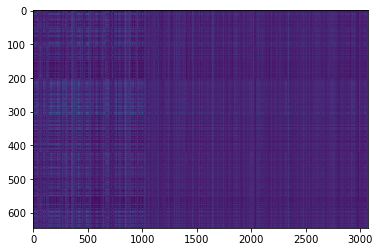

,AUC,pAUC
Source_0,0.648352,0.596427
Source_1,0.718707,0.576655
Source_2,0.580448,0.501370
Target_0,0.759742,0.599984
Target_1,0.741169,0.552920
Target_2,0.607460,0.483709
mean,0.675980,0.551844
h_mean,0.669029,0.548047


2021-04-23 22:38:46,276 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:0.411793, val_AUC_hmean:0.669029, val_pAUC_hmean:0.548047, best_flag:True
2021-04-23 22:38:46,277 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-23 22:38:46,737 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:38:46,918 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


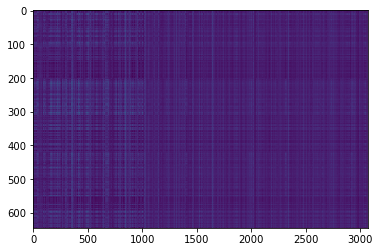

,AUC,pAUC
Source_0,0.642833,0.592571
Source_1,0.722994,0.601834
Source_2,0.567633,0.501794
Target_0,0.757427,0.613588
Target_1,0.753001,0.596600
Target_2,0.602143,0.488931
mean,0.674338,0.565886
h_mean,0.665966,0.561104


2021-04-23 22:38:48,041 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:0.398817, val_AUC_hmean:0.665966, val_pAUC_hmean:0.561104, best_flag:True
2021-04-23 22:38:48,042 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-23 22:38:48,465 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:38:48,645 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


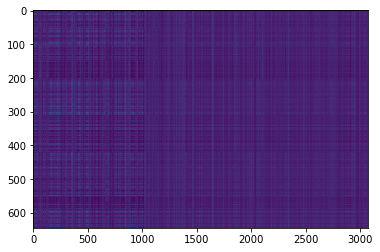

,AUC,pAUC
Source_0,0.648596,0.591286
Source_1,0.735940,0.623403
Source_2,0.573269,0.511470
Target_0,0.765046,0.632168
Target_1,0.777521,0.649033
Target_2,0.606508,0.493525
mean,0.684480,0.583481
h_mean,0.675142,0.576960


2021-04-23 22:38:49,781 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.390446, val_AUC_hmean:0.675142, val_pAUC_hmean:0.576960, best_flag:True
2021-04-23 22:38:49,782 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-23 22:38:50,209 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.58it/s]
2021-04-23 22:38:50,409 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


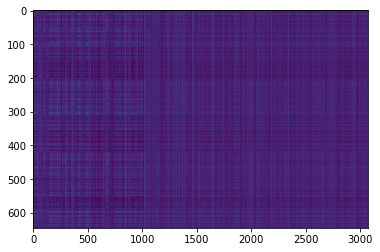

,AUC,pAUC
Source_0,0.651526,0.593085
Source_1,0.748457,0.639827
Source_2,0.575819,0.512812
Target_0,0.771316,0.648006
Target_1,0.792695,0.662840
Target_2,0.620794,0.501880
mean,0.693434,0.593075
h_mean,0.683648,0.585742


2021-04-23 22:38:51,464 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.378753, val_AUC_hmean:0.683648, val_pAUC_hmean:0.585742, best_flag:True
2021-04-23 22:38:51,465 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.67it/s]
2021-04-23 22:38:51,896 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:38:52,076 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


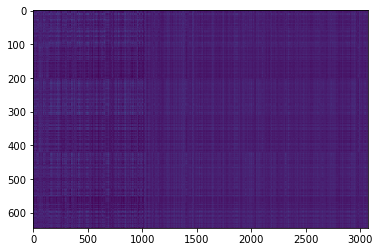

,AUC,pAUC
Source_0,0.658950,0.596813
Source_1,0.767233,0.659411
Source_2,0.589171,0.515496
Target_0,0.768808,0.650341
Target_1,0.807785,0.688380
Target_2,0.632460,0.518379
mean,0.704068,0.604803
h_mean,0.694601,0.596933


2021-04-23 22:38:53,172 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.370647, val_AUC_hmean:0.694601, val_pAUC_hmean:0.596933, best_flag:True
2021-04-23 22:38:53,173 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.59it/s]
2021-04-23 22:38:53,733 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:38:53,915 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-23 22:38:54,091 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.378975, val_AUC_hmean:0.701949, val_pAUC_hmean:0.583736, best_flag:False
2021-04-23 22:38:54,092 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.63it/s]
2021-04-23 22:38:54,646 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:38:54,831 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]


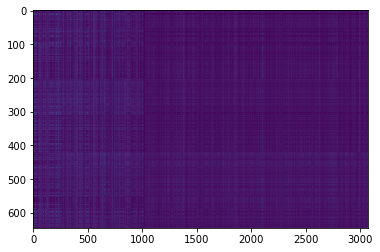

,AUC,pAUC
Source_0,0.677070,0.605809
Source_1,0.860340,0.762111
Source_2,0.680556,0.578425
Target_0,0.838927,0.679175
Target_1,0.884088,0.796405
Target_2,0.716032,0.624896
mean,0.776169,0.674470
h_mean,0.766443,0.665192


2021-04-23 22:38:55,891 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.410326, val_AUC_hmean:0.766443, val_pAUC_hmean:0.665192, best_flag:True
2021-04-23 22:38:55,892 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-23 22:38:56,468 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:38:56,652 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


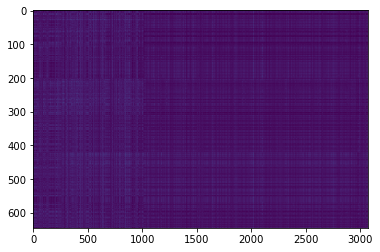

,AUC,pAUC
Source_0,0.685665,0.608251
Source_1,0.868913,0.776911
Source_2,0.695451,0.571009
Target_0,0.864390,0.696739
Target_1,0.887774,0.798390
Target_2,0.727063,0.629699
mean,0.788210,0.680167
h_mean,0.778623,0.669768


2021-04-23 22:38:57,724 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:0.390221, val_AUC_hmean:0.778623, val_pAUC_hmean:0.669768, best_flag:True
2021-04-23 22:38:57,725 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.53it/s]
2021-04-23 22:38:58,294 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:38:58,476 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.37it/s]


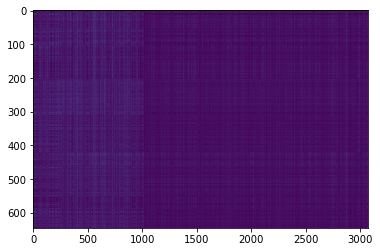

,AUC,pAUC
Source_0,0.676777,0.603110
Source_1,0.881687,0.781243
Source_2,0.699208,0.579696
Target_0,0.860050,0.695622
Target_1,0.893690,0.799473
Target_2,0.734921,0.631788
mean,0.791055,0.681822
h_mean,0.780809,0.671568


2021-04-23 22:38:59,524 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:0.382609, val_AUC_hmean:0.780809, val_pAUC_hmean:0.671568, best_flag:True
2021-04-23 22:38:59,525 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.68it/s]
2021-04-23 22:39:00,072 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:39:00,265 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


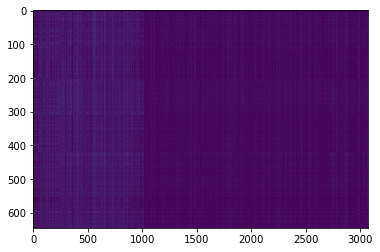

,AUC,pAUC
Source_0,0.675897,0.603881
Source_1,0.887260,0.777453
Source_2,0.691559,0.581179
Target_0,0.853877,0.697551
Target_1,0.896348,0.801549
Target_2,0.738333,0.631579
mean,0.790546,0.682199
h_mean,0.779853,0.672092


2021-04-23 22:39:01,307 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:0.368246, val_AUC_hmean:0.779853, val_pAUC_hmean:0.672092, best_flag:True
2021-04-23 22:39:01,308 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.63it/s]
2021-04-23 22:39:01,861 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-23 22:39:02,055 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:39:02,241 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:0.363298, val_AUC_hmean:0.783839, val_pAUC_hmean:0.670514, best_flag:False
2021-04-23 22:39:02,242 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.29it/s]
2021-04-23 22:39:02,852 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-23 22:39:03,041 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 22:39:03,222 -

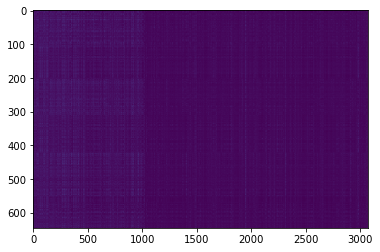

,AUC,pAUC
Source_0,0.688645,0.607609
Source_1,0.916324,0.792704
Source_2,0.689882,0.578990
Target_0,0.847319,0.687398
Target_1,0.900549,0.790358
Target_2,0.750714,0.648705
mean,0.798905,0.684294
h_mean,0.787850,0.674461


2021-04-23 22:39:09,648 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:0.324271, val_AUC_hmean:0.787850, val_pAUC_hmean:0.674461, best_flag:True
2021-04-23 22:39:09,649 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-23 22:39:10,220 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.60it/s]
2021-04-23 22:39:10,418 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


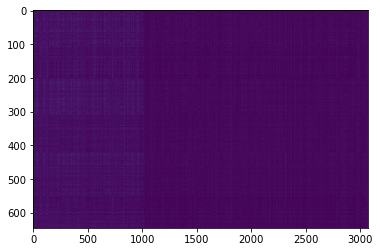

,AUC,pAUC
Source_0,0.705495,0.599897
Source_1,0.914266,0.805158
Source_2,0.697128,0.577153
Target_0,0.864487,0.714405
Target_1,0.909636,0.808949
Target_2,0.750238,0.625940
mean,0.806875,0.688584
h_mean,0.796318,0.676047


2021-04-23 22:39:11,487 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:0.316800, val_AUC_hmean:0.796318, val_pAUC_hmean:0.676047, best_flag:True
2021-04-23 22:39:11,488 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.54it/s]
2021-04-23 22:39:12,054 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.32it/s]
2021-04-23 22:39:12,377 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.41it/s]
2021-04-23 22:39:12,693 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:0.315562, val_AUC_hmean:0.777832, val_pAUC_hmean:0.667175, best_flag:False
2021-04-23 22:39:12,694 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
2021-04-23 22:39:13,290 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.36it/s]
2021-04-23 22:39:13,611 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.45it/s]
2021-04-23 22:39:13,924 -

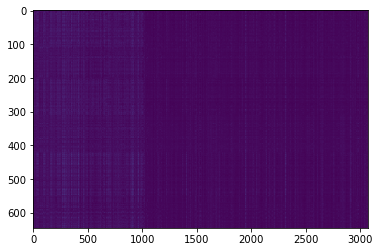

,AUC,pAUC
Source_0,0.709060,0.607609
Source_1,0.913237,0.816349
Source_2,0.706320,0.594245
Target_0,0.842496,0.691663
Target_1,0.903464,0.809220
Target_2,0.771825,0.661445
mean,0.807734,0.696755
h_mean,0.798877,0.685953


2021-04-23 22:39:16,891 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:0.301306, val_AUC_hmean:0.798877, val_pAUC_hmean:0.685953, best_flag:True
2021-04-23 22:39:16,892 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.77it/s]
2021-04-23 22:39:17,314 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 22:39:17,501 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.41it/s]
2021-04-23 22:39:17,680 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:0.299416, val_AUC_hmean:0.799647, val_pAUC_hmean:0.676738, best_flag:False
2021-04-23 22:39:17,681 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.78it/s]
2021-04-23 22:39:18,101 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:39:18,283 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.52it/s]


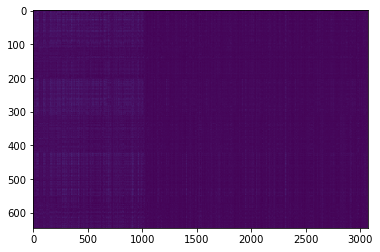

,AUC,pAUC
Source_0,0.680977,0.600668
Source_1,0.925326,0.815176
Source_2,0.715647,0.587818
Target_0,0.854263,0.710445
Target_1,0.917095,0.828081
Target_2,0.765159,0.654762
mean,0.809744,0.699492
h_mean,0.798463,0.686876


2021-04-23 22:39:19,308 - pytorch_modeler.py - INFO - epoch:49/300, train_losses:0.296537, val_AUC_hmean:0.798463, val_pAUC_hmean:0.686876, best_flag:True
2021-04-23 22:39:19,309 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:39:19,758 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-23 22:39:19,936 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.41it/s]
2021-04-23 22:39:20,115 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:0.295717, val_AUC_hmean:0.800090, val_pAUC_hmean:0.682707, best_flag:False
2021-04-23 22:39:20,116 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.73it/s]
2021-04-23 22:39:20,541 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:39:20,722 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


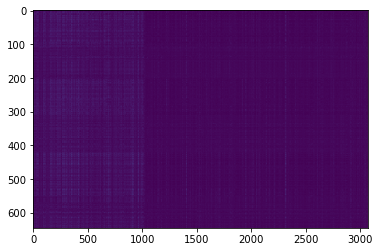

,AUC,pAUC
Source_0,0.688107,0.606066
Source_1,0.926869,0.837557
Source_2,0.703435,0.595517
Target_0,0.856771,0.700800
Target_1,0.908265,0.822576
Target_2,0.751746,0.655806
mean,0.805866,0.703054
h_mean,0.794474,0.690399


2021-04-23 22:39:21,770 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:0.293822, val_AUC_hmean:0.794474, val_pAUC_hmean:0.690399, best_flag:True
2021-04-23 22:39:21,771 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.68it/s]
2021-04-23 22:39:22,200 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 22:39:22,382 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.66it/s]


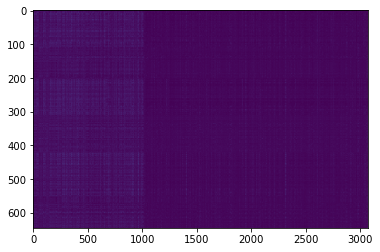

,AUC,pAUC
Source_0,0.709060,0.602339
Source_1,0.928241,0.824652
Source_2,0.723363,0.596647
Target_0,0.865355,0.723644
Target_1,0.920782,0.823117
Target_2,0.772222,0.658939
mean,0.819837,0.704890
h_mean,0.810083,0.692581


2021-04-23 22:39:23,416 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:0.290386, val_AUC_hmean:0.810083, val_pAUC_hmean:0.692581, best_flag:True
2021-04-23 22:39:23,417 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-23 22:39:23,841 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-23 22:39:24,017 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-23 22:39:24,190 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:0.285808, val_AUC_hmean:0.801005, val_pAUC_hmean:0.690096, best_flag:False
2021-04-23 22:39:24,191 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-23 22:39:24,616 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 22:39:24,793 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2021-04-23 22:39:24,966 -

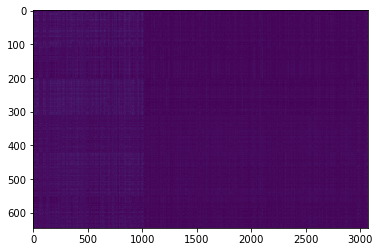

,AUC,pAUC
Source_0,0.692357,0.603239
Source_1,0.927469,0.814634
Source_2,0.732958,0.605687
Target_0,0.863329,0.712070
Target_1,0.927126,0.823659
Target_2,0.772460,0.663743
mean,0.819283,0.703839
h_mean,0.808805,0.692733


2021-04-23 22:39:29,012 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:0.273868, val_AUC_hmean:0.808805, val_pAUC_hmean:0.692733, best_flag:True
2021-04-23 22:39:29,013 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-23 22:39:29,435 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-23 22:39:29,617 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


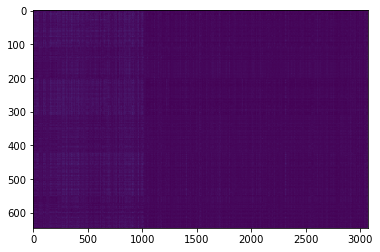

,AUC,pAUC
Source_0,0.696801,0.603753
Source_1,0.912637,0.814544
Source_2,0.731012,0.604981
Target_0,0.842110,0.712577
Target_1,0.924726,0.827630
Target_2,0.778254,0.661445
mean,0.814257,0.704155
h_mean,0.805083,0.692809


2021-04-23 22:39:30,670 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:0.270752, val_AUC_hmean:0.805083, val_pAUC_hmean:0.692809, best_flag:True
2021-04-23 22:39:30,671 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.62it/s]
2021-04-23 22:39:31,106 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-23 22:39:31,281 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-23 22:39:31,455 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:0.268230, val_AUC_hmean:0.803980, val_pAUC_hmean:0.688270, best_flag:False
2021-04-23 22:39:31,456 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:39:31,893 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-23 22:39:32,071 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:39:32,257 -

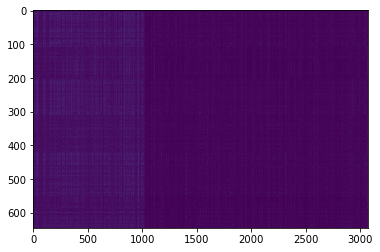

,AUC,pAUC
Source_0,0.726691,0.602853
Source_1,0.933385,0.823749
Source_2,0.729603,0.596717
Target_0,0.879244,0.736944
Target_1,0.930727,0.820952
Target_2,0.795714,0.672515
mean,0.832561,0.708955
h_mean,0.823431,0.696817


2021-04-23 22:39:37,866 - pytorch_modeler.py - INFO - epoch:67/300, train_losses:0.254359, val_AUC_hmean:0.823431, val_pAUC_hmean:0.696817, best_flag:True
2021-04-23 22:39:37,867 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.61it/s]
2021-04-23 22:39:38,303 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
2021-04-23 22:39:38,481 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-23 22:39:38,660 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:0.251710, val_AUC_hmean:0.807013, val_pAUC_hmean:0.687568, best_flag:False
2021-04-23 22:39:38,661 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-23 22:39:39,087 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 22:39:39,276 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-23 22:39:39,450 -

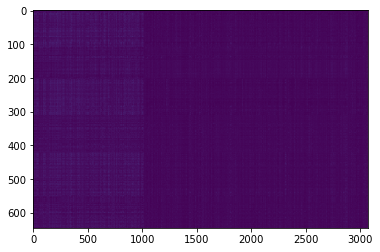

,AUC,pAUC
Source_0,0.658803,0.610822
Source_1,0.907750,0.811837
Source_2,0.707394,0.606605
Target_0,0.845583,0.723542
Target_1,0.914866,0.826637
Target_2,0.762222,0.675856
mean,0.799436,0.709217
h_mean,0.787320,0.698580


2021-04-23 22:39:50,744 - pytorch_modeler.py - INFO - epoch:82/300, train_losses:0.224149, val_AUC_hmean:0.787320, val_pAUC_hmean:0.698580, best_flag:True
2021-04-23 22:39:50,746 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 22:39:51,183 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:39:51,367 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:39:51,551 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:0.224145, val_AUC_hmean:0.802753, val_pAUC_hmean:0.696410, best_flag:False
2021-04-23 22:39:51,552 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.82it/s]
2021-04-23 22:39:51,969 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
2021-04-23 22:39:52,147 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-23 22:39:52,325 -

100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 22:40:04,277 - pytorch_modeler.py - INFO - epoch:99/300, train_losses:0.205344, val_AUC_hmean:0.819163, val_pAUC_hmean:0.695321, best_flag:False
2021-04-23 22:40:04,278 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.61it/s]
2021-04-23 22:40:04,715 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:40:04,895 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-23 22:40:05,071 - pytorch_modeler.py - INFO - epoch:100/300, train_losses:0.203297, val_AUC_hmean:0.810819, val_pAUC_hmean:0.693445, best_flag:False
2021-04-23 22:40:05,072 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.82it/s]
2021-04-23 22:40:05,489 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:40:05,670 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [0

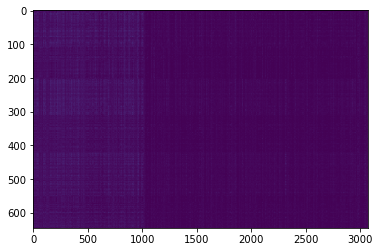

,AUC,pAUC
Source_0,0.723614,0.614806
Source_1,0.938529,0.829164
Source_2,0.717727,0.597353
Target_0,0.878665,0.748416
Target_1,0.929698,0.823117
Target_2,0.788413,0.661863
mean,0.829441,0.712453
h_mean,0.819357,0.700235


2021-04-23 22:40:06,720 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:0.204312, val_AUC_hmean:0.819357, val_pAUC_hmean:0.700235, best_flag:True
2021-04-23 22:40:06,721 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.68it/s]
2021-04-23 22:40:07,150 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:40:07,337 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:40:07,526 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:0.200986, val_AUC_hmean:0.807863, val_pAUC_hmean:0.696496, best_flag:False
2021-04-23 22:40:07,528 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.68it/s]
2021-04-23 22:40:07,957 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2021-04-23 22:40:08,148 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-23 22:40:08,325

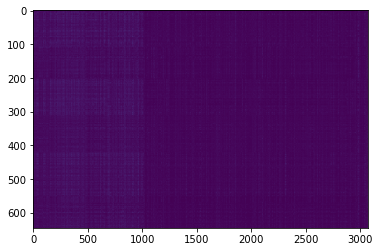

,AUC,pAUC
Source_0,0.706862,0.610436
Source_1,0.929612,0.814725
Source_2,0.722893,0.603003
Target_0,0.885802,0.761716
Target_1,0.936557,0.833225
Target_2,0.782381,0.671679
mean,0.827351,0.715797
h_mean,0.816486,0.703752


2021-04-23 22:40:13,177 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:0.194973, val_AUC_hmean:0.816486, val_pAUC_hmean:0.703752, best_flag:True
2021-04-23 22:40:13,178 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.78it/s]
2021-04-23 22:40:13,599 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 22:40:13,777 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.47it/s]
2021-04-23 22:40:13,953 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:0.190394, val_AUC_hmean:0.809314, val_pAUC_hmean:0.698415, best_flag:False
2021-04-23 22:40:13,954 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-23 22:40:14,374 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 22:40:14,560 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 22:40:14,742

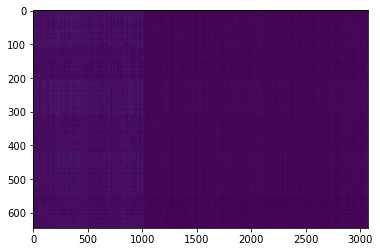

,AUC,pAUC
Source_0,0.697289,0.608123
Source_1,0.928241,0.819508
Source_2,0.718398,0.608865
Target_0,0.872203,0.753797
Target_1,0.925583,0.831149
Target_2,0.775556,0.672515
mean,0.819545,0.715659
h_mean,0.808654,0.703913


2021-04-23 22:40:16,447 - pytorch_modeler.py - INFO - epoch:111/300, train_losses:0.186278, val_AUC_hmean:0.808654, val_pAUC_hmean:0.703913, best_flag:True
2021-04-23 22:40:16,448 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-23 22:40:16,881 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:40:17,062 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:40:17,246 - pytorch_modeler.py - INFO - epoch:112/300, train_losses:0.185941, val_AUC_hmean:0.818349, val_pAUC_hmean:0.697793, best_flag:False
2021-04-23 22:40:17,248 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:40:17,701 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:40:17,886 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-23 22:40:18,061

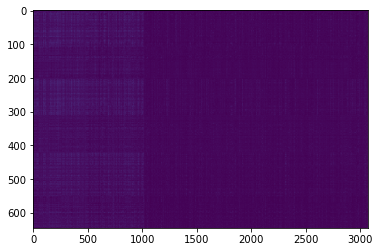

,AUC,pAUC
Source_0,0.674335,0.619176
Source_1,0.911866,0.820861
Source_2,0.723698,0.608865
Target_0,0.865066,0.734507
Target_1,0.927898,0.840806
Target_2,0.766032,0.670635
mean,0.811482,0.715808
h_mean,0.799946,0.704424


2021-04-23 22:40:23,729 - pytorch_modeler.py - INFO - epoch:119/300, train_losses:0.179346, val_AUC_hmean:0.799946, val_pAUC_hmean:0.704424, best_flag:True
2021-04-23 22:40:23,730 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-23 22:40:24,156 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:40:24,334 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-23 22:40:24,510 - pytorch_modeler.py - INFO - epoch:120/300, train_losses:0.175545, val_AUC_hmean:0.805257, val_pAUC_hmean:0.700363, best_flag:False
2021-04-23 22:40:24,512 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:40:24,948 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 22:40:25,142 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 22:40:25,322

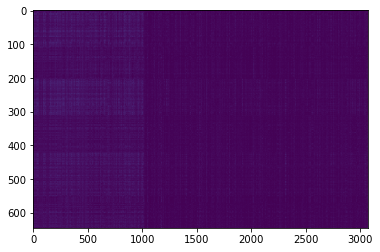

,AUC,pAUC
Source_0,0.689475,0.618662
Source_1,0.936300,0.819417
Source_2,0.714842,0.601873
Target_0,0.870274,0.752985
Target_1,0.939386,0.837557
Target_2,0.760476,0.671679
mean,0.818459,0.717029
h_mean,0.805815,0.705131


2021-04-23 22:40:30,201 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:0.174374, val_AUC_hmean:0.805815, val_pAUC_hmean:0.705131, best_flag:True
2021-04-23 22:40:30,202 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.82it/s]
2021-04-23 22:40:30,619 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:40:30,800 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:40:30,981 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:0.171471, val_AUC_hmean:0.808310, val_pAUC_hmean:0.694837, best_flag:False
2021-04-23 22:40:30,982 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.86it/s]
2021-04-23 22:40:31,396 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 22:40:31,575 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-23 22:40:31,751

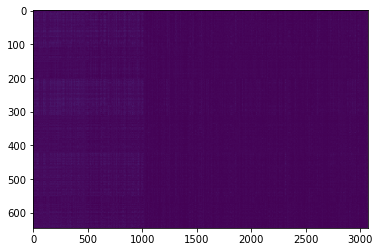

,AUC,pAUC
Source_0,0.704225,0.616349
Source_1,0.928069,0.820591
Source_2,0.711084,0.606888
Target_0,0.873167,0.755218
Target_1,0.929870,0.845047
Target_2,0.774524,0.664160
mean,0.820157,0.718042
h_mean,0.809105,0.705717


2021-04-23 22:40:41,304 - pytorch_modeler.py - INFO - epoch:139/300, train_losses:0.160349, val_AUC_hmean:0.809105, val_pAUC_hmean:0.705717, best_flag:True
2021-04-23 22:40:41,305 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.33it/s]
2021-04-23 22:40:41,769 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:40:41,949 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.41it/s]
2021-04-23 22:40:42,126 - pytorch_modeler.py - INFO - epoch:140/300, train_losses:0.160268, val_AUC_hmean:0.810040, val_pAUC_hmean:0.693944, best_flag:False
2021-04-23 22:40:42,127 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-23 22:40:42,550 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-23 22:40:42,727 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:40:42,907

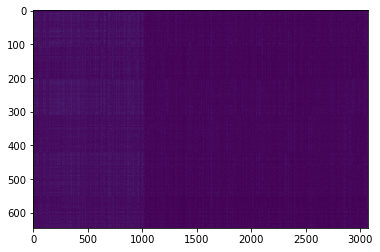

,AUC,pAUC
Source_0,0.722979,0.623803
Source_1,0.934242,0.821854
Source_2,0.736447,0.607594
Target_0,0.880208,0.755929
Target_1,0.942644,0.843694
Target_2,0.784921,0.666458
mean,0.833573,0.719889
h_mean,0.823907,0.708025


2021-04-23 22:40:49,396 - pytorch_modeler.py - INFO - epoch:148/300, train_losses:0.150499, val_AUC_hmean:0.823907, val_pAUC_hmean:0.708025, best_flag:True
2021-04-23 22:40:49,397 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 22:40:49,854 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2021-04-23 22:40:50,045 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-23 22:40:50,225 - pytorch_modeler.py - INFO - epoch:149/300, train_losses:0.148435, val_AUC_hmean:0.803571, val_pAUC_hmean:0.693594, best_flag:False
2021-04-23 22:40:50,226 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-23 22:40:50,650 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:40:50,834 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.37it/s]
2021-04-23 22:40:51,012

100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:41:02,826 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-23 22:41:03,005 - pytorch_modeler.py - INFO - epoch:165/300, train_losses:0.139334, val_AUC_hmean:0.804374, val_pAUC_hmean:0.697682, best_flag:False
2021-04-23 22:41:03,006 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-23 22:41:03,429 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:41:03,622 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:41:03,809 - pytorch_modeler.py - INFO - epoch:166/300, train_losses:0.136931, val_AUC_hmean:0.823843, val_pAUC_hmean:0.700652, best_flag:False
2021-04-23 22:41:03,811 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.67it/s]
2021-04-23 22:41:04,241 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

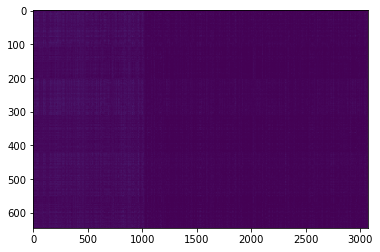

,AUC,pAUC
Source_0,0.702418,0.634342
Source_1,0.943844,0.845589
Source_2,0.736447,0.592903
Target_0,0.889950,0.759280
Target_1,0.945216,0.854523
Target_2,0.788333,0.663325
mean,0.834368,0.724994
h_mean,0.822917,0.710859


2021-04-23 22:41:10,210 - pytorch_modeler.py - INFO - epoch:173/300, train_losses:0.136562, val_AUC_hmean:0.822917, val_pAUC_hmean:0.710859, best_flag:True
2021-04-23 22:41:10,210 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.62it/s]
2021-04-23 22:41:10,765 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:41:10,946 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-23 22:41:11,124 - pytorch_modeler.py - INFO - epoch:174/300, train_losses:0.141890, val_AUC_hmean:0.798640, val_pAUC_hmean:0.689133, best_flag:False
2021-04-23 22:41:11,125 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.54it/s]
2021-04-23 22:41:11,692 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:41:11,876 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:41:12,057

100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:41:25,697 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


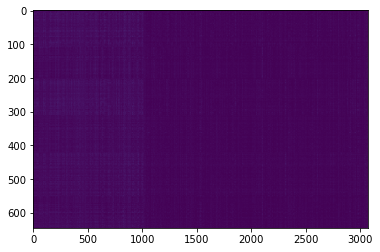

,AUC,pAUC
Source_0,0.703834,0.625474
Source_1,0.933128,0.861201
Source_2,0.735306,0.603568
Target_0,0.878569,0.755625
Target_1,0.943244,0.847213
Target_2,0.791667,0.676692
mean,0.830958,0.728295
h_mean,0.820347,0.714431


2021-04-23 22:41:26,780 - pytorch_modeler.py - INFO - epoch:190/300, train_losses:0.125874, val_AUC_hmean:0.820347, val_pAUC_hmean:0.714431, best_flag:True
2021-04-23 22:41:26,781 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.61it/s]
2021-04-23 22:41:27,338 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:41:27,517 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:41:27,697 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:0.124052, val_AUC_hmean:0.791694, val_pAUC_hmean:0.697578, best_flag:False
2021-04-23 22:41:27,698 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.68it/s]
2021-04-23 22:41:28,243 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:41:28,423 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:41:28,614

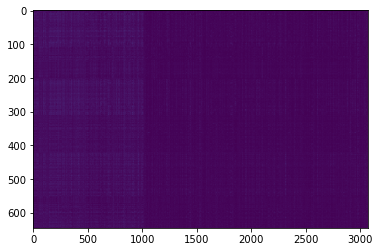

,AUC,pAUC
Source_0,0.702076,0.623803
Source_1,0.943930,0.850823
Source_2,0.734903,0.618400
Target_0,0.883777,0.753289
Target_1,0.946416,0.848928
Target_2,0.771349,0.677736
mean,0.830409,0.728830
h_mean,0.818663,0.716294


2021-04-23 22:41:32,267 - pytorch_modeler.py - INFO - epoch:195/300, train_losses:0.120823, val_AUC_hmean:0.818663, val_pAUC_hmean:0.716294, best_flag:True
2021-04-23 22:41:32,268 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.35it/s]
2021-04-23 22:41:32,867 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 22:41:33,055 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]
2021-04-23 22:41:33,252 - pytorch_modeler.py - INFO - epoch:196/300, train_losses:0.120376, val_AUC_hmean:0.820436, val_pAUC_hmean:0.706908, best_flag:False
2021-04-23 22:41:33,253 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.67it/s]
2021-04-23 22:41:33,801 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:41:33,981 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:41:34,164

100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:41:47,641 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-23 22:41:47,816 - pytorch_modeler.py - INFO - epoch:212/300, train_losses:0.110209, val_AUC_hmean:0.810988, val_pAUC_hmean:0.698285, best_flag:False
2021-04-23 22:41:47,817 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:41:48,390 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:41:48,577 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-23 22:41:48,756 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:0.110133, val_AUC_hmean:0.808620, val_pAUC_hmean:0.698662, best_flag:False
2021-04-23 22:41:48,757 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.68it/s]
2021-04-23 22:41:49,304 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  3.65it/s]
2021-04-23 22:42:03,142 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:42:03,323 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-23 22:42:03,503 - pytorch_modeler.py - INFO - epoch:229/300, train_losses:0.100840, val_AUC_hmean:0.810797, val_pAUC_hmean:0.697032, best_flag:False
2021-04-23 22:42:03,504 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.56it/s]
2021-04-23 22:42:04,069 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-23 22:42:04,247 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:42:04,429 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:0.099743, val_AUC_hmean:0.805068, val_pAUC_hmean:0.700633, best_flag:False
2021-04-23 22:42:04,430 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-23 22:42:18,173 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.69it/s]
2021-04-23 22:42:18,717 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 22:42:18,896 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:42:19,082 - pytorch_modeler.py - INFO - epoch:246/300, train_losses:0.096782, val_AUC_hmean:0.813398, val_pAUC_hmean:0.705825, best_flag:False
2021-04-23 22:42:19,083 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
2021-04-23 22:42:19,649 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:42:19,834 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-23 22:42:20,015 - pytorch_modeler.py - INFO - epoch:247/300, train_losses:0.097301, val_AUC_hmean:0.784600, val_pAUC_hmean:0.706373, best_flag:False
2021-04-23 22:42:20,01

2021-04-23 22:42:33,869 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.59it/s]
2021-04-23 22:42:34,429 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 22:42:34,619 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:42:34,802 - pytorch_modeler.py - INFO - epoch:263/300, train_losses:0.089460, val_AUC_hmean:0.802044, val_pAUC_hmean:0.682939, best_flag:False
2021-04-23 22:42:34,803 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.62it/s]
2021-04-23 22:42:35,360 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 22:42:35,538 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-23 22:42:35,713 - pytorch_modeler.py - INFO - epoch:264/300, train_losses:0.088166, val_AUC_hmean:0.806445, val_pAUC_hmean:0.676175, best_flag:False
2021-04-23 22:42:35,71

2021-04-23 22:42:49,724 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-23 22:42:50,323 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  4.76it/s]
2021-04-23 22:42:50,556 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.24it/s]
2021-04-23 22:42:50,773 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:0.079694, val_AUC_hmean:0.808641, val_pAUC_hmean:0.696147, best_flag:False
2021-04-23 22:42:50,774 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.19it/s]
2021-04-23 22:42:51,402 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:42:51,596 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 22:42:51,780 - pytorch_modeler.py - INFO - epoch:281/300, train_losses:0.079129, val_AUC_hmean:0.828055, val_pAUC_hmean:0.704851, best_flag:False
2021-04-23 22:42:51,78

2021-04-23 22:43:06,775 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.61it/s]
2021-04-23 22:43:07,331 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.70it/s]
2021-04-23 22:43:07,527 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-23 22:43:07,729 - pytorch_modeler.py - INFO - epoch:297/300, train_losses:0.076804, val_AUC_hmean:0.806034, val_pAUC_hmean:0.687005, best_flag:False
2021-04-23 22:43:07,730 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
2021-04-23 22:43:08,295 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:43:08,484 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2021-04-23 22:43:08,684 - pytorch_modeler.py - INFO - epoch:298/300, train_losses:0.077963, val_AUC_hmean:0.807087, val_pAUC_hmean:0.694831, best_flag:False
2021-04-23 22:43:08,68

,AUC,pAUC
Source_0,0.702076,0.623803
Source_1,0.943930,0.850823
Source_2,0.734903,0.618400
Target_0,0.883777,0.753289
Target_1,0.946416,0.848928
Target_2,0.771349,0.677736
mean,0.830409,0.728830
h_mean,0.818663,0.716294


2021-04-23 22:43:10,730 - 00_train.py - INFO - TARGET MACHINE_TYPE: valve
2021-04-23 22:43:10,731 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-23 22:43:10,763 - 00_train.py - INFO - TRAINING


elapsed time: 296.538671494 [sec]
use: cuda:0


2021-04-23 22:43:10,954 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.51it/s]
2021-04-23 22:43:11,526 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]
2021-04-23 22:43:11,724 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


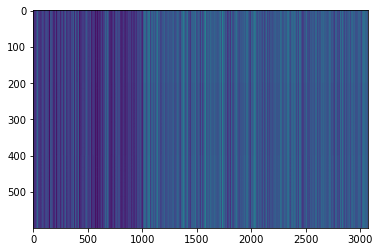

,AUC,pAUC
Source_0,0.520600,0.521053
Source_1,0.559000,0.515789
Source_2,0.463600,0.501053
Target_0,0.543000,0.504737
Target_1,0.511400,0.495789
Target_2,0.507800,0.493684
mean,0.517567,0.505351
h_mean,0.515769,0.505154


2021-04-23 22:43:12,752 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:51.829285, val_AUC_hmean:0.515769, val_pAUC_hmean:0.505154, best_flag:True
2021-04-23 22:43:12,753 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 22:43:13,336 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.19it/s]
2021-04-23 22:43:13,552 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


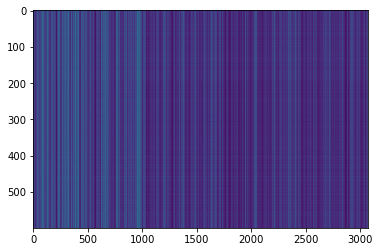

,AUC,pAUC
Source_0,0.511600,0.522632
Source_1,0.546800,0.514737
Source_2,0.461800,0.510000
Target_0,0.538900,0.503158
Target_1,0.509300,0.493684
Target_2,0.504200,0.504211
mean,0.512100,0.508070
h_mean,0.510579,0.507904


2021-04-23 22:43:14,708 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:13.145025, val_AUC_hmean:0.510579, val_pAUC_hmean:0.507904, best_flag:True
2021-04-23 22:43:14,709 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
2021-04-23 22:43:15,314 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:43:15,498 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


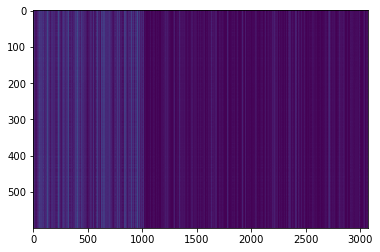

,AUC,pAUC
Source_0,0.506600,0.518947
Source_1,0.541900,0.514211
Source_2,0.457500,0.508421
Target_0,0.534000,0.500000
Target_1,0.517200,0.496316
Target_2,0.506100,0.512105
mean,0.510550,0.508333
h_mean,0.509029,0.508210


2021-04-23 22:43:16,640 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:6.548692, val_AUC_hmean:0.509029, val_pAUC_hmean:0.508210, best_flag:True
2021-04-23 22:43:16,641 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  2.90it/s]
2021-04-23 22:43:17,332 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  2.95it/s]
2021-04-23 22:43:17,691 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


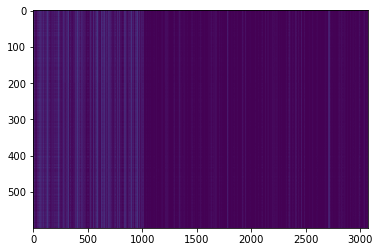

,AUC,pAUC
Source_0,0.512100,0.513684
Source_1,0.538000,0.511579
Source_2,0.462300,0.505789
Target_0,0.529100,0.496842
Target_1,0.511400,0.501579
Target_2,0.513100,0.522632
mean,0.511000,0.508684
h_mean,0.509817,0.508545


2021-04-23 22:43:19,062 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:4.448976, val_AUC_hmean:0.509817, val_pAUC_hmean:0.508545, best_flag:True
2021-04-23 22:43:19,063 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-23 22:43:19,522 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:43:19,721 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


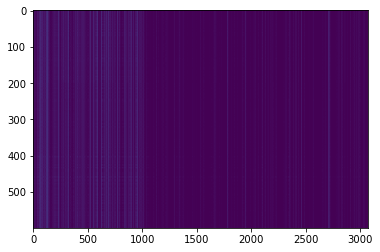

,AUC,pAUC
Source_0,0.506900,0.510526
Source_1,0.532700,0.513158
Source_2,0.452300,0.506316
Target_0,0.527600,0.500526
Target_1,0.504700,0.503158
Target_2,0.505800,0.519474
mean,0.505000,0.508860
h_mean,0.503578,0.508781


2021-04-23 22:43:20,797 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:2.718474, val_AUC_hmean:0.503578, val_pAUC_hmean:0.508781, best_flag:True
2021-04-23 22:43:20,798 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 22:43:21,250 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.53it/s]
2021-04-23 22:43:21,450 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


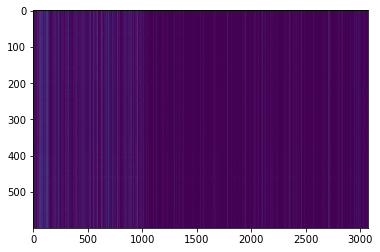

,AUC,pAUC
Source_0,0.483200,0.513684
Source_1,0.526000,0.506316
Source_2,0.435900,0.507895
Target_0,0.517900,0.506842
Target_1,0.567200,0.535263
Target_2,0.480200,0.510526
mean,0.501733,0.513421
h_mean,0.498291,0.513229


2021-04-23 22:43:22,557 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:1.922789, val_AUC_hmean:0.498291, val_pAUC_hmean:0.513229, best_flag:True
2021-04-23 22:43:22,558 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.25it/s]
2021-04-23 22:43:23,031 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:43:23,213 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:43:23,402 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:1.475054, val_AUC_hmean:0.504298, val_pAUC_hmean:0.501932, best_flag:False
2021-04-23 22:43:23,402 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 22:43:23,858 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:43:24,047 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:43:24,236 - p

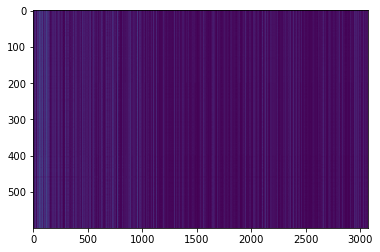

,AUC,pAUC
Source_0,0.495500,0.505789
Source_1,0.481300,0.485789
Source_2,0.495400,0.513158
Target_0,0.516100,0.508947
Target_1,0.631900,0.580526
Target_2,0.463200,0.503158
mean,0.513900,0.516228
h_mean,0.508756,0.514615


2021-04-23 22:43:27,576 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:0.742281, val_AUC_hmean:0.508756, val_pAUC_hmean:0.514615, best_flag:True
2021-04-23 22:43:27,577 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.67it/s]
2021-04-23 22:43:28,008 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-23 22:43:28,190 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


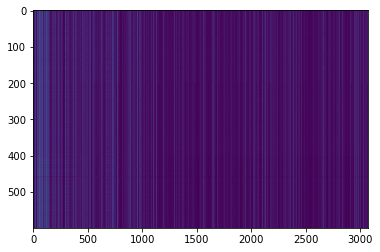

,AUC,pAUC
Source_0,0.506300,0.503158
Source_1,0.477700,0.485789
Source_2,0.498300,0.517368
Target_0,0.508400,0.511053
Target_1,0.648500,0.588421
Target_2,0.463100,0.503158
mean,0.517050,0.518158
h_mean,0.510915,0.516241


2021-04-23 22:43:29,263 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:0.685600, val_AUC_hmean:0.510915, val_pAUC_hmean:0.516241, best_flag:True
2021-04-23 22:43:29,264 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.66it/s]
2021-04-23 22:43:29,695 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.45it/s]
2021-04-23 22:43:29,900 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


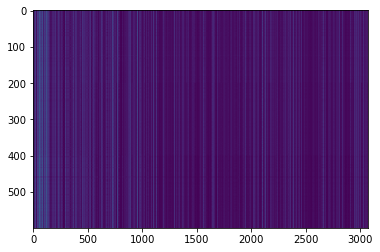

,AUC,pAUC
Source_0,0.498500,0.501053
Source_1,0.478300,0.485789
Source_2,0.505300,0.521053
Target_0,0.505100,0.508421
Target_1,0.657800,0.591053
Target_2,0.467000,0.504737
mean,0.518667,0.518684
h_mean,0.512071,0.516640


2021-04-23 22:43:30,950 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:0.634626, val_AUC_hmean:0.512071, val_pAUC_hmean:0.516640, best_flag:True
2021-04-23 22:43:30,950 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.21it/s]
2021-04-23 22:43:31,428 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:43:31,620 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


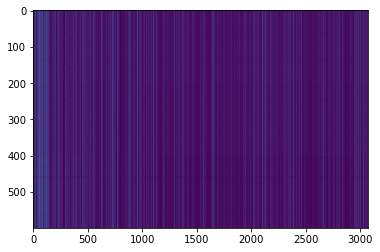

,AUC,pAUC
Source_0,0.48700,0.507368
Source_1,0.46670,0.485789
Source_2,0.52980,0.524737
Target_0,0.49870,0.510000
Target_1,0.65990,0.595263
Target_2,0.48180,0.505263
mean,0.52065,0.521404
h_mean,0.51371,0.519253


2021-04-23 22:43:32,839 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:0.541710, val_AUC_hmean:0.513710, val_pAUC_hmean:0.519253, best_flag:True
2021-04-23 22:43:32,841 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.88it/s]
2021-04-23 22:43:33,359 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  4.73it/s]
2021-04-23 22:43:33,596 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:43:33,792 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:0.510425, val_AUC_hmean:0.510446, val_pAUC_hmean:0.517953, best_flag:False
2021-04-23 22:43:33,794 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.18it/s]
2021-04-23 22:43:34,274 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:43:34,468 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


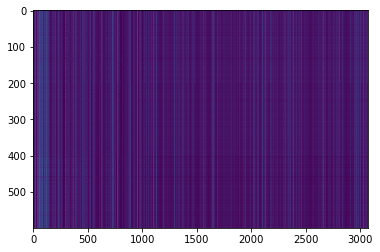

,AUC,pAUC
Source_0,0.482600,0.506316
Source_1,0.457800,0.481053
Source_2,0.542900,0.522105
Target_0,0.484700,0.507895
Target_1,0.653500,0.605263
Target_2,0.485500,0.510000
mean,0.517833,0.522105
h_mean,0.510572,0.519435


2021-04-23 22:43:35,568 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:0.477482, val_AUC_hmean:0.510572, val_pAUC_hmean:0.519435, best_flag:True
2021-04-23 22:43:35,569 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.07it/s]
2021-04-23 22:43:36,062 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2021-04-23 22:43:36,253 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


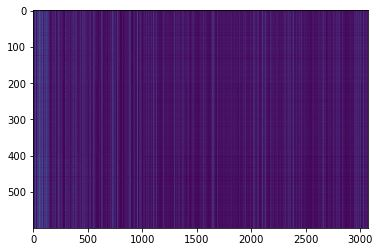

,AUC,pAUC
Source_0,0.477300,0.514211
Source_1,0.456300,0.481579
Source_2,0.540400,0.524211
Target_0,0.475200,0.501579
Target_1,0.653900,0.619474
Target_2,0.481800,0.507368
mean,0.514150,0.524737
h_mean,0.506485,0.521386


2021-04-23 22:43:37,403 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:0.436653, val_AUC_hmean:0.506485, val_pAUC_hmean:0.521386, best_flag:True
2021-04-23 22:43:37,404 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.23it/s]
2021-04-23 22:43:37,879 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:43:38,063 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


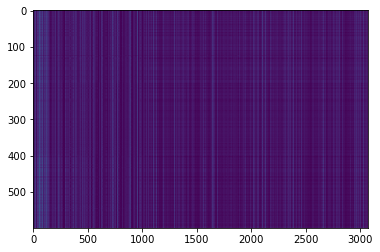

,AUC,pAUC
Source_0,0.480200,0.513684
Source_1,0.458900,0.481053
Source_2,0.548300,0.523684
Target_0,0.476400,0.498947
Target_1,0.654200,0.627895
Target_2,0.483100,0.509474
mean,0.516850,0.525789
h_mean,0.509207,0.521980


2021-04-23 22:43:39,126 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.415853, val_AUC_hmean:0.509207, val_pAUC_hmean:0.521980, best_flag:True
2021-04-23 22:43:39,127 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.20it/s]
2021-04-23 22:43:39,606 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:43:39,797 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-23 22:43:39,978 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:0.405379, val_AUC_hmean:0.510590, val_pAUC_hmean:0.521199, best_flag:False
2021-04-23 22:43:39,979 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-23 22:43:40,408 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:43:40,593 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:43:40,797 -

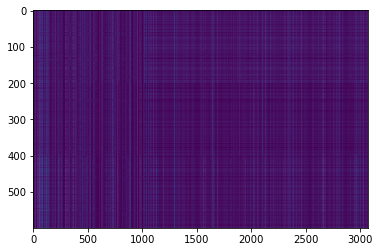

,AUC,pAUC
Source_0,0.496600,0.520000
Source_1,0.467700,0.490000
Source_2,0.562800,0.521579
Target_0,0.484800,0.500526
Target_1,0.665900,0.630526
Target_2,0.490600,0.496842
mean,0.528067,0.526579
h_mean,0.520318,0.522751


2021-04-23 22:43:44,345 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.361961, val_AUC_hmean:0.520318, val_pAUC_hmean:0.522751, best_flag:True
2021-04-23 22:43:44,346 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.30it/s]
2021-04-23 22:43:44,814 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.28it/s]
2021-04-23 22:43:45,027 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


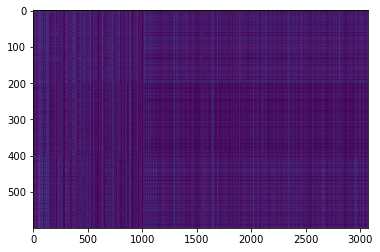

,AUC,pAUC
Source_0,0.501200,0.519474
Source_1,0.475100,0.491579
Source_2,0.578000,0.526316
Target_0,0.490600,0.502105
Target_1,0.665800,0.626316
Target_2,0.489300,0.501579
mean,0.533333,0.527895
h_mean,0.525664,0.524419


2021-04-23 22:43:46,115 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.353588, val_AUC_hmean:0.525664, val_pAUC_hmean:0.524419, best_flag:True
2021-04-23 22:43:46,116 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 22:43:46,555 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:43:46,739 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.77it/s]
2021-04-23 22:43:46,938 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:0.349319, val_AUC_hmean:0.524653, val_pAUC_hmean:0.523337, best_flag:False
2021-04-23 22:43:46,939 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:43:47,381 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:43:47,564 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


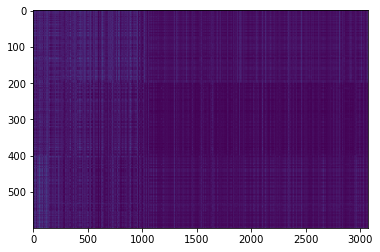

,AUC,pAUC
Source_0,0.509100,0.517895
Source_1,0.474700,0.492632
Source_2,0.577600,0.528947
Target_0,0.498600,0.500526
Target_1,0.683600,0.624737
Target_2,0.488500,0.503158
mean,0.538683,0.527982
h_mean,0.530144,0.524596


2021-04-23 22:43:48,640 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:0.341515, val_AUC_hmean:0.530144, val_pAUC_hmean:0.524596, best_flag:True
2021-04-23 22:43:48,641 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.39it/s]
2021-04-23 22:43:49,099 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 22:43:49,296 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:43:49,490 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.334322, val_AUC_hmean:0.530357, val_pAUC_hmean:0.524020, best_flag:False
2021-04-23 22:43:49,492 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-23 22:43:49,925 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:43:50,114 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


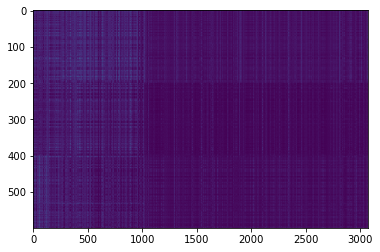

,AUC,pAUC
Source_0,0.503500,0.517895
Source_1,0.488000,0.495263
Source_2,0.581000,0.528947
Target_0,0.497800,0.500526
Target_1,0.685400,0.625789
Target_2,0.490300,0.506316
mean,0.541000,0.529123
h_mean,0.532677,0.525785


2021-04-23 22:43:51,261 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.325823, val_AUC_hmean:0.532677, val_pAUC_hmean:0.525785, best_flag:True
2021-04-23 22:43:51,262 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-23 22:43:51,723 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:43:51,914 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:43:52,111 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.323321, val_AUC_hmean:0.531594, val_pAUC_hmean:0.525696, best_flag:False
2021-04-23 22:43:52,112 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.42it/s]
2021-04-23 22:43:52,567 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:43:52,749 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


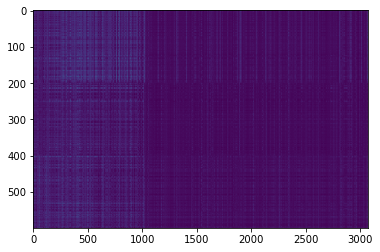

,AUC,pAUC
Source_0,0.527200,0.515789
Source_1,0.499200,0.504737
Source_2,0.573500,0.523158
Target_0,0.500900,0.501053
Target_1,0.696900,0.628421
Target_2,0.497400,0.513158
mean,0.549183,0.531053
h_mean,0.541248,0.527831


2021-04-23 22:43:53,844 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.314506, val_AUC_hmean:0.541248, val_pAUC_hmean:0.527831, best_flag:True
2021-04-23 22:43:53,845 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 22:43:54,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:43:54,481 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.81it/s]
2021-04-23 22:43:54,675 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.315144, val_AUC_hmean:0.532434, val_pAUC_hmean:0.522104, best_flag:False
2021-04-23 22:43:54,676 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-23 22:43:55,096 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:43:55,280 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.70it/s]
2021-04-23 22:43:55,477 -

100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:44:07,416 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:0.285746, val_AUC_hmean:0.545575, val_pAUC_hmean:0.520487, best_flag:False
2021-04-23 22:44:07,417 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.73it/s]
2021-04-23 22:44:07,842 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:44:08,020 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-23 22:44:08,196 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:0.279226, val_AUC_hmean:0.560379, val_pAUC_hmean:0.518787, best_flag:False
2021-04-23 22:44:08,198 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.30it/s]
2021-04-23 22:44:08,665 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:44:08,851 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 22:44:21,333 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-23 22:44:21,512 - pytorch_modeler.py - INFO - epoch:64/300, train_losses:0.241235, val_AUC_hmean:0.551891, val_pAUC_hmean:0.513468, best_flag:False
2021-04-23 22:44:21,513 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.39it/s]
2021-04-23 22:44:21,971 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-23 22:44:22,159 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:44:22,352 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:0.241615, val_AUC_hmean:0.551625, val_pAUC_hmean:0.513435, best_flag:False
2021-04-23 22:44:22,354 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 22:44:22,811 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00

100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-23 22:44:35,156 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 22:44:35,346 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:44:35,540 - pytorch_modeler.py - INFO - epoch:81/300, train_losses:0.217009, val_AUC_hmean:0.563438, val_pAUC_hmean:0.516611, best_flag:False
2021-04-23 22:44:35,540 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.71it/s]
2021-04-23 22:44:35,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:44:36,158 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.60it/s]
2021-04-23 22:44:36,361 - pytorch_modeler.py - INFO - epoch:82/300, train_losses:0.214437, val_AUC_hmean:0.557166, val_pAUC_hmean:0.516841, best_flag:False
2021-04-23 22:44:36,362 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00

2021-04-23 22:44:48,851 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 22:44:49,288 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  4.73it/s]
2021-04-23 22:44:49,527 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-23 22:44:49,708 - pytorch_modeler.py - INFO - epoch:98/300, train_losses:0.195933, val_AUC_hmean:0.556955, val_pAUC_hmean:0.513925, best_flag:False
2021-04-23 22:44:49,709 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.84it/s]
2021-04-23 22:44:50,232 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:44:50,427 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:44:50,622 - pytorch_modeler.py - INFO - epoch:99/300, train_losses:0.192177, val_AUC_hmean:0.553265, val_pAUC_hmean:0.512813, best_flag:False
2021-04-23 22:44:50,624 

2021-04-23 22:45:03,273 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 22:45:03,712 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:45:03,902 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.55it/s]
2021-04-23 22:45:04,108 - pytorch_modeler.py - INFO - epoch:115/300, train_losses:0.176323, val_AUC_hmean:0.544214, val_pAUC_hmean:0.514618, best_flag:False
2021-04-23 22:45:04,109 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.35it/s]
2021-04-23 22:45:04,572 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 22:45:04,758 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-23 22:45:04,939 - pytorch_modeler.py - INFO - epoch:116/300, train_losses:0.192334, val_AUC_hmean:0.530503, val_pAUC_hmean:0.516760, best_flag:False
2021-04-23 22:45:04,94

2021-04-23 22:45:17,688 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.89it/s]
2021-04-23 22:45:18,205 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 22:45:18,386 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:45:18,577 - pytorch_modeler.py - INFO - epoch:132/300, train_losses:0.181223, val_AUC_hmean:0.569673, val_pAUC_hmean:0.517305, best_flag:False
2021-04-23 22:45:18,578 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-23 22:45:19,038 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.26it/s]
2021-04-23 22:45:19,252 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.26it/s]
2021-04-23 22:45:19,474 - pytorch_modeler.py - INFO - epoch:133/300, train_losses:0.194554, val_AUC_hmean:0.569561, val_pAUC_hmean:0.515485, best_flag:False
2021-04-23 22:45:19,47

2021-04-23 22:45:32,300 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.43it/s]
2021-04-23 22:45:32,754 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-23 22:45:32,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]
2021-04-23 22:45:33,131 - pytorch_modeler.py - INFO - epoch:149/300, train_losses:0.156995, val_AUC_hmean:0.570767, val_pAUC_hmean:0.515206, best_flag:False
2021-04-23 22:45:33,132 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-23 22:45:33,555 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 22:45:33,747 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:45:33,937 - pytorch_modeler.py - INFO - epoch:150/300, train_losses:0.158922, val_AUC_hmean:0.574225, val_pAUC_hmean:0.513506, best_flag:False
2021-04-23 22:45:33,93

2021-04-23 22:45:47,571 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.22it/s]
2021-04-23 22:45:48,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:45:48,241 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.70it/s]
2021-04-23 22:45:48,442 - pytorch_modeler.py - INFO - epoch:166/300, train_losses:0.143442, val_AUC_hmean:0.574150, val_pAUC_hmean:0.514709, best_flag:False
2021-04-23 22:45:48,443 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:45:48,880 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.48it/s]
2021-04-23 22:45:49,092 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  4.45it/s]
2021-04-23 22:45:49,342 - pytorch_modeler.py - INFO - epoch:167/300, train_losses:0.139881, val_AUC_hmean:0.572659, val_pAUC_hmean:0.513382, best_flag:False
2021-04-23 22:45:49,34

2021-04-23 22:46:01,951 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.62it/s]
2021-04-23 22:46:02,386 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]
2021-04-23 22:46:02,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:46:02,766 - pytorch_modeler.py - INFO - epoch:183/300, train_losses:0.129014, val_AUC_hmean:0.573812, val_pAUC_hmean:0.513253, best_flag:False
2021-04-23 22:46:02,768 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:46:03,220 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.77it/s]
2021-04-23 22:46:03,415 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:46:03,599 - pytorch_modeler.py - INFO - epoch:184/300, train_losses:0.130312, val_AUC_hmean:0.580101, val_pAUC_hmean:0.513587, best_flag:False
2021-04-23 22:46:03,60

2021-04-23 22:46:16,063 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 22:46:16,518 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.64it/s]
2021-04-23 22:46:16,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.70it/s]
2021-04-23 22:46:16,919 - pytorch_modeler.py - INFO - epoch:200/300, train_losses:0.124273, val_AUC_hmean:0.564654, val_pAUC_hmean:0.513015, best_flag:False
2021-04-23 22:46:16,921 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.67it/s]
2021-04-23 22:46:17,352 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-23 22:46:17,542 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 22:46:17,727 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:0.123112, val_AUC_hmean:0.578094, val_pAUC_hmean:0.514561, best_flag:False
2021-04-23 22:46:17,72

2021-04-23 22:46:30,317 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.70it/s]
2021-04-23 22:46:30,746 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-23 22:46:30,925 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:46:31,117 - pytorch_modeler.py - INFO - epoch:217/300, train_losses:0.120765, val_AUC_hmean:0.573249, val_pAUC_hmean:0.515507, best_flag:False
2021-04-23 22:46:31,119 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:46:31,561 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-23 22:46:31,737 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  4.51it/s]
2021-04-23 22:46:31,983 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:0.116892, val_AUC_hmean:0.589476, val_pAUC_hmean:0.514268, best_flag:False
2021-04-23 22:46:31,98

2021-04-23 22:46:44,464 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:46:44,901 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2021-04-23 22:46:45,092 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:46:45,275 - pytorch_modeler.py - INFO - epoch:234/300, train_losses:0.107092, val_AUC_hmean:0.598185, val_pAUC_hmean:0.513078, best_flag:False
2021-04-23 22:46:45,276 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.70it/s]
2021-04-23 22:46:45,819 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-23 22:46:45,998 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-23 22:46:46,177 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:0.106729, val_AUC_hmean:0.593092, val_pAUC_hmean:0.513468, best_flag:False
2021-04-23 22:46:46,17

2021-04-23 22:47:00,197 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-23 22:47:00,624 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]
2021-04-23 22:47:00,821 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.56it/s]
2021-04-23 22:47:01,023 - pytorch_modeler.py - INFO - epoch:251/300, train_losses:0.100078, val_AUC_hmean:0.581374, val_pAUC_hmean:0.512278, best_flag:False
2021-04-23 22:47:01,024 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-23 22:47:01,458 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:47:01,649 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 22:47:01,836 - pytorch_modeler.py - INFO - epoch:252/300, train_losses:0.100182, val_AUC_hmean:0.589392, val_pAUC_hmean:0.512712, best_flag:False
2021-04-23 22:47:01,83

2021-04-23 22:47:14,606 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:47:15,055 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.73it/s]
2021-04-23 22:47:15,250 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  4.97it/s]
2021-04-23 22:47:15,476 - pytorch_modeler.py - INFO - epoch:268/300, train_losses:0.095060, val_AUC_hmean:0.573308, val_pAUC_hmean:0.512437, best_flag:False
2021-04-23 22:47:15,477 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.90it/s]
2021-04-23 22:47:15,992 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.37it/s]
2021-04-23 22:47:16,205 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.01it/s]
2021-04-23 22:47:16,430 - pytorch_modeler.py - INFO - epoch:269/300, train_losses:0.094340, val_AUC_hmean:0.571843, val_pAUC_hmean:0.513258, best_flag:False
2021-04-23 22:47:16,43

2021-04-23 22:47:29,032 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 22:47:29,474 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:47:29,659 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:47:29,848 - pytorch_modeler.py - INFO - epoch:285/300, train_losses:0.087959, val_AUC_hmean:0.580163, val_pAUC_hmean:0.511973, best_flag:False
2021-04-23 22:47:29,849 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 22:47:30,302 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.64it/s]
2021-04-23 22:47:30,500 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:47:30,686 - pytorch_modeler.py - INFO - epoch:286/300, train_losses:0.086148, val_AUC_hmean:0.574302, val_pAUC_hmean:0.512507, best_flag:False
2021-04-23 22:47:30,68

,AUC,pAUC
Source_0,0.527200,0.515789
Source_1,0.499200,0.504737
Source_2,0.573500,0.523158
Target_0,0.500900,0.501053
Target_1,0.696900,0.628421
Target_2,0.497400,0.513158
mean,0.549183,0.531053
h_mean,0.541248,0.527831


2021-04-23 22:47:42,266 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyTrain
2021-04-23 22:47:42,267 - 00_train.py - INFO - MAKE DATA_LOADER


elapsed time: 271.535417795 [sec]


2021-04-23 22:47:42,785 - 00_train.py - INFO - TRAINING
2021-04-23 22:47:42,983 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:47:43,435 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-23 22:47:43,630 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


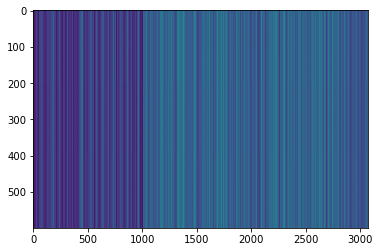

,AUC,pAUC
Source_0,0.267500,0.478947
Source_1,0.497200,0.533158
Source_2,0.472800,0.508947
Target_0,0.191900,0.474211
Target_1,0.429200,0.488421
Target_2,0.405600,0.500526
mean,0.377367,0.497368
h_mean,0.335738,0.496588


2021-04-23 22:47:44,682 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:50.340780, val_AUC_hmean:0.335738, val_pAUC_hmean:0.496588, best_flag:True
2021-04-23 22:47:44,683 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 22:47:45,269 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:47:45,453 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:47:45,639 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:13.096863, val_AUC_hmean:0.348571, val_pAUC_hmean:0.488910, best_flag:False
2021-04-23 22:47:45,641 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.56it/s]
2021-04-23 22:47:46,205 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.27it/s]
2021-04-23 22:47:46,421 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 22:47:46,615 -

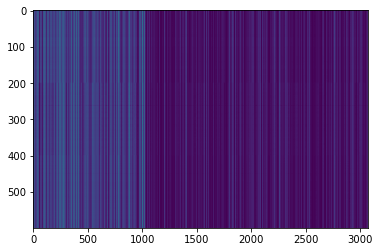

,AUC,pAUC
Source_0,0.304900,0.474211
Source_1,0.520600,0.488421
Source_2,0.551300,0.511053
Target_0,0.257300,0.477895
Target_1,0.520100,0.503158
Target_2,0.572800,0.641579
mean,0.454500,0.516053
h_mean,0.411818,0.510571


2021-04-23 22:47:52,238 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:1.081740, val_AUC_hmean:0.411818, val_pAUC_hmean:0.510571, best_flag:True
2021-04-23 22:47:52,239 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.40it/s]
2021-04-23 22:47:52,828 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:47:53,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:47:53,199 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:0.894328, val_AUC_hmean:0.493672, val_pAUC_hmean:0.510277, best_flag:False
2021-04-23 22:47:53,200 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
2021-04-23 22:47:53,779 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:47:53,963 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:47:54,150 - p

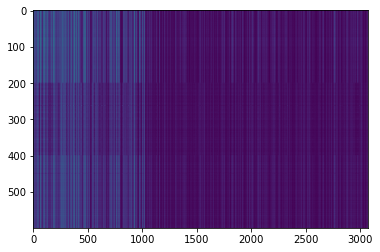

,AUC,pAUC
Source_0,0.313000,0.473684
Source_1,0.438400,0.483158
Source_2,0.487500,0.492632
Target_0,0.752900,0.668947
Target_1,0.487800,0.500526
Target_2,0.601600,0.513158
mean,0.513533,0.522018
h_mean,0.477416,0.514922


2021-04-23 22:47:59,779 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:0.471988, val_AUC_hmean:0.477416, val_pAUC_hmean:0.514922, best_flag:True
2021-04-23 22:47:59,780 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.53it/s]
2021-04-23 22:48:00,349 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:48:00,534 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


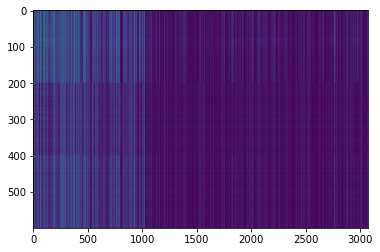

,AUC,pAUC
Source_0,0.335800,0.473684
Source_1,0.454000,0.486316
Source_2,0.482000,0.507895
Target_0,0.759700,0.666316
Target_1,0.510400,0.493684
Target_2,0.608300,0.512632
mean,0.525033,0.523421
h_mean,0.492822,0.516645


2021-04-23 22:48:01,564 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:0.440394, val_AUC_hmean:0.492822, val_pAUC_hmean:0.516645, best_flag:True
2021-04-23 22:48:01,565 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.31it/s]
2021-04-23 22:48:02,171 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 22:48:02,357 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


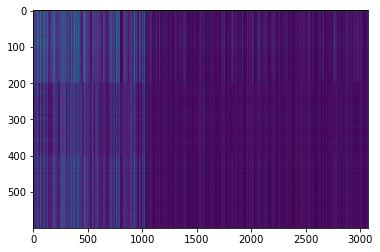

,AUC,pAUC
Source_0,0.364900,0.473684
Source_1,0.456800,0.493684
Source_2,0.498600,0.505263
Target_0,0.781900,0.674211
Target_1,0.518800,0.494211
Target_2,0.613100,0.503158
mean,0.539017,0.524035
h_mean,0.509651,0.516798


2021-04-23 22:48:03,401 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:0.428827, val_AUC_hmean:0.509651, val_pAUC_hmean:0.516798, best_flag:True
2021-04-23 22:48:03,401 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.42it/s]
2021-04-23 22:48:03,988 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:48:04,172 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


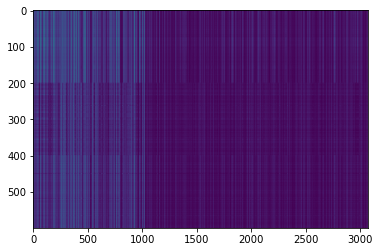

,AUC,pAUC
Source_0,0.342600,0.473684
Source_1,0.465300,0.494211
Source_2,0.486400,0.501053
Target_0,0.771600,0.672632
Target_1,0.517300,0.492632
Target_2,0.612200,0.515789
mean,0.532567,0.525000
h_mean,0.500563,0.517879


2021-04-23 22:48:05,223 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.392646, val_AUC_hmean:0.500563, val_pAUC_hmean:0.517879, best_flag:True
2021-04-23 22:48:05,224 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
2021-04-23 22:48:05,829 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.33it/s]
2021-04-23 22:48:06,150 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2021-04-23 22:48:06,477 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:0.371693, val_AUC_hmean:0.515782, val_pAUC_hmean:0.516975, best_flag:False
2021-04-23 22:48:06,478 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-23 22:48:07,076 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.28it/s]
2021-04-23 22:48:07,403 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.34it/s]
2021-04-23 22:48:07,726 -

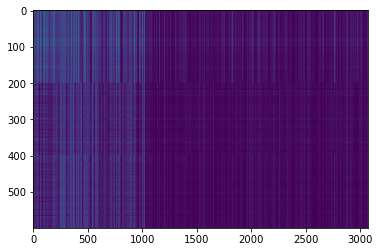

,AUC,pAUC
Source_0,0.327800,0.473684
Source_1,0.480500,0.506316
Source_2,0.484200,0.505263
Target_0,0.769200,0.681579
Target_1,0.515000,0.495789
Target_2,0.618700,0.494737
mean,0.532567,0.526228
h_mean,0.497712,0.518548


2021-04-23 22:48:10,014 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:0.344838, val_AUC_hmean:0.497712, val_pAUC_hmean:0.518548, best_flag:True
2021-04-23 22:48:10,015 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:48:10,463 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-23 22:48:10,644 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


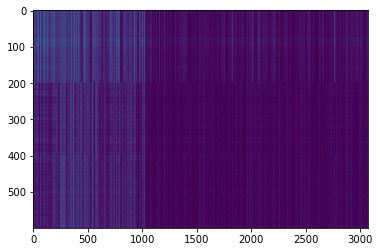

,AUC,pAUC
Source_0,0.326400,0.473684
Source_1,0.478000,0.506842
Source_2,0.487400,0.507368
Target_0,0.772900,0.688947
Target_1,0.516200,0.491053
Target_2,0.632000,0.494737
mean,0.535483,0.527105
h_mean,0.499134,0.518839


2021-04-23 22:48:11,716 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.342782, val_AUC_hmean:0.499134, val_pAUC_hmean:0.518839, best_flag:True
2021-04-23 22:48:11,717 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.29it/s]
2021-04-23 22:48:12,185 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.62it/s]
2021-04-23 22:48:12,383 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


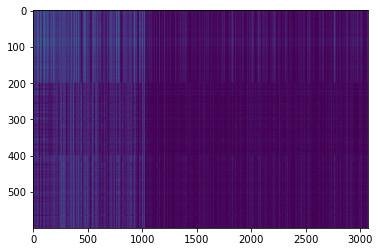

,AUC,pAUC
Source_0,0.301000,0.473684
Source_1,0.474500,0.505789
Source_2,0.472300,0.508421
Target_0,0.760300,0.682105
Target_1,0.509300,0.491053
Target_2,0.620900,0.515789
mean,0.523050,0.529474
h_mean,0.482457,0.521904


2021-04-23 22:48:13,467 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.327362, val_AUC_hmean:0.482457, val_pAUC_hmean:0.521904, best_flag:True
2021-04-23 22:48:13,467 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.27it/s]
2021-04-23 22:48:13,939 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-23 22:48:14,136 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


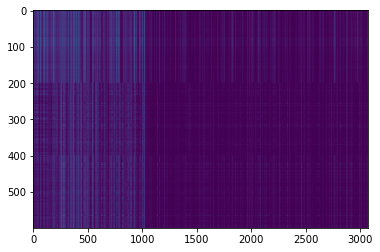

,AUC,pAUC
Source_0,0.344900,0.473684
Source_1,0.474800,0.508947
Source_2,0.486300,0.505789
Target_0,0.784800,0.701579
Target_1,0.510600,0.489474
Target_2,0.643100,0.525789
mean,0.540750,0.534211
h_mean,0.506349,0.525241


2021-04-23 22:48:15,221 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.320571, val_AUC_hmean:0.506349, val_pAUC_hmean:0.525241, best_flag:True
2021-04-23 22:48:15,222 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-23 22:48:15,666 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:48:15,859 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]


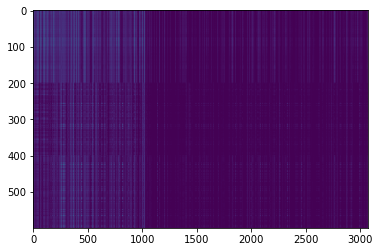

,AUC,pAUC
Source_0,0.319300,0.473684
Source_1,0.478000,0.506842
Source_2,0.485300,0.503158
Target_0,0.779300,0.710526
Target_1,0.507700,0.491053
Target_2,0.631400,0.531053
mean,0.533500,0.536053
h_mean,0.495003,0.526387


2021-04-23 22:48:16,933 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:0.317466, val_AUC_hmean:0.495003, val_pAUC_hmean:0.526387, best_flag:True
2021-04-23 22:48:16,934 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 22:48:17,377 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]
2021-04-23 22:48:17,566 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:48:17,759 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:0.309215, val_AUC_hmean:0.501313, val_pAUC_hmean:0.525838, best_flag:False
2021-04-23 22:48:17,760 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-23 22:48:18,221 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:48:18,413 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


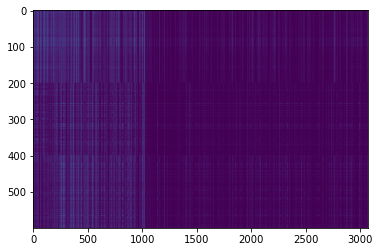

,AUC,pAUC
Source_0,0.34120,0.473684
Source_1,0.47790,0.507895
Source_2,0.49250,0.496842
Target_0,0.79250,0.726842
Target_1,0.50090,0.494737
Target_2,0.62840,0.525789
mean,0.53890,0.537632
h_mean,0.50406,0.526698


2021-04-23 22:48:19,519 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.299582, val_AUC_hmean:0.504060, val_pAUC_hmean:0.526698, best_flag:True
2021-04-23 22:48:19,520 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-23 22:48:19,980 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:48:20,168 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 22:48:20,359 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.295575, val_AUC_hmean:0.502308, val_pAUC_hmean:0.525594, best_flag:False
2021-04-23 22:48:20,360 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:48:20,801 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:48:20,996 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:48:21,184 -

100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 22:48:33,549 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:0.254389, val_AUC_hmean:0.529723, val_pAUC_hmean:0.522596, best_flag:False
2021-04-23 22:48:33,550 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-23 22:48:33,996 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 22:48:34,176 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


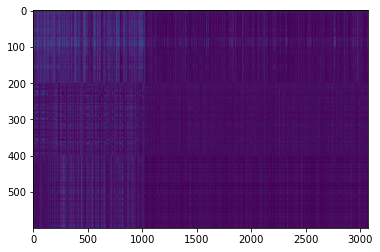

,AUC,pAUC
Source_0,0.3973,0.490000
Source_1,0.4903,0.504737
Source_2,0.5551,0.488421
Target_0,0.8278,0.718947
Target_1,0.4899,0.492105
Target_2,0.5858,0.529474
mean,0.5577,0.537281
h_mean,0.5303,0.527188


2021-04-23 22:48:35,296 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:0.252817, val_AUC_hmean:0.530300, val_pAUC_hmean:0.527188, best_flag:True
2021-04-23 22:48:35,297 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-23 22:48:35,748 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:48:35,941 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:48:36,138 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:0.251115, val_AUC_hmean:0.522523, val_pAUC_hmean:0.524311, best_flag:False
2021-04-23 22:48:36,139 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-23 22:48:36,571 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:48:36,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:48:36,945 -

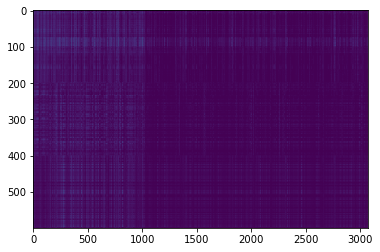

,AUC,pAUC
Source_0,0.393000,0.512632
Source_1,0.493900,0.492105
Source_2,0.536100,0.497895
Target_0,0.819000,0.694737
Target_1,0.473700,0.489474
Target_2,0.589400,0.530526
mean,0.550850,0.536228
h_mean,0.523412,0.528235


2021-04-23 22:48:41,141 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:0.245400, val_AUC_hmean:0.523412, val_pAUC_hmean:0.528235, best_flag:True
2021-04-23 22:48:41,142 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 22:48:41,581 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:48:41,764 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


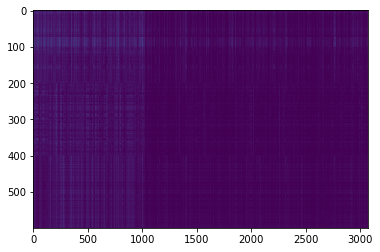

,AUC,pAUC
Source_0,0.409800,0.511579
Source_1,0.504500,0.505789
Source_2,0.517000,0.496316
Target_0,0.815000,0.694211
Target_1,0.483000,0.493158
Target_2,0.597900,0.516316
mean,0.554533,0.536228
h_mean,0.529730,0.528554


2021-04-23 22:48:42,848 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:0.242668, val_AUC_hmean:0.529730, val_pAUC_hmean:0.528554, best_flag:True
2021-04-23 22:48:42,849 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.33it/s]
2021-04-23 22:48:43,313 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:48:43,505 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:48:43,689 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:0.245364, val_AUC_hmean:0.533089, val_pAUC_hmean:0.526331, best_flag:False
2021-04-23 22:48:43,691 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-23 22:48:44,124 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:48:44,304 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 22:48:44,486 -

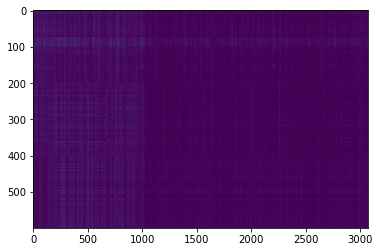

,AUC,pAUC
Source_0,0.530500,0.511579
Source_1,0.487400,0.487368
Source_2,0.527700,0.501579
Target_0,0.848200,0.716842
Target_1,0.485000,0.491053
Target_2,0.576800,0.534211
mean,0.575933,0.540439
h_mean,0.555234,0.530802


2021-04-23 22:48:47,010 - pytorch_modeler.py - INFO - epoch:56/300, train_losses:0.237465, val_AUC_hmean:0.555234, val_pAUC_hmean:0.530802, best_flag:True
2021-04-23 22:48:47,011 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 22:48:47,454 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:48:47,639 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:48:47,825 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:0.236353, val_AUC_hmean:0.553047, val_pAUC_hmean:0.527723, best_flag:False
2021-04-23 22:48:47,826 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-23 22:48:48,260 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:48:48,443 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


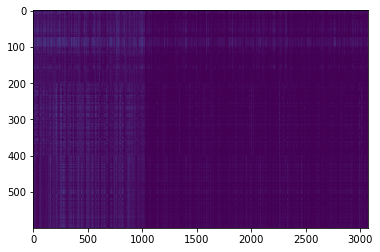

,AUC,pAUC
Source_0,0.582400,0.515263
Source_1,0.496300,0.488947
Source_2,0.514000,0.500526
Target_0,0.846100,0.718421
Target_1,0.492800,0.490000
Target_2,0.590700,0.531053
mean,0.587050,0.540702
h_mean,0.567028,0.530989


2021-04-23 22:48:49,524 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:0.235723, val_AUC_hmean:0.567028, val_pAUC_hmean:0.530989, best_flag:True
2021-04-23 22:48:49,525 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 22:48:49,965 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:48:50,152 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


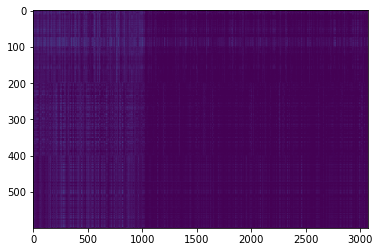

,AUC,pAUC
Source_0,0.567000,0.523684
Source_1,0.486700,0.489474
Source_2,0.522700,0.501579
Target_0,0.849100,0.720526
Target_1,0.486300,0.490526
Target_2,0.595400,0.534737
mean,0.584533,0.543421
h_mean,0.563641,0.533673


2021-04-23 22:48:51,248 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:0.232747, val_AUC_hmean:0.563641, val_pAUC_hmean:0.533673, best_flag:True
2021-04-23 22:48:51,249 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-23 22:48:51,695 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:48:51,875 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:48:52,064 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:0.232955, val_AUC_hmean:0.568684, val_pAUC_hmean:0.530582, best_flag:False
2021-04-23 22:48:52,065 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-23 22:48:52,525 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2021-04-23 22:48:52,726 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 22:48:52,909 -

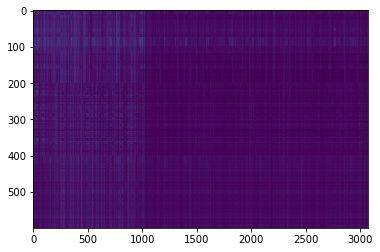

,AUC,pAUC
Source_0,0.677900,0.535263
Source_1,0.499300,0.503684
Source_2,0.527600,0.495789
Target_0,0.859600,0.714737
Target_1,0.462000,0.488421
Target_2,0.572100,0.520526
mean,0.599750,0.543070
h_mean,0.574212,0.533891


2021-04-23 22:49:03,732 - pytorch_modeler.py - INFO - epoch:73/300, train_losses:0.215682, val_AUC_hmean:0.574212, val_pAUC_hmean:0.533891, best_flag:True
2021-04-23 22:49:03,733 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:49:04,182 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 22:49:04,368 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:49:04,560 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:0.214997, val_AUC_hmean:0.567071, val_pAUC_hmean:0.531814, best_flag:False
2021-04-23 22:49:04,561 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 22:49:05,012 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:49:05,197 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:49:05,382 -

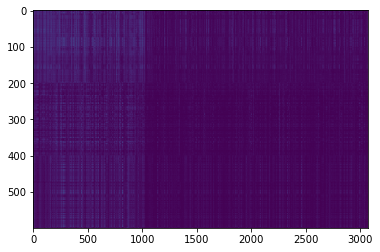

,AUC,pAUC
Source_0,0.605800,0.533158
Source_1,0.501000,0.505789
Source_2,0.539700,0.497895
Target_0,0.822500,0.713158
Target_1,0.477100,0.488421
Target_2,0.572500,0.529474
mean,0.586433,0.544649
h_mean,0.568283,0.535739


2021-04-23 22:49:12,888 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:0.204515, val_AUC_hmean:0.568283, val_pAUC_hmean:0.535739, best_flag:True
2021-04-23 22:49:12,889 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-23 22:49:13,337 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 22:49:13,526 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:49:13,712 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:0.203165, val_AUC_hmean:0.574572, val_pAUC_hmean:0.532737, best_flag:False
2021-04-23 22:49:13,713 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:49:14,162 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:49:14,350 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 22:49:14,542 -

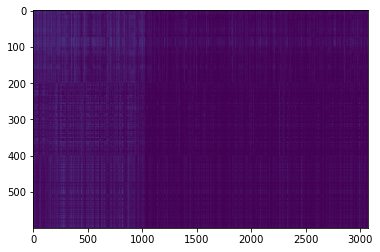

,AUC,pAUC
Source_0,0.657000,0.543158
Source_1,0.503900,0.504211
Source_2,0.540900,0.500000
Target_0,0.846000,0.705263
Target_1,0.470500,0.487895
Target_2,0.571500,0.532632
mean,0.598300,0.545526
h_mean,0.576226,0.537183


2021-04-23 22:49:16,256 - pytorch_modeler.py - INFO - epoch:86/300, train_losses:0.202035, val_AUC_hmean:0.576226, val_pAUC_hmean:0.537183, best_flag:True
2021-04-23 22:49:16,256 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-23 22:49:16,702 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:49:16,888 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:49:17,076 - pytorch_modeler.py - INFO - epoch:87/300, train_losses:0.201618, val_AUC_hmean:0.579263, val_pAUC_hmean:0.536590, best_flag:False
2021-04-23 22:49:17,077 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:49:17,526 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:49:17,710 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 22:49:17,909 -

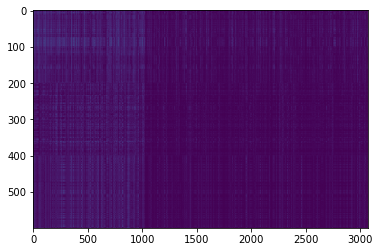

,AUC,pAUC
Source_0,0.748400,0.558421
Source_1,0.544200,0.507368
Source_2,0.525700,0.493684
Target_0,0.843700,0.703684
Target_1,0.502100,0.486842
Target_2,0.593500,0.527368
mean,0.626267,0.546228
h_mean,0.603757,0.537699


2021-04-23 22:49:23,742 - pytorch_modeler.py - INFO - epoch:94/300, train_losses:0.195676, val_AUC_hmean:0.603757, val_pAUC_hmean:0.537699, best_flag:True
2021-04-23 22:49:23,744 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.56it/s]
2021-04-23 22:49:24,307 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.64it/s]
2021-04-23 22:49:24,504 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:49:24,688 - pytorch_modeler.py - INFO - epoch:95/300, train_losses:0.194826, val_AUC_hmean:0.599977, val_pAUC_hmean:0.536929, best_flag:False
2021-04-23 22:49:24,689 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
2021-04-23 22:49:25,255 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.33it/s]
2021-04-23 22:49:25,465 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:49:25,650 -

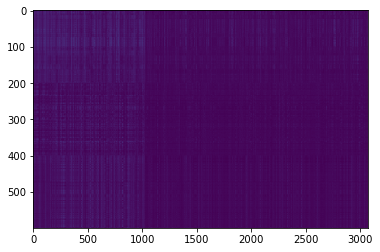

,AUC,pAUC
Source_0,0.667800,0.570000
Source_1,0.520100,0.505263
Source_2,0.575500,0.493684
Target_0,0.830900,0.705789
Target_1,0.485100,0.487895
Target_2,0.580900,0.524737
mean,0.610050,0.547895
h_mean,0.591471,0.539019


2021-04-23 22:49:27,507 - pytorch_modeler.py - INFO - epoch:97/300, train_losses:0.190994, val_AUC_hmean:0.591471, val_pAUC_hmean:0.539019, best_flag:True
2021-04-23 22:49:27,507 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-23 22:49:28,085 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:49:28,267 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:49:28,462 - pytorch_modeler.py - INFO - epoch:98/300, train_losses:0.204469, val_AUC_hmean:0.601812, val_pAUC_hmean:0.536445, best_flag:False
2021-04-23 22:49:28,464 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-23 22:49:29,036 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.67it/s]
2021-04-23 22:49:29,234 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:49:29,422 -

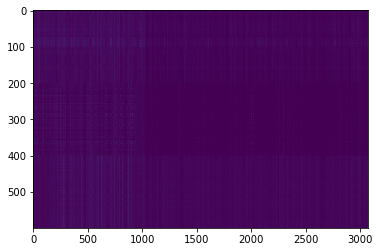

,AUC,pAUC
Source_0,0.722500,0.558947
Source_1,0.498600,0.487895
Source_2,0.510100,0.500526
Target_0,0.834400,0.722632
Target_1,0.518900,0.492105
Target_2,0.618800,0.533158
mean,0.617217,0.549211
h_mean,0.594545,0.539174


2021-04-23 22:49:34,133 - pytorch_modeler.py - INFO - epoch:103/300, train_losses:0.205383, val_AUC_hmean:0.594545, val_pAUC_hmean:0.539174, best_flag:True
2021-04-23 22:49:34,134 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:49:34,708 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-23 22:49:34,886 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 22:49:35,068 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:0.203411, val_AUC_hmean:0.598110, val_pAUC_hmean:0.533049, best_flag:False
2021-04-23 22:49:35,070 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 22:49:35,648 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:49:35,832 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:49:36,015

100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:49:50,134 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


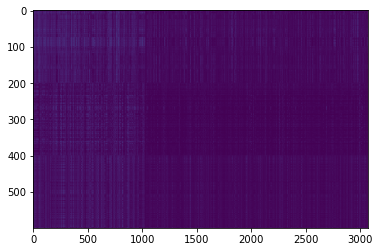

,AUC,pAUC
Source_0,0.768800,0.604737
Source_1,0.517700,0.503158
Source_2,0.548000,0.486842
Target_0,0.843400,0.697368
Target_1,0.503300,0.486842
Target_2,0.597900,0.522105
mean,0.629850,0.550175
h_mean,0.605923,0.540616


2021-04-23 22:49:51,264 - pytorch_modeler.py - INFO - epoch:120/300, train_losses:0.177816, val_AUC_hmean:0.605923, val_pAUC_hmean:0.540616, best_flag:True
2021-04-23 22:49:51,265 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.31it/s]
2021-04-23 22:49:51,871 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:49:52,052 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:49:52,239 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:0.176619, val_AUC_hmean:0.598099, val_pAUC_hmean:0.536134, best_flag:False
2021-04-23 22:49:52,240 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 22:49:52,822 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:49:53,004 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:49:53,190

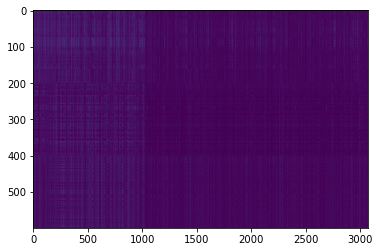

,AUC,pAUC
Source_0,0.754000,0.617368
Source_1,0.521900,0.502632
Source_2,0.552300,0.491053
Target_0,0.832100,0.696842
Target_1,0.504100,0.487368
Target_2,0.595400,0.526316
mean,0.626633,0.553596
h_mean,0.604961,0.543841


2021-04-23 22:49:55,989 - pytorch_modeler.py - INFO - epoch:124/300, train_losses:0.172431, val_AUC_hmean:0.604961, val_pAUC_hmean:0.543841, best_flag:True
2021-04-23 22:49:55,990 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:49:56,564 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 22:49:56,748 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


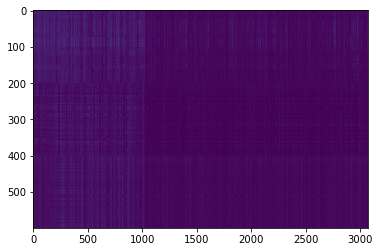

,AUC,pAUC
Source_0,0.716100,0.618947
Source_1,0.507900,0.503684
Source_2,0.554700,0.493158
Target_0,0.822800,0.693158
Target_1,0.507000,0.487895
Target_2,0.599300,0.527368
mean,0.617967,0.554035
h_mean,0.598535,0.544600


2021-04-23 22:49:57,863 - pytorch_modeler.py - INFO - epoch:125/300, train_losses:0.172534, val_AUC_hmean:0.598535, val_pAUC_hmean:0.544600, best_flag:True
2021-04-23 22:49:57,864 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
2021-04-23 22:49:58,448 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-23 22:49:58,636 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


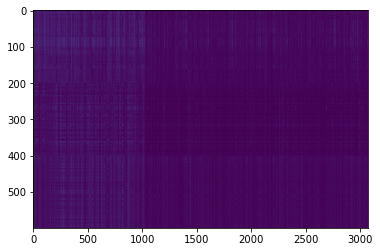

,AUC,pAUC
Source_0,0.747200,0.622105
Source_1,0.509200,0.501053
Source_2,0.551400,0.492105
Target_0,0.835900,0.700000
Target_1,0.492900,0.486842
Target_2,0.587000,0.530000
mean,0.620600,0.555351
h_mean,0.597344,0.545219


2021-04-23 22:49:59,751 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:0.170863, val_AUC_hmean:0.597344, val_pAUC_hmean:0.545219, best_flag:True
2021-04-23 22:49:59,752 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
2021-04-23 22:50:00,356 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.26it/s]
2021-04-23 22:50:00,684 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.28it/s]
2021-04-23 22:50:01,015 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:0.170027, val_AUC_hmean:0.605475, val_pAUC_hmean:0.545177, best_flag:False
2021-04-23 22:50:01,016 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-23 22:50:01,608 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.31it/s]
2021-04-23 22:50:01,930 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.32it/s]
2021-04-23 22:50:02,255

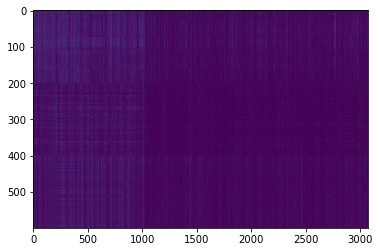

,AUC,pAUC
Source_0,0.751800,0.625789
Source_1,0.503600,0.508421
Source_2,0.557200,0.491579
Target_0,0.853300,0.697368
Target_1,0.505000,0.487368
Target_2,0.606800,0.527895
mean,0.629617,0.556404
h_mean,0.605410,0.546486


2021-04-23 22:50:04,532 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:0.171721, val_AUC_hmean:0.605410, val_pAUC_hmean:0.546486, best_flag:True
2021-04-23 22:50:04,533 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.35it/s]
2021-04-23 22:50:04,995 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:50:05,178 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-23 22:50:05,378 - pytorch_modeler.py - INFO - epoch:130/300, train_losses:0.170720, val_AUC_hmean:0.610834, val_pAUC_hmean:0.543714, best_flag:False
2021-04-23 22:50:05,379 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:50:05,828 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:50:06,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:50:06,198

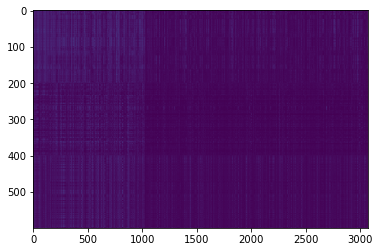

,AUC,pAUC
Source_0,0.777900,0.654737
Source_1,0.512000,0.508421
Source_2,0.621500,0.488947
Target_0,0.811000,0.694737
Target_1,0.483400,0.486316
Target_2,0.610600,0.528421
mean,0.636067,0.560263
h_mean,0.613051,0.549073


2021-04-23 22:50:11,217 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:0.165950, val_AUC_hmean:0.613051, val_pAUC_hmean:0.549073, best_flag:True
2021-04-23 22:50:11,218 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.26it/s]
2021-04-23 22:50:11,689 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.67it/s]
2021-04-23 22:50:11,887 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


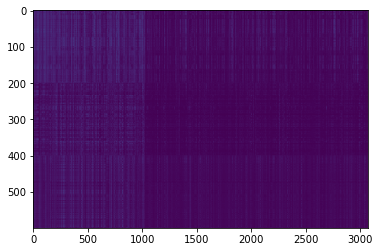

,AUC,pAUC
Source_0,0.742600,0.638947
Source_1,0.521000,0.510000
Source_2,0.594200,0.497895
Target_0,0.809700,0.700526
Target_1,0.507700,0.487895
Target_2,0.594800,0.527895
mean,0.628333,0.560526
h_mean,0.610074,0.550168


2021-04-23 22:50:13,004 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:0.163300, val_AUC_hmean:0.610074, val_pAUC_hmean:0.550168, best_flag:True
2021-04-23 22:50:13,005 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-23 22:50:13,450 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 22:50:13,641 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


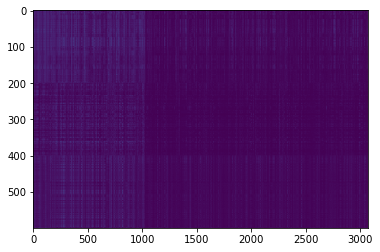

,AUC,pAUC
Source_0,0.791100,0.685789
Source_1,0.524200,0.512105
Source_2,0.596400,0.502632
Target_0,0.827600,0.705263
Target_1,0.495000,0.487368
Target_2,0.589700,0.527895
mean,0.637333,0.570175
h_mean,0.613952,0.557388


2021-04-23 22:50:14,782 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:0.162808, val_AUC_hmean:0.613952, val_pAUC_hmean:0.557388, best_flag:True
2021-04-23 22:50:14,783 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.24it/s]
2021-04-23 22:50:15,257 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:50:15,442 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:50:15,634 - pytorch_modeler.py - INFO - epoch:139/300, train_losses:0.163299, val_AUC_hmean:0.619412, val_pAUC_hmean:0.547442, best_flag:False
2021-04-23 22:50:15,635 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-23 22:50:16,080 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:50:16,266 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 22:50:16,465

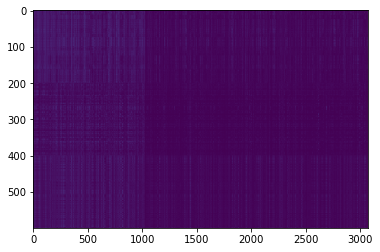

,AUC,pAUC
Source_0,0.889900,0.744737
Source_1,0.519300,0.506316
Source_2,0.608200,0.502632
Target_0,0.834000,0.708947
Target_1,0.478600,0.487895
Target_2,0.611200,0.525789
mean,0.656867,0.579386
h_mean,0.623819,0.562356


2021-04-23 22:50:29,004 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:0.153806, val_AUC_hmean:0.623819, val_pAUC_hmean:0.562356, best_flag:True
2021-04-23 22:50:29,005 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 22:50:29,461 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  4.76it/s]
2021-04-23 22:50:29,694 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2021-04-23 22:50:29,899 - pytorch_modeler.py - INFO - epoch:155/300, train_losses:0.154222, val_AUC_hmean:0.616185, val_pAUC_hmean:0.558974, best_flag:False
2021-04-23 22:50:29,900 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:50:30,347 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:50:30,530 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2021-04-23 22:50:30,732

100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:50:43,031 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 22:50:43,226 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:0.142208, val_AUC_hmean:0.619263, val_pAUC_hmean:0.556555, best_flag:False
2021-04-23 22:50:43,227 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:50:43,675 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:50:43,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:50:44,049 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:0.141810, val_AUC_hmean:0.616610, val_pAUC_hmean:0.551772, best_flag:False
2021-04-23 22:50:44,050 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 22:50:44,488 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

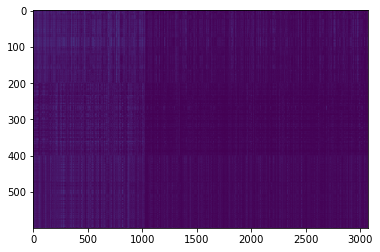

,AUC,pAUC
Source_0,0.908500,0.793158
Source_1,0.540100,0.515263
Source_2,0.590800,0.500000
Target_0,0.836100,0.701579
Target_1,0.495500,0.488947
Target_2,0.610900,0.525789
mean,0.663650,0.587456
h_mean,0.631847,0.567429


2021-04-23 22:50:49,956 - pytorch_modeler.py - INFO - epoch:178/300, train_losses:0.139219, val_AUC_hmean:0.631847, val_pAUC_hmean:0.567429, best_flag:True
2021-04-23 22:50:49,957 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:50:50,405 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 22:50:50,596 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:50:50,794 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:0.138295, val_AUC_hmean:0.620562, val_pAUC_hmean:0.557129, best_flag:False
2021-04-23 22:50:50,795 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-23 22:50:51,238 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:50:51,422 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:50:51,607

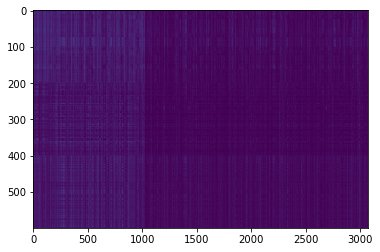

,AUC,pAUC
Source_0,0.913200,0.793684
Source_1,0.564200,0.509474
Source_2,0.588100,0.496842
Target_0,0.809000,0.707368
Target_1,0.475700,0.493684
Target_2,0.591200,0.530000
mean,0.656900,0.588509
h_mean,0.625157,0.568099


2021-04-23 22:50:57,453 - pytorch_modeler.py - INFO - epoch:186/300, train_losses:0.136326, val_AUC_hmean:0.625157, val_pAUC_hmean:0.568099, best_flag:True
2021-04-23 22:50:57,454 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:50:57,902 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:50:58,088 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:50:58,282 - pytorch_modeler.py - INFO - epoch:187/300, train_losses:0.135467, val_AUC_hmean:0.623660, val_pAUC_hmean:0.552221, best_flag:False
2021-04-23 22:50:58,283 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.42it/s]
2021-04-23 22:50:58,738 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:50:58,923 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.60it/s]
2021-04-23 22:50:59,126

100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:51:11,342 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-23 22:51:11,538 - pytorch_modeler.py - INFO - epoch:203/300, train_losses:0.127055, val_AUC_hmean:0.625689, val_pAUC_hmean:0.554267, best_flag:False
2021-04-23 22:51:11,539 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-23 22:51:11,984 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:51:12,165 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:51:12,351 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:0.127297, val_AUC_hmean:0.629873, val_pAUC_hmean:0.553713, best_flag:False
2021-04-23 22:51:12,352 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 22:51:12,803 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 22:51:25,211 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:51:25,398 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:51:25,586 - pytorch_modeler.py - INFO - epoch:220/300, train_losses:0.119821, val_AUC_hmean:0.633792, val_pAUC_hmean:0.553637, best_flag:False
2021-04-23 22:51:25,587 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.43it/s]
2021-04-23 22:51:26,041 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:51:26,225 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 22:51:26,419 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:0.120554, val_AUC_hmean:0.632995, val_pAUC_hmean:0.556856, best_flag:False
2021-04-23 22:51:26,420 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-23 22:51:38,837 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 22:51:39,280 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-23 22:51:39,470 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 22:51:39,662 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:0.113022, val_AUC_hmean:0.623143, val_pAUC_hmean:0.547765, best_flag:False
2021-04-23 22:51:39,663 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.43it/s]
2021-04-23 22:51:40,117 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:51:40,312 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 22:51:40,504 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:0.111962, val_AUC_hmean:0.631987, val_pAUC_hmean:0.548669, best_flag:False
2021-04-23 22:51:40,50

2021-04-23 22:51:53,011 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:51:53,464 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:51:53,648 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:51:53,837 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:0.107813, val_AUC_hmean:0.628519, val_pAUC_hmean:0.555213, best_flag:False
2021-04-23 22:51:53,838 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 22:51:54,277 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 22:51:54,463 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 22:51:54,659 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:0.107427, val_AUC_hmean:0.626009, val_pAUC_hmean:0.546890, best_flag:False
2021-04-23 22:51:54,66

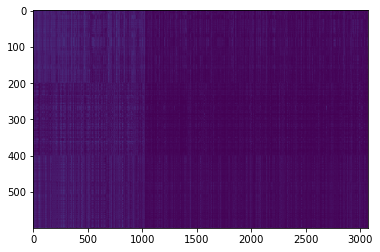

,AUC,pAUC
Source_0,0.937900,0.831579
Source_1,0.588200,0.511579
Source_2,0.651200,0.497368
Target_0,0.850200,0.723684
Target_1,0.483100,0.486842
Target_2,0.601000,0.525263
mean,0.685267,0.596053
h_mean,0.651325,0.571019


2021-04-23 22:51:59,673 - pytorch_modeler.py - INFO - epoch:260/300, train_losses:0.104720, val_AUC_hmean:0.651325, val_pAUC_hmean:0.571019, best_flag:True
2021-04-23 22:51:59,674 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 22:52:00,123 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:52:00,304 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:52:00,491 - pytorch_modeler.py - INFO - epoch:261/300, train_losses:0.103695, val_AUC_hmean:0.621921, val_pAUC_hmean:0.552422, best_flag:False
2021-04-23 22:52:00,492 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:52:00,933 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.48it/s]
2021-04-23 22:52:01,140 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.53it/s]
2021-04-23 22:52:01,347

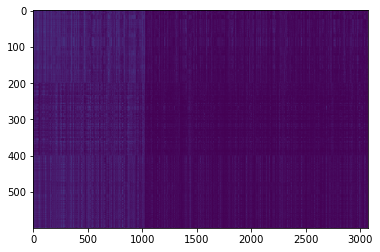

,AUC,pAUC
Source_0,0.968000,0.875263
Source_1,0.586200,0.516842
Source_2,0.615100,0.497895
Target_0,0.809500,0.713158
Target_1,0.490600,0.485789
Target_2,0.600800,0.532105
mean,0.678367,0.603509
h_mean,0.644966,0.575493


2021-04-23 22:52:03,088 - pytorch_modeler.py - INFO - epoch:263/300, train_losses:0.104306, val_AUC_hmean:0.644966, val_pAUC_hmean:0.575493, best_flag:True
2021-04-23 22:52:03,089 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
2021-04-23 22:52:03,558 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.62it/s]
2021-04-23 22:52:03,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:52:03,946 - pytorch_modeler.py - INFO - epoch:264/300, train_losses:0.102796, val_AUC_hmean:0.646619, val_pAUC_hmean:0.558453, best_flag:False
2021-04-23 22:52:03,947 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 22:52:04,404 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:52:04,583 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:52:04,771

100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:52:16,965 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:52:17,151 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:0.097867, val_AUC_hmean:0.631063, val_pAUC_hmean:0.545042, best_flag:False
2021-04-23 22:52:17,153 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.33it/s]
2021-04-23 22:52:17,617 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:52:17,797 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:52:17,986 - pytorch_modeler.py - INFO - epoch:281/300, train_losses:0.096142, val_AUC_hmean:0.635485, val_pAUC_hmean:0.554451, best_flag:False
2021-04-23 22:52:17,987 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:52:18,435 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:52:30,869 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:52:31,056 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:52:31,244 - pytorch_modeler.py - INFO - epoch:297/300, train_losses:0.092547, val_AUC_hmean:0.642461, val_pAUC_hmean:0.551071, best_flag:False
2021-04-23 22:52:31,245 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-23 22:52:31,689 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:52:31,873 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:52:32,059 - pytorch_modeler.py - INFO - epoch:298/300, train_losses:0.093433, val_AUC_hmean:0.638235, val_pAUC_hmean:0.563956, best_flag:False
2021-04-23 22:52:32,060 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

,AUC,pAUC
Source_0,0.968000,0.875263
Source_1,0.586200,0.516842
Source_2,0.615100,0.497895
Target_0,0.809500,0.713158
Target_1,0.490600,0.485789
Target_2,0.600800,0.532105
mean,0.678367,0.603509
h_mean,0.644966,0.575493


2021-04-23 22:52:33,708 - 00_train.py - INFO - TARGET MACHINE_TYPE: pump
2021-04-23 22:52:33,708 - 00_train.py - INFO - MAKE DATA_LOADER


elapsed time: 291.440676689 [sec]


2021-04-23 22:52:34,224 - 00_train.py - INFO - TRAINING
2021-04-23 22:52:34,410 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:52:34,858 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:52:35,043 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


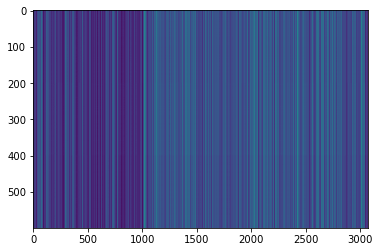

,AUC,pAUC
Source_0,0.410600,0.497895
Source_1,0.484200,0.507895
Source_2,0.475300,0.478421
Target_0,0.434900,0.497368
Target_1,0.560200,0.552105
Target_2,0.514200,0.494737
mean,0.479900,0.504737
h_mean,0.474913,0.503749


2021-04-23 22:52:36,103 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:51.535759, val_AUC_hmean:0.474913, val_pAUC_hmean:0.503749, best_flag:True
2021-04-23 22:52:36,105 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:52:36,553 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:52:36,735 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 22:52:36,928 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:15.368482, val_AUC_hmean:0.484576, val_pAUC_hmean:0.501289, best_flag:False
2021-04-23 22:52:36,930 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:52:37,368 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:52:37,551 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:52:37,737 -

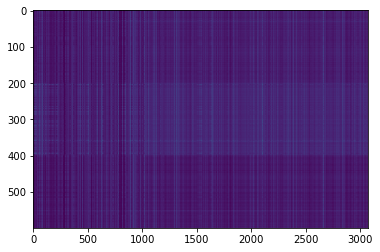

,AUC,pAUC
Source_0,0.573200,0.525789
Source_1,0.505200,0.491053
Source_2,0.509600,0.513158
Target_0,0.600000,0.522632
Target_1,0.465700,0.499474
Target_2,0.463800,0.485263
mean,0.519583,0.506228
h_mean,0.514739,0.505761


2021-04-23 22:52:48,606 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:0.534168, val_AUC_hmean:0.514739, val_pAUC_hmean:0.505761, best_flag:True
2021-04-23 22:52:48,606 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 22:52:49,046 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:52:49,234 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


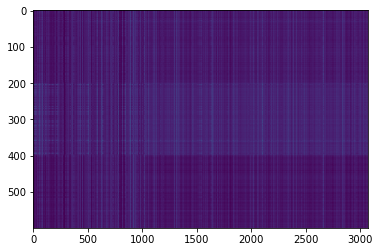

,AUC,pAUC
Source_0,0.58390,0.549474
Source_1,0.50430,0.493158
Source_2,0.50930,0.515789
Target_0,0.59930,0.523684
Target_1,0.46910,0.497895
Target_2,0.46370,0.488421
mean,0.52160,0.511404
h_mean,0.51653,0.510557


2021-04-23 22:52:50,321 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:0.494415, val_AUC_hmean:0.516530, val_pAUC_hmean:0.510557, best_flag:True
2021-04-23 22:52:50,322 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
2021-04-23 22:52:50,791 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:52:50,975 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


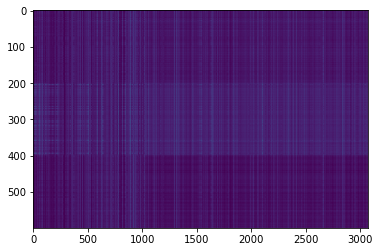

,AUC,pAUC
Source_0,0.591100,0.573684
Source_1,0.501600,0.495263
Source_2,0.501900,0.516316
Target_0,0.591600,0.518947
Target_1,0.472100,0.495789
Target_2,0.458700,0.488947
mean,0.519500,0.514825
h_mean,0.514297,0.513337


2021-04-23 22:52:52,098 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:0.472308, val_AUC_hmean:0.514297, val_pAUC_hmean:0.513337, best_flag:True
2021-04-23 22:52:52,099 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-23 22:52:52,560 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 22:52:52,748 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


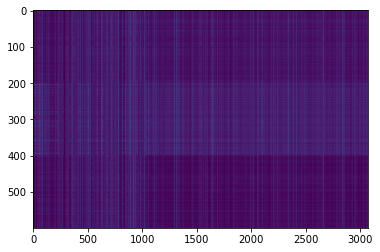

,AUC,pAUC
Source_0,0.595200,0.581579
Source_1,0.498800,0.492632
Source_2,0.505800,0.516842
Target_0,0.591800,0.522632
Target_1,0.462500,0.496842
Target_2,0.458700,0.490000
mean,0.518800,0.516754
h_mean,0.513084,0.514972


2021-04-23 22:52:53,882 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.446261, val_AUC_hmean:0.513084, val_pAUC_hmean:0.514972, best_flag:True
2021-04-23 22:52:53,884 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:52:54,337 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:52:54,524 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


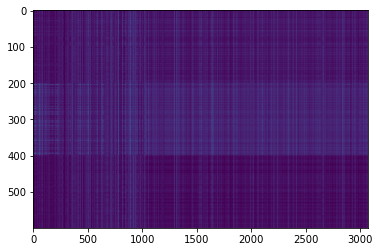

,AUC,pAUC
Source_0,0.601300,0.614737
Source_1,0.499400,0.497368
Source_2,0.501300,0.515789
Target_0,0.582700,0.517368
Target_1,0.468100,0.491053
Target_2,0.454000,0.489474
mean,0.517800,0.520965
h_mean,0.512148,0.517760


2021-04-23 22:52:55,653 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:0.447718, val_AUC_hmean:0.512148, val_pAUC_hmean:0.517760, best_flag:True
2021-04-23 22:52:55,654 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-23 22:52:56,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:52:56,299 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


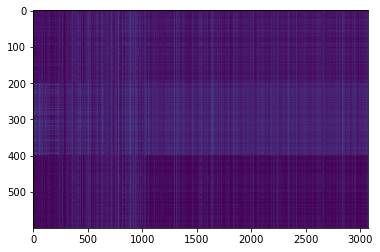

,AUC,pAUC
Source_0,0.600900,0.619474
Source_1,0.495700,0.498947
Source_2,0.499500,0.515263
Target_0,0.574400,0.516842
Target_1,0.475200,0.491579
Target_2,0.448400,0.488947
mean,0.515683,0.521842
h_mean,0.510248,0.518424


2021-04-23 22:52:57,457 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:0.464619, val_AUC_hmean:0.510248, val_pAUC_hmean:0.518424, best_flag:True
2021-04-23 22:52:57,458 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
2021-04-23 22:52:58,039 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.81it/s]
2021-04-23 22:52:58,236 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


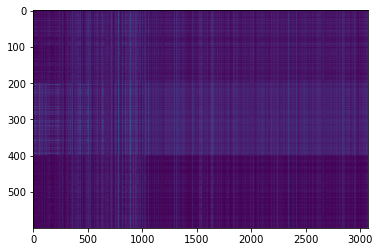

,AUC,pAUC
Source_0,0.599100,0.626842
Source_1,0.490000,0.500526
Source_2,0.499200,0.514211
Target_0,0.569800,0.517368
Target_1,0.482700,0.490526
Target_2,0.449100,0.488947
mean,0.514983,0.523070
h_mean,0.509920,0.519273


2021-04-23 22:52:59,432 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:0.393169, val_AUC_hmean:0.509920, val_pAUC_hmean:0.519273, best_flag:True
2021-04-23 22:52:59,433 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 22:53:00,014 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:53:00,204 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


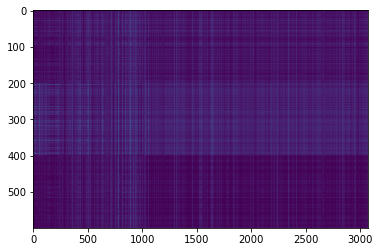

,AUC,pAUC
Source_0,0.598100,0.631579
Source_1,0.496200,0.502632
Source_2,0.498900,0.516842
Target_0,0.567200,0.516842
Target_1,0.482500,0.488947
Target_2,0.446500,0.487368
mean,0.514900,0.524035
h_mean,0.509904,0.519950


2021-04-23 22:53:01,390 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.379631, val_AUC_hmean:0.509904, val_pAUC_hmean:0.519950, best_flag:True
2021-04-23 22:53:01,391 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:53:01,964 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 22:53:02,158 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


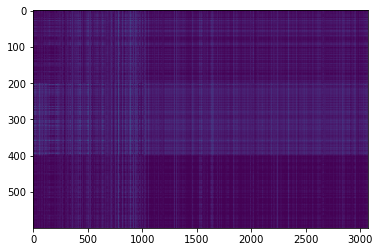

,AUC,pAUC
Source_0,0.591600,0.632105
Source_1,0.495500,0.505263
Source_2,0.498500,0.521053
Target_0,0.568200,0.519474
Target_1,0.485400,0.494737
Target_2,0.442000,0.489474
mean,0.513533,0.527018
h_mean,0.508601,0.523118


2021-04-23 22:53:03,301 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.384547, val_AUC_hmean:0.508601, val_pAUC_hmean:0.523118, best_flag:True
2021-04-23 22:53:03,302 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-23 22:53:03,900 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:53:04,086 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


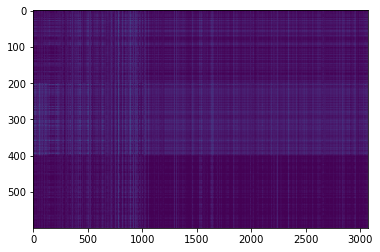

,AUC,pAUC
Source_0,0.592600,0.634737
Source_1,0.499200,0.506842
Source_2,0.497000,0.526316
Target_0,0.569800,0.522632
Target_1,0.486000,0.496316
Target_2,0.441900,0.491053
mean,0.514417,0.529649
h_mean,0.509410,0.525710


2021-04-23 22:53:05,238 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.361141, val_AUC_hmean:0.509410, val_pAUC_hmean:0.525710, best_flag:True
2021-04-23 22:53:05,239 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.42it/s]
2021-04-23 22:53:05,825 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:53:06,007 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:53:06,196 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:0.354856, val_AUC_hmean:0.512008, val_pAUC_hmean:0.524831, best_flag:False
2021-04-23 22:53:06,197 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 22:53:06,782 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.52it/s]
2021-04-23 22:53:06,984 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:53:07,185 -

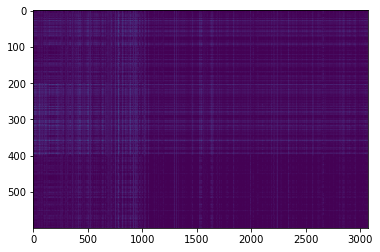

,AUC,pAUC
Source_0,0.594100,0.633158
Source_1,0.512700,0.521579
Source_2,0.510800,0.530526
Target_0,0.561400,0.502105
Target_1,0.483100,0.494211
Target_2,0.440900,0.499474
mean,0.517167,0.530175
h_mean,0.512352,0.526375


2021-04-23 22:53:10,054 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.330094, val_AUC_hmean:0.512352, val_pAUC_hmean:0.526375, best_flag:True
2021-04-23 22:53:10,055 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.42it/s]
2021-04-23 22:53:10,642 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.33it/s]
2021-04-23 22:53:10,963 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


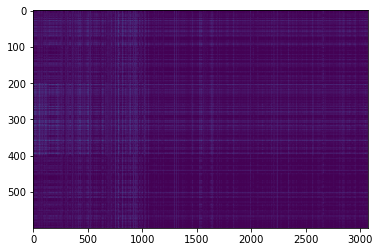

,AUC,pAUC
Source_0,0.602700,0.629474
Source_1,0.518300,0.523158
Source_2,0.515600,0.542105
Target_0,0.553800,0.496842
Target_1,0.476600,0.495263
Target_2,0.448200,0.496842
mean,0.519200,0.530614
h_mean,0.514442,0.526810


2021-04-23 22:53:12,324 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.328853, val_AUC_hmean:0.514442, val_pAUC_hmean:0.526810, best_flag:True
2021-04-23 22:53:12,325 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 22:53:12,774 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:53:12,963 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-23 22:53:13,142 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.331301, val_AUC_hmean:0.517655, val_pAUC_hmean:0.526759, best_flag:False
2021-04-23 22:53:13,144 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-23 22:53:13,594 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:53:13,775 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


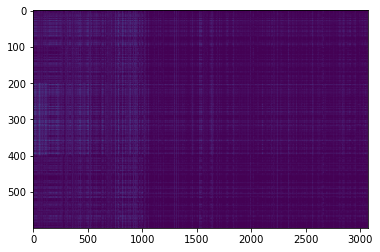

,AUC,pAUC
Source_0,0.609000,0.621053
Source_1,0.517000,0.529474
Source_2,0.533400,0.545263
Target_0,0.536800,0.500000
Target_1,0.474400,0.487368
Target_2,0.465700,0.501579
mean,0.522717,0.530789
h_mean,0.518620,0.527317


2021-04-23 22:53:14,854 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.316840, val_AUC_hmean:0.518620, val_pAUC_hmean:0.527317, best_flag:True
2021-04-23 22:53:14,855 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-23 22:53:15,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.50it/s]
2021-04-23 22:53:15,502 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]


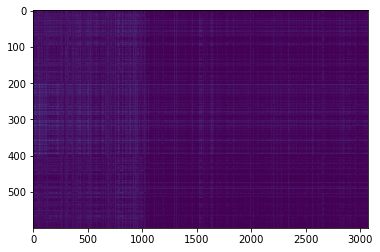

,AUC,pAUC
Source_0,0.609300,0.621053
Source_1,0.519900,0.531053
Source_2,0.537400,0.550000
Target_0,0.549300,0.505789
Target_1,0.472400,0.493684
Target_2,0.473800,0.505789
mean,0.527017,0.534561
h_mean,0.522947,0.531387


2021-04-23 22:53:16,597 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:0.319340, val_AUC_hmean:0.522947, val_pAUC_hmean:0.531387, best_flag:True
2021-04-23 22:53:16,598 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 22:53:17,048 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 22:53:17,232 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.81it/s]
2021-04-23 22:53:17,427 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:0.341881, val_AUC_hmean:0.525738, val_pAUC_hmean:0.526812, best_flag:False
2021-04-23 22:53:17,428 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:53:17,869 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-23 22:53:18,062 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:53:18,247 -

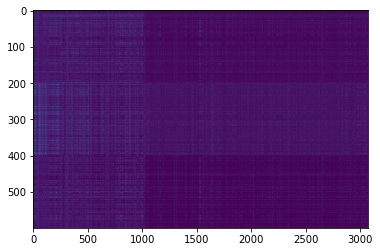

,AUC,pAUC
Source_0,0.622600,0.631579
Source_1,0.574000,0.522105
Source_2,0.587500,0.560526
Target_0,0.529500,0.515263
Target_1,0.497100,0.485789
Target_2,0.492600,0.497895
mean,0.550550,0.535526
h_mean,0.546411,0.531424


2021-04-23 22:53:23,282 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:0.294263, val_AUC_hmean:0.546411, val_pAUC_hmean:0.531424, best_flag:True
2021-04-23 22:53:23,283 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.30it/s]
2021-04-23 22:53:23,751 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:53:23,937 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


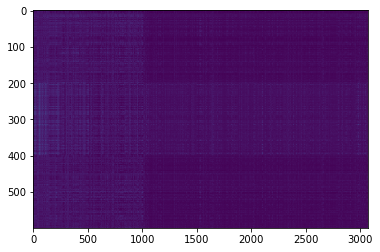

,AUC,pAUC
Source_0,0.632100,0.630000
Source_1,0.572900,0.522632
Source_2,0.588300,0.570000
Target_0,0.540400,0.516842
Target_1,0.490500,0.486316
Target_2,0.496900,0.499474
mean,0.553517,0.537544
h_mean,0.548996,0.533414


2021-04-23 22:53:25,009 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:0.289495, val_AUC_hmean:0.548996, val_pAUC_hmean:0.533414, best_flag:True
2021-04-23 22:53:25,010 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-23 22:53:25,469 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:53:25,654 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


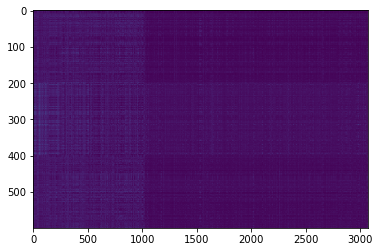

,AUC,pAUC
Source_0,0.618100,0.631053
Source_1,0.569700,0.521579
Source_2,0.598700,0.572632
Target_0,0.541800,0.518421
Target_1,0.485800,0.484737
Target_2,0.500200,0.501053
mean,0.552383,0.538246
h_mean,0.548105,0.534001


2021-04-23 22:53:26,732 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:0.297155, val_AUC_hmean:0.548105, val_pAUC_hmean:0.534001, best_flag:True
2021-04-23 22:53:26,733 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 22:53:27,185 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.48it/s]
2021-04-23 22:53:27,391 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:53:27,588 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:0.290950, val_AUC_hmean:0.541591, val_pAUC_hmean:0.531618, best_flag:False
2021-04-23 22:53:27,590 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.61it/s]
2021-04-23 22:53:28,026 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:53:28,213 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:53:28,400 -

100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 22:53:40,920 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:0.254217, val_AUC_hmean:0.543935, val_pAUC_hmean:0.527979, best_flag:False
2021-04-23 22:53:40,921 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:53:41,359 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 22:53:41,546 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:53:41,732 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:0.249493, val_AUC_hmean:0.550399, val_pAUC_hmean:0.527787, best_flag:False
2021-04-23 22:53:41,733 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:53:42,175 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 22:53:42,360 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:53:54,746 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:53:54,932 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:0.218389, val_AUC_hmean:0.545364, val_pAUC_hmean:0.529592, best_flag:False
2021-04-23 22:53:54,933 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:53:55,370 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:53:55,560 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:53:55,748 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:0.217895, val_AUC_hmean:0.545230, val_pAUC_hmean:0.528881, best_flag:False
2021-04-23 22:53:55,750 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-23 22:53:56,182 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00

100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 22:54:08,569 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2021-04-23 22:54:08,759 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 22:54:08,955 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:0.199188, val_AUC_hmean:0.557322, val_pAUC_hmean:0.529074, best_flag:False
2021-04-23 22:54:08,957 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 22:54:09,397 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:54:09,576 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.79it/s]
2021-04-23 22:54:09,778 - pytorch_modeler.py - INFO - epoch:93/300, train_losses:0.200312, val_AUC_hmean:0.552089, val_pAUC_hmean:0.530899, best_flag:False
2021-04-23 22:54:09,780 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00

2021-04-23 22:54:22,250 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 22:54:22,689 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:54:22,875 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:54:23,064 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:0.180871, val_AUC_hmean:0.561274, val_pAUC_hmean:0.531565, best_flag:False
2021-04-23 22:54:23,065 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:54:23,507 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.55it/s]
2021-04-23 22:54:23,706 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 22:54:23,897 - pytorch_modeler.py - INFO - epoch:110/300, train_losses:0.185544, val_AUC_hmean:0.554136, val_pAUC_hmean:0.530673, best_flag:False
2021-04-23 22:54:23,89

2021-04-23 22:54:36,304 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.43it/s]
2021-04-23 22:54:36,759 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:54:36,948 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:54:37,144 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:0.185304, val_AUC_hmean:0.560869, val_pAUC_hmean:0.529056, best_flag:False
2021-04-23 22:54:37,145 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 22:54:37,598 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:54:37,781 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-23 22:54:37,981 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:0.191259, val_AUC_hmean:0.557291, val_pAUC_hmean:0.531184, best_flag:False
2021-04-23 22:54:37,98

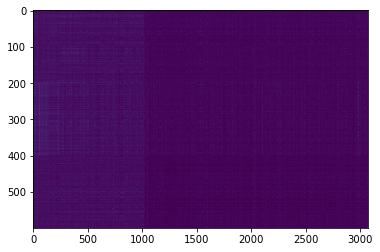

,AUC,pAUC
Source_0,0.651900,0.641579
Source_1,0.602500,0.520526
Source_2,0.634900,0.585789
Target_0,0.512000,0.513158
Target_1,0.465800,0.484737
Target_2,0.553200,0.499474
mean,0.570050,0.540877
h_mean,0.561986,0.535681


2021-04-23 22:54:46,362 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:0.159859, val_AUC_hmean:0.561986, val_pAUC_hmean:0.535681, best_flag:True
2021-04-23 22:54:46,363 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.25it/s]
2021-04-23 22:54:46,836 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 22:54:47,030 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.66it/s]
2021-04-23 22:54:47,232 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:0.161568, val_AUC_hmean:0.559223, val_pAUC_hmean:0.535249, best_flag:False
2021-04-23 22:54:47,233 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:54:47,682 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.60it/s]
2021-04-23 22:54:47,880 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:54:48,066

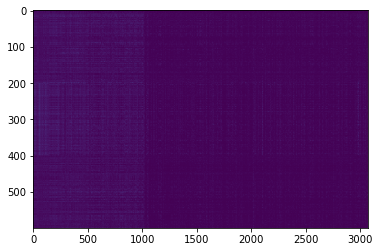

,AUC,pAUC
Source_0,0.642800,0.631053
Source_1,0.598200,0.523684
Source_2,0.637500,0.592632
Target_0,0.507500,0.510000
Target_1,0.458900,0.485263
Target_2,0.566500,0.502105
mean,0.568567,0.540789
h_mean,0.560182,0.535967


2021-04-23 22:54:57,227 - pytorch_modeler.py - INFO - epoch:148/300, train_losses:0.147713, val_AUC_hmean:0.560182, val_pAUC_hmean:0.535967, best_flag:True
2021-04-23 22:54:57,228 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.29it/s]
2021-04-23 22:54:57,696 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:54:57,883 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:54:58,071 - pytorch_modeler.py - INFO - epoch:149/300, train_losses:0.147218, val_AUC_hmean:0.557381, val_pAUC_hmean:0.533960, best_flag:False
2021-04-23 22:54:58,072 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:54:58,513 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:54:58,697 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:54:58,890

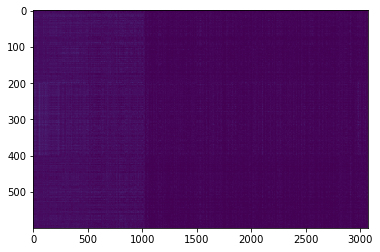

,AUC,pAUC
Source_0,0.643500,0.636842
Source_1,0.593400,0.521579
Source_2,0.640300,0.584737
Target_0,0.476400,0.507895
Target_1,0.454400,0.486842
Target_2,0.575000,0.507368
mean,0.563833,0.540877
h_mean,0.553511,0.536117


2021-04-23 22:55:08,813 - pytorch_modeler.py - INFO - epoch:161/300, train_losses:0.139184, val_AUC_hmean:0.553511, val_pAUC_hmean:0.536117, best_flag:True
2021-04-23 22:55:08,814 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 22:55:09,252 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:55:09,439 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:55:09,622 - pytorch_modeler.py - INFO - epoch:162/300, train_losses:0.136642, val_AUC_hmean:0.552661, val_pAUC_hmean:0.535218, best_flag:False
2021-04-23 22:55:09,623 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:55:10,065 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:55:10,251 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:55:10,438

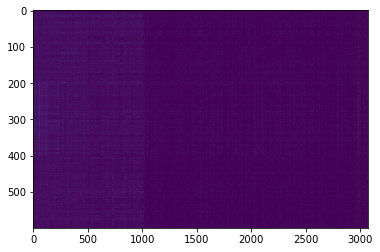

,AUC,pAUC
Source_0,0.655400,0.630526
Source_1,0.564600,0.528421
Source_2,0.639200,0.591579
Target_0,0.505300,0.512632
Target_1,0.449300,0.487895
Target_2,0.552000,0.495789
mean,0.560967,0.541140
h_mean,0.551587,0.536379


2021-04-23 22:55:13,794 - pytorch_modeler.py - INFO - epoch:166/300, train_losses:0.136924, val_AUC_hmean:0.551587, val_pAUC_hmean:0.536379, best_flag:True
2021-04-23 22:55:13,794 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 22:55:14,252 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:55:14,431 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 22:55:14,625 - pytorch_modeler.py - INFO - epoch:167/300, train_losses:0.133172, val_AUC_hmean:0.556648, val_pAUC_hmean:0.534726, best_flag:False
2021-04-23 22:55:14,626 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:55:15,067 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:55:15,250 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


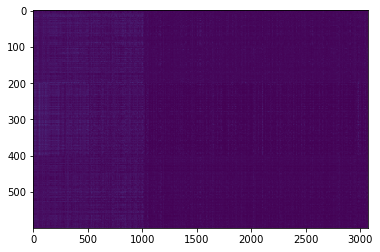

,AUC,pAUC
Source_0,0.672700,0.634737
Source_1,0.583800,0.527368
Source_2,0.663800,0.590000
Target_0,0.450800,0.511053
Target_1,0.456700,0.486842
Target_2,0.579300,0.501053
mean,0.567850,0.541842
h_mean,0.553502,0.537000


2021-04-23 22:55:16,350 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:0.131433, val_AUC_hmean:0.553502, val_pAUC_hmean:0.537000, best_flag:True
2021-04-23 22:55:16,351 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:55:16,793 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:55:16,977 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-23 22:55:17,170 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:0.133872, val_AUC_hmean:0.554099, val_pAUC_hmean:0.533457, best_flag:False
2021-04-23 22:55:17,171 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 22:55:17,615 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:55:17,798 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 22:55:17,988

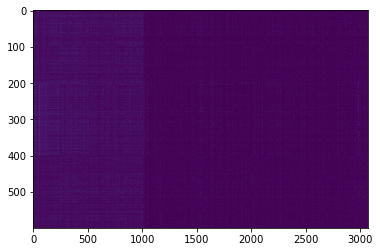

,AUC,pAUC
Source_0,0.650000,0.629474
Source_1,0.609000,0.532632
Source_2,0.636500,0.590526
Target_0,0.503400,0.511579
Target_1,0.442300,0.487368
Target_2,0.536300,0.501053
mean,0.562917,0.542105
h_mean,0.552302,0.537544


2021-04-23 22:55:20,561 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:0.128416, val_AUC_hmean:0.552302, val_pAUC_hmean:0.537544, best_flag:True
2021-04-23 22:55:20,562 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-23 22:55:21,022 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:55:21,206 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:55:21,391 - pytorch_modeler.py - INFO - epoch:173/300, train_losses:0.129005, val_AUC_hmean:0.556671, val_pAUC_hmean:0.534869, best_flag:False
2021-04-23 22:55:21,392 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 22:55:21,829 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:55:22,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:55:22,199

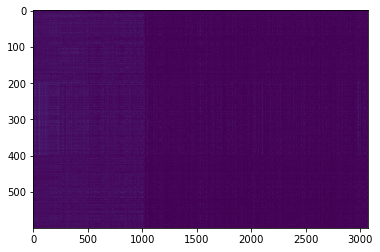

,AUC,pAUC
Source_0,0.636200,0.630000
Source_1,0.577500,0.523684
Source_2,0.641100,0.595263
Target_0,0.510700,0.507895
Target_1,0.443800,0.485789
Target_2,0.571300,0.512105
mean,0.563433,0.542456
h_mean,0.554272,0.537783


2021-04-23 22:55:28,070 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:0.130311, val_AUC_hmean:0.554272, val_pAUC_hmean:0.537783, best_flag:True
2021-04-23 22:55:28,071 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:55:28,520 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:55:28,703 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


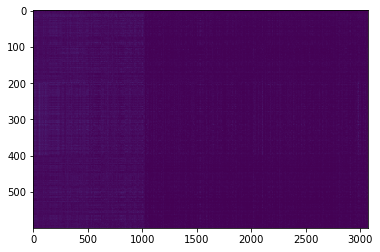

,AUC,pAUC
Source_0,0.622200,0.634211
Source_1,0.611900,0.531053
Source_2,0.643600,0.597368
Target_0,0.500200,0.505789
Target_1,0.469000,0.483158
Target_2,0.591800,0.513158
mean,0.573117,0.544123
h_mean,0.565165,0.539114


2021-04-23 22:55:29,844 - pytorch_modeler.py - INFO - epoch:181/300, train_losses:0.123796, val_AUC_hmean:0.565165, val_pAUC_hmean:0.539114, best_flag:True
2021-04-23 22:55:29,845 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-23 22:55:30,289 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:55:30,477 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:55:30,658 - pytorch_modeler.py - INFO - epoch:182/300, train_losses:0.122436, val_AUC_hmean:0.560216, val_pAUC_hmean:0.536438, best_flag:False
2021-04-23 22:55:30,659 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-23 22:55:31,092 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-23 22:55:31,270 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-23 22:55:31,452

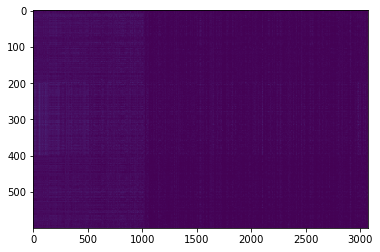

,AUC,pAUC
Source_0,0.681000,0.629474
Source_1,0.598300,0.534737
Source_2,0.634600,0.606842
Target_0,0.466600,0.505263
Target_1,0.456000,0.482632
Target_2,0.579000,0.508421
mean,0.569250,0.544561
h_mean,0.556644,0.539345


2021-04-23 22:55:38,973 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:0.120312, val_AUC_hmean:0.556644, val_pAUC_hmean:0.539345, best_flag:True
2021-04-23 22:55:38,974 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:55:39,422 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-23 22:55:39,610 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:55:39,799 - pytorch_modeler.py - INFO - epoch:192/300, train_losses:0.119470, val_AUC_hmean:0.568327, val_pAUC_hmean:0.534804, best_flag:False
2021-04-23 22:55:39,800 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:55:40,242 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2021-04-23 22:55:40,432 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:55:40,619

100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:55:52,734 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


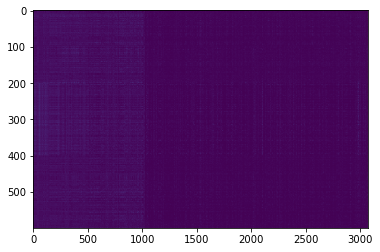

,AUC,pAUC
Source_0,0.634900,0.637895
Source_1,0.579800,0.536842
Source_2,0.648000,0.597895
Target_0,0.498700,0.510000
Target_1,0.439500,0.482105
Target_2,0.560500,0.507368
mean,0.560233,0.545351
h_mean,0.550073,0.540107


2021-04-23 22:55:53,871 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:0.106193, val_AUC_hmean:0.550073, val_pAUC_hmean:0.540107, best_flag:True
2021-04-23 22:55:53,872 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.35it/s]
2021-04-23 22:55:54,471 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 22:55:54,655 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:55:54,841 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:0.105884, val_AUC_hmean:0.556243, val_pAUC_hmean:0.539100, best_flag:False
2021-04-23 22:55:54,842 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
2021-04-23 22:55:55,407 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-23 22:55:55,595 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:55:55,781

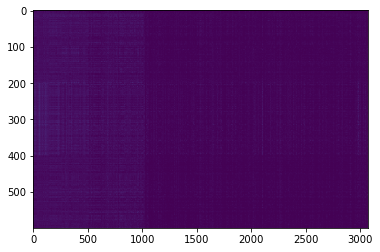

,AUC,pAUC
Source_0,0.634700,0.638947
Source_1,0.599600,0.545789
Source_2,0.638200,0.603684
Target_0,0.498000,0.507368
Target_1,0.432100,0.482632
Target_2,0.558900,0.512105
mean,0.560250,0.548421
h_mean,0.549361,0.543014


2021-04-23 22:55:59,578 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:0.108176, val_AUC_hmean:0.549361, val_pAUC_hmean:0.543014, best_flag:True
2021-04-23 22:55:59,578 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
2021-04-23 22:56:00,162 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:56:00,344 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:56:00,529 - pytorch_modeler.py - INFO - epoch:214/300, train_losses:0.102147, val_AUC_hmean:0.551496, val_pAUC_hmean:0.537030, best_flag:False
2021-04-23 22:56:00,531 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 22:56:01,114 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:56:01,296 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 22:56:01,482

100%|██████████| 1/1 [00:00<00:00,  5.77it/s]
2021-04-23 22:56:15,523 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:56:15,706 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:0.097227, val_AUC_hmean:0.553874, val_pAUC_hmean:0.537037, best_flag:False
2021-04-23 22:56:15,708 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 22:56:16,289 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.48it/s]
2021-04-23 22:56:16,493 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 22:56:16,688 - pytorch_modeler.py - INFO - epoch:231/300, train_losses:0.096392, val_AUC_hmean:0.551098, val_pAUC_hmean:0.537477, best_flag:False
2021-04-23 22:56:16,689 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-23 22:56:17,265 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

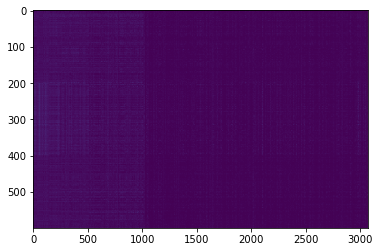

,AUC,pAUC
Source_0,0.645000,0.642105
Source_1,0.604800,0.542105
Source_2,0.660300,0.604211
Target_0,0.491500,0.507895
Target_1,0.425200,0.486842
Target_2,0.561900,0.516842
mean,0.564783,0.550000
h_mean,0.551248,0.544718


2021-04-23 22:56:22,465 - pytorch_modeler.py - INFO - epoch:236/300, train_losses:0.093983, val_AUC_hmean:0.551248, val_pAUC_hmean:0.544718, best_flag:True
2021-04-23 22:56:22,466 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.35it/s]
2021-04-23 22:56:23,065 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.23it/s]
2021-04-23 22:56:23,277 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-23 22:56:23,471 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:0.091380, val_AUC_hmean:0.553105, val_pAUC_hmean:0.540797, best_flag:False
2021-04-23 22:56:23,473 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 22:56:24,052 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:56:24,236 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:56:24,427

100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-23 22:56:38,595 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:56:38,779 - pytorch_modeler.py - INFO - epoch:253/300, train_losses:0.090806, val_AUC_hmean:0.548005, val_pAUC_hmean:0.537757, best_flag:False
2021-04-23 22:56:38,781 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.53it/s]
2021-04-23 22:56:39,350 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-23 22:56:39,537 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:56:39,721 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:0.088386, val_AUC_hmean:0.547069, val_pAUC_hmean:0.542687, best_flag:False
2021-04-23 22:56:39,722 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 22:56:40,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-23 22:56:54,632 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 22:56:54,813 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:56:55,002 - pytorch_modeler.py - INFO - epoch:270/300, train_losses:0.081253, val_AUC_hmean:0.557984, val_pAUC_hmean:0.540565, best_flag:False
2021-04-23 22:56:55,003 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-23 22:56:55,573 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2021-04-23 22:56:55,763 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:56:55,946 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:0.078755, val_AUC_hmean:0.561883, val_pAUC_hmean:0.540590, best_flag:False
2021-04-23 22:56:55,948 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-23 22:57:10,210 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.51it/s]
2021-04-23 22:57:10,783 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-23 22:57:10,964 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 22:57:11,147 - pytorch_modeler.py - INFO - epoch:287/300, train_losses:0.075745, val_AUC_hmean:0.547701, val_pAUC_hmean:0.543102, best_flag:False
2021-04-23 22:57:11,149 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 22:57:11,727 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:57:11,911 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-23 22:57:12,102 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:0.075273, val_AUC_hmean:0.556373, val_pAUC_hmean:0.543368, best_flag:False
2021-04-23 22:57:12,10

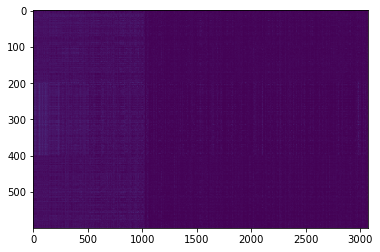

,AUC,pAUC
Source_0,0.630500,0.640526
Source_1,0.592900,0.555789
Source_2,0.673900,0.610000
Target_0,0.515500,0.512632
Target_1,0.400800,0.486316
Target_2,0.598700,0.505789
mean,0.568717,0.551842
h_mean,0.552398,0.546254


2021-04-23 22:57:15,943 - pytorch_modeler.py - INFO - epoch:291/300, train_losses:0.077155, val_AUC_hmean:0.552398, val_pAUC_hmean:0.546254, best_flag:True
2021-04-23 22:57:15,944 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 22:57:16,527 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-23 22:57:16,725 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.63it/s]
2021-04-23 22:57:16,925 - pytorch_modeler.py - INFO - epoch:292/300, train_losses:0.073843, val_AUC_hmean:0.544838, val_pAUC_hmean:0.543585, best_flag:False
2021-04-23 22:57:16,927 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.53it/s]
2021-04-23 22:57:17,494 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:57:17,678 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 22:57:17,869

,AUC,pAUC
Source_0,0.630500,0.640526
Source_1,0.592900,0.555789
Source_2,0.673900,0.610000
Target_0,0.515500,0.512632
Target_1,0.400800,0.486316
Target_2,0.598700,0.505789
mean,0.568717,0.551842
h_mean,0.552398,0.546254


2021-04-23 22:57:24,540 - 00_train.py - INFO - TARGET MACHINE_TYPE: fan
2021-04-23 22:57:24,541 - 00_train.py - INFO - MAKE DATA_LOADER


elapsed time: 290.831567526 [sec]


2021-04-23 22:57:25,053 - 00_train.py - INFO - TRAINING
2021-04-23 22:57:25,251 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:57:25,823 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-23 22:57:26,015 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


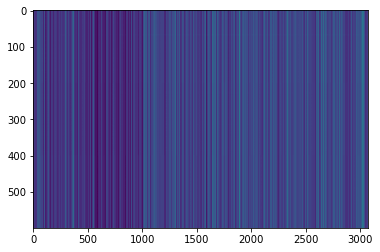

,AUC,pAUC
Source_0,0.479200,0.482105
Source_1,0.518000,0.544737
Source_2,0.456800,0.478947
Target_0,0.424700,0.483158
Target_1,0.458500,0.506316
Target_2,0.469300,0.493684
mean,0.467750,0.498158
h_mean,0.466095,0.497172


2021-04-23 22:57:27,108 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:54.702650, val_AUC_hmean:0.466095, val_pAUC_hmean:0.497172, best_flag:True
2021-04-23 22:57:27,109 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.40it/s]
2021-04-23 22:57:27,699 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:57:27,882 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 22:57:28,079 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:19.739728, val_AUC_hmean:0.463280, val_pAUC_hmean:0.491688, best_flag:False
2021-04-23 22:57:28,081 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.40it/s]
2021-04-23 22:57:28,671 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:57:28,864 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:57:29,059 -

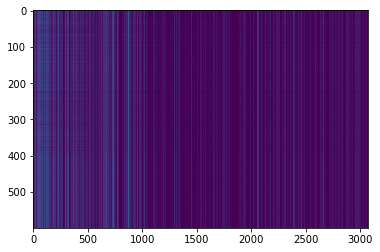

,AUC,pAUC
Source_0,0.442000,0.491579
Source_1,0.511400,0.578421
Source_2,0.437100,0.480526
Target_0,0.403200,0.494211
Target_1,0.435800,0.509474
Target_2,0.414500,0.487368
mean,0.440667,0.506930
h_mean,0.438180,0.504956


2021-04-23 22:57:30,940 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:7.018552, val_AUC_hmean:0.438180, val_pAUC_hmean:0.504956, best_flag:True
2021-04-23 22:57:30,941 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-23 22:57:31,518 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-23 22:57:31,707 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:57:31,892 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:4.635924, val_AUC_hmean:0.461954, val_pAUC_hmean:0.497698, best_flag:False
2021-04-23 22:57:31,893 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
2021-04-23 22:57:32,477 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 22:57:32,665 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


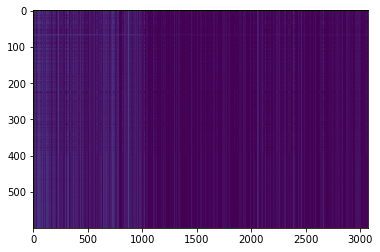

,AUC,pAUC
Source_0,0.465600,0.507895
Source_1,0.493000,0.487895
Source_2,0.460800,0.510000
Target_0,0.497300,0.507895
Target_1,0.491700,0.513158
Target_2,0.511400,0.515263
mean,0.486633,0.507018
h_mean,0.485974,0.506855


2021-04-23 22:57:33,812 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:3.247190, val_AUC_hmean:0.485974, val_pAUC_hmean:0.506855, best_flag:True
2021-04-23 22:57:33,813 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.33it/s]
2021-04-23 22:57:34,416 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.30it/s]
2021-04-23 22:57:34,740 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.35it/s]
2021-04-23 22:57:35,062 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:2.510222, val_AUC_hmean:0.489881, val_pAUC_hmean:0.502505, best_flag:False
2021-04-23 22:57:35,063 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 22:57:35,649 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.18it/s]
2021-04-23 22:57:35,983 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.13it/s]
2021-04-23 22:57:36,326 - p

100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 22:57:49,323 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.417500, val_AUC_hmean:0.532492, val_pAUC_hmean:0.500208, best_flag:False
2021-04-23 22:57:49,324 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 22:57:49,763 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2021-04-23 22:57:49,963 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-23 22:57:50,154 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.434857, val_AUC_hmean:0.538108, val_pAUC_hmean:0.502754, best_flag:False
2021-04-23 22:57:50,155 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-23 22:57:50,603 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 22:57:50,786 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

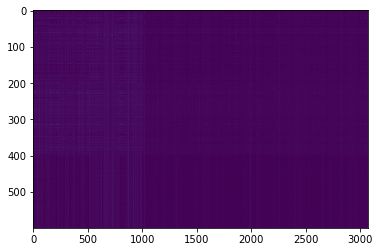

,AUC,pAUC
Source_0,0.581500,0.518421
Source_1,0.541600,0.500000
Source_2,0.461800,0.492632
Target_0,0.645000,0.523684
Target_1,0.533300,0.491053
Target_2,0.588500,0.532105
mean,0.558617,0.509649
h_mean,0.552677,0.509158


2021-04-23 22:57:54,363 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.340379, val_AUC_hmean:0.552677, val_pAUC_hmean:0.509158, best_flag:True
2021-04-23 22:57:54,364 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-23 22:57:54,815 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:57:54,998 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


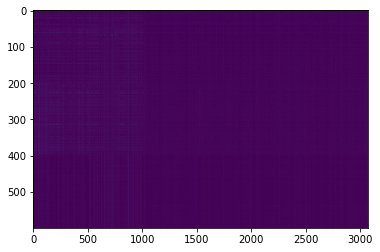

,AUC,pAUC
Source_0,0.592400,0.535789
Source_1,0.551600,0.502632
Source_2,0.467600,0.493684
Target_0,0.649300,0.533158
Target_1,0.533500,0.492632
Target_2,0.598100,0.532105
mean,0.565417,0.515000
h_mean,0.559387,0.514298


2021-04-23 22:57:56,070 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.330892, val_AUC_hmean:0.559387, val_pAUC_hmean:0.514298, best_flag:True
2021-04-23 22:57:56,071 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.27it/s]
2021-04-23 22:57:56,541 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 22:57:56,724 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


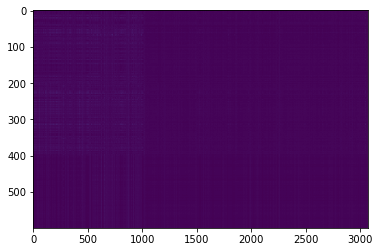

,AUC,pAUC
Source_0,0.607000,0.532632
Source_1,0.544900,0.500000
Source_2,0.461700,0.492632
Target_0,0.656000,0.541053
Target_1,0.525600,0.494737
Target_2,0.576500,0.530526
mean,0.561950,0.515263
h_mean,0.555035,0.514499


2021-04-23 22:57:57,810 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.321984, val_AUC_hmean:0.555035, val_pAUC_hmean:0.514499, best_flag:True
2021-04-23 22:57:57,811 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:57:58,261 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 22:57:58,446 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


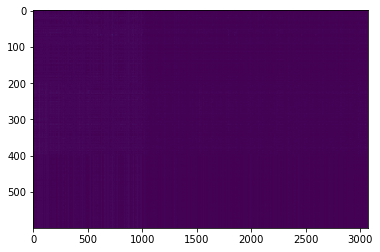

,AUC,pAUC
Source_0,0.581900,0.542105
Source_1,0.530800,0.504737
Source_2,0.491500,0.492105
Target_0,0.638200,0.541579
Target_1,0.552900,0.496316
Target_2,0.608100,0.532632
mean,0.567233,0.518246
h_mean,0.563007,0.517387


2021-04-23 22:57:59,510 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.328760, val_AUC_hmean:0.563007, val_pAUC_hmean:0.517387, best_flag:True
2021-04-23 22:57:59,511 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 22:57:59,966 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.77it/s]
2021-04-23 22:58:00,159 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.50it/s]
2021-04-23 22:58:00,366 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:0.311454, val_AUC_hmean:0.550315, val_pAUC_hmean:0.516443, best_flag:False
2021-04-23 22:58:00,367 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:58:00,808 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 22:58:01,001 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


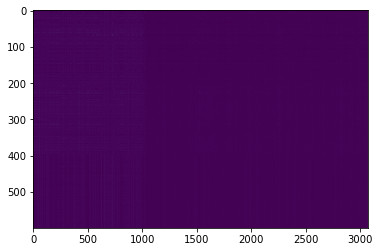

,AUC,pAUC
Source_0,0.630000,0.541053
Source_1,0.542000,0.505263
Source_2,0.500400,0.494211
Target_0,0.678700,0.554737
Target_1,0.525300,0.498947
Target_2,0.581100,0.528421
mean,0.576250,0.520439
h_mean,0.569872,0.519474


2021-04-23 22:58:02,099 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:0.303134, val_AUC_hmean:0.569872, val_pAUC_hmean:0.519474, best_flag:True
2021-04-23 22:58:02,100 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-23 22:58:02,551 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.60it/s]
2021-04-23 22:58:02,749 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 22:58:02,939 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:0.316770, val_AUC_hmean:0.546430, val_pAUC_hmean:0.515270, best_flag:False
2021-04-23 22:58:02,940 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 22:58:03,390 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 22:58:03,579 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 22:58:03,769 -

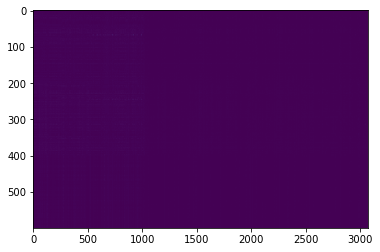

,AUC,pAUC
Source_0,0.627400,0.546842
Source_1,0.550900,0.509474
Source_2,0.491400,0.490526
Target_0,0.658600,0.552105
Target_1,0.527300,0.495789
Target_2,0.594100,0.529474
mean,0.574950,0.520702
h_mean,0.569145,0.519615


2021-04-23 22:58:07,139 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:0.282642, val_AUC_hmean:0.569145, val_pAUC_hmean:0.519615, best_flag:True
2021-04-23 22:58:07,140 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
2021-04-23 22:58:07,609 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:58:07,796 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2021-04-23 22:58:07,990 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:0.275587, val_AUC_hmean:0.549956, val_pAUC_hmean:0.517018, best_flag:False
2021-04-23 22:58:07,992 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:58:08,433 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:58:08,617 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


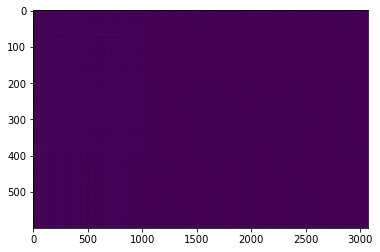

,AUC,pAUC
Source_0,0.645100,0.554737
Source_1,0.546300,0.513684
Source_2,0.500500,0.484737
Target_0,0.664100,0.554211
Target_1,0.518400,0.496316
Target_2,0.581700,0.525263
mean,0.576017,0.521491
h_mean,0.569662,0.520139


2021-04-23 22:58:09,693 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:0.280605, val_AUC_hmean:0.569662, val_pAUC_hmean:0.520139, best_flag:True
2021-04-23 22:58:09,694 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-23 22:58:10,138 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]
2021-04-23 22:58:10,329 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


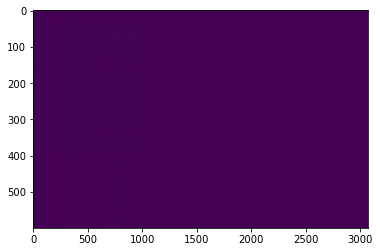

,AUC,pAUC
Source_0,0.651600,0.553684
Source_1,0.543900,0.510000
Source_2,0.497800,0.490000
Target_0,0.674900,0.553684
Target_1,0.520900,0.498421
Target_2,0.578400,0.525263
mean,0.577917,0.521842
h_mean,0.570751,0.520657


2021-04-23 22:58:11,404 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:0.281297, val_AUC_hmean:0.570751, val_pAUC_hmean:0.520657, best_flag:True
2021-04-23 22:58:11,405 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 22:58:11,847 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 22:58:12,033 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:58:12,222 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:0.267298, val_AUC_hmean:0.568180, val_pAUC_hmean:0.519027, best_flag:False
2021-04-23 22:58:12,223 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:58:12,672 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 22:58:12,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:58:13,050 -

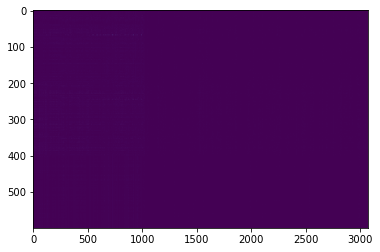

,AUC,pAUC
Source_0,0.657800,0.552105
Source_1,0.553300,0.514737
Source_2,0.499600,0.491053
Target_0,0.657700,0.549474
Target_1,0.525500,0.500000
Target_2,0.591400,0.526842
mean,0.580883,0.522368
h_mean,0.574522,0.521356


2021-04-23 22:58:15,540 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:0.260359, val_AUC_hmean:0.574522, val_pAUC_hmean:0.521356, best_flag:True
2021-04-23 22:58:15,541 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 22:58:15,981 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:58:16,166 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:58:16,366 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:0.254421, val_AUC_hmean:0.572458, val_pAUC_hmean:0.520370, best_flag:False
2021-04-23 22:58:16,368 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 22:58:16,817 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 22:58:17,006 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-23 22:58:17,188 -

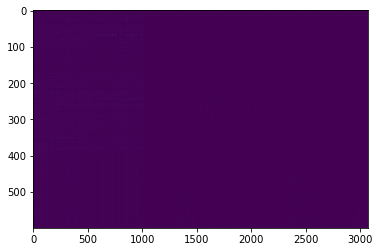

,AUC,pAUC
Source_0,0.671400,0.552632
Source_1,0.542600,0.508421
Source_2,0.525200,0.502105
Target_0,0.682000,0.543158
Target_1,0.530300,0.501053
Target_2,0.571200,0.526842
mean,0.587117,0.522368
h_mean,0.580319,0.521603


2021-04-23 22:58:23,019 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:0.249418, val_AUC_hmean:0.580319, val_pAUC_hmean:0.521603, best_flag:True
2021-04-23 22:58:23,020 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-23 22:58:23,470 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:58:23,653 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 22:58:23,843 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:0.245376, val_AUC_hmean:0.585140, val_pAUC_hmean:0.519760, best_flag:False
2021-04-23 22:58:23,844 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.42it/s]
2021-04-23 22:58:24,298 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:58:24,485 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 22:58:24,671 -

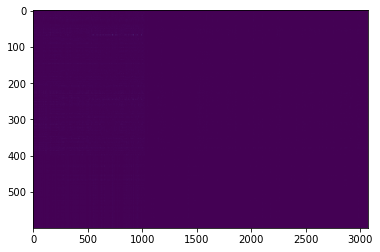

,AUC,pAUC
Source_0,0.663700,0.552105
Source_1,0.545000,0.508421
Source_2,0.502000,0.499474
Target_0,0.671000,0.546316
Target_1,0.522600,0.503684
Target_2,0.543100,0.526842
mean,0.574567,0.522807
h_mean,0.567177,0.522005


2021-04-23 22:58:27,229 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:0.237168, val_AUC_hmean:0.567177, val_pAUC_hmean:0.522005, best_flag:True
2021-04-23 22:58:27,229 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 22:58:27,683 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 22:58:27,875 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 22:58:28,063 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:0.233121, val_AUC_hmean:0.573538, val_pAUC_hmean:0.521248, best_flag:False
2021-04-23 22:58:28,065 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 22:58:28,503 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 22:58:28,694 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 22:58:28,878 -

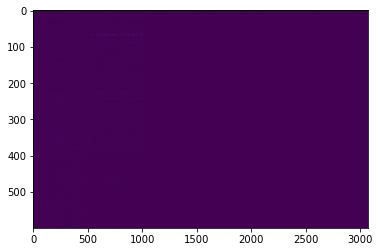

,AUC,pAUC
Source_0,0.664700,0.550526
Source_1,0.552000,0.507368
Source_2,0.536000,0.501579
Target_0,0.683700,0.548947
Target_1,0.521300,0.504737
Target_2,0.554800,0.527895
mean,0.585417,0.523509
h_mean,0.578867,0.522725


2021-04-23 22:58:31,436 - pytorch_modeler.py - INFO - epoch:61/300, train_losses:0.227716, val_AUC_hmean:0.578867, val_pAUC_hmean:0.522725, best_flag:True
2021-04-23 22:58:31,437 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-23 22:58:31,871 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 22:58:32,050 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.58it/s]
2021-04-23 22:58:32,253 - pytorch_modeler.py - INFO - epoch:62/300, train_losses:0.229667, val_AUC_hmean:0.570638, val_pAUC_hmean:0.521437, best_flag:False
2021-04-23 22:58:32,255 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:58:32,702 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 22:58:32,888 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 22:58:33,071 -

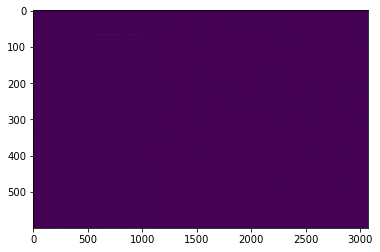

,AUC,pAUC
Source_0,0.669300,0.558421
Source_1,0.543300,0.504737
Source_2,0.514900,0.499474
Target_0,0.686500,0.550000
Target_1,0.518900,0.507368
Target_2,0.538100,0.528947
mean,0.578500,0.524825
h_mean,0.570395,0.523844


2021-04-23 22:58:35,673 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:0.218682, val_AUC_hmean:0.570395, val_pAUC_hmean:0.523844, best_flag:True
2021-04-23 22:58:35,674 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 22:58:36,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.60it/s]
2021-04-23 22:58:36,313 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.62it/s]
2021-04-23 22:58:36,514 - pytorch_modeler.py - INFO - epoch:66/300, train_losses:0.215947, val_AUC_hmean:0.577482, val_pAUC_hmean:0.521903, best_flag:False
2021-04-23 22:58:36,515 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 22:58:36,958 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 22:58:37,147 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:58:37,334 -

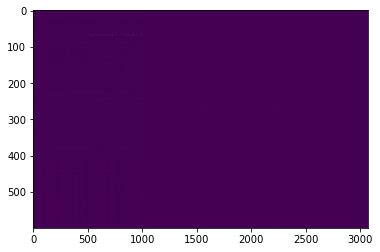

,AUC,pAUC
Source_0,0.679200,0.557368
Source_1,0.527300,0.502105
Source_2,0.547900,0.500526
Target_0,0.706900,0.548947
Target_1,0.522700,0.510000
Target_2,0.538900,0.530000
mean,0.587150,0.524825
h_mean,0.578184,0.523885


2021-04-23 22:58:40,741 - pytorch_modeler.py - INFO - epoch:70/300, train_losses:0.216793, val_AUC_hmean:0.578184, val_pAUC_hmean:0.523885, best_flag:True
2021-04-23 22:58:40,742 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 22:58:41,191 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 22:58:41,377 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.81it/s]
2021-04-23 22:58:41,573 - pytorch_modeler.py - INFO - epoch:71/300, train_losses:0.214012, val_AUC_hmean:0.574214, val_pAUC_hmean:0.523427, best_flag:False
2021-04-23 22:58:41,575 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 22:58:42,015 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 22:58:42,198 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


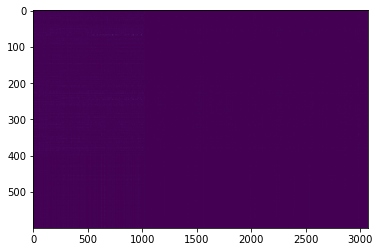

,AUC,pAUC
Source_0,0.665400,0.558421
Source_1,0.543300,0.512105
Source_2,0.536100,0.499474
Target_0,0.690000,0.547368
Target_1,0.523800,0.506842
Target_2,0.534100,0.531053
mean,0.582117,0.525877
h_mean,0.574741,0.525000


2021-04-23 22:58:43,264 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:0.209620, val_AUC_hmean:0.574741, val_pAUC_hmean:0.525000, best_flag:True
2021-04-23 22:58:43,265 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.42it/s]
2021-04-23 22:58:43,719 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 22:58:43,905 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:58:44,089 - pytorch_modeler.py - INFO - epoch:73/300, train_losses:0.222052, val_AUC_hmean:0.575479, val_pAUC_hmean:0.524238, best_flag:False
2021-04-23 22:58:44,090 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 22:58:44,537 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 22:58:44,719 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 22:58:44,909 -

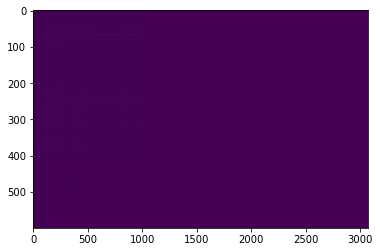

,AUC,pAUC
Source_0,0.676900,0.560526
Source_1,0.545200,0.506316
Source_2,0.526500,0.498947
Target_0,0.709200,0.555789
Target_1,0.532200,0.506842
Target_2,0.544300,0.529474
mean,0.589050,0.526316
h_mean,0.580433,0.525200


2021-04-23 22:58:49,126 - pytorch_modeler.py - INFO - epoch:78/300, train_losses:0.204503, val_AUC_hmean:0.580433, val_pAUC_hmean:0.525200, best_flag:True
2021-04-23 22:58:49,127 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.30it/s]
2021-04-23 22:58:49,736 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 22:58:49,923 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 22:58:50,109 - pytorch_modeler.py - INFO - epoch:79/300, train_losses:0.200624, val_AUC_hmean:0.571786, val_pAUC_hmean:0.524708, best_flag:False
2021-04-23 22:58:50,110 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.27it/s]
2021-04-23 22:58:50,724 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:58:50,905 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


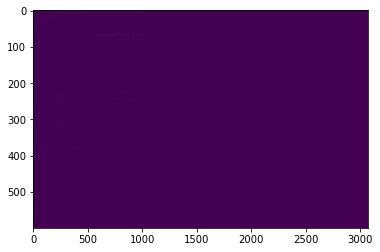

,AUC,pAUC
Source_0,0.677400,0.560000
Source_1,0.542900,0.504737
Source_2,0.536200,0.501053
Target_0,0.710100,0.555789
Target_1,0.519600,0.507368
Target_2,0.551400,0.535263
mean,0.589600,0.527368
h_mean,0.580858,0.526261


2021-04-23 22:58:52,013 - pytorch_modeler.py - INFO - epoch:80/300, train_losses:0.199200, val_AUC_hmean:0.580858, val_pAUC_hmean:0.526261, best_flag:True
2021-04-23 22:58:52,014 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.24it/s]
2021-04-23 22:58:52,634 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 22:58:52,817 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 22:58:53,004 - pytorch_modeler.py - INFO - epoch:81/300, train_losses:0.210854, val_AUC_hmean:0.574809, val_pAUC_hmean:0.524130, best_flag:False
2021-04-23 22:58:53,005 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 22:58:53,585 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 22:58:53,764 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:58:53,955 -

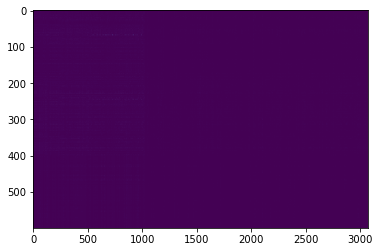

,AUC,pAUC
Source_0,0.66600,0.563684
Source_1,0.55230,0.511579
Source_2,0.51690,0.500526
Target_0,0.69000,0.561053
Target_1,0.52940,0.508947
Target_2,0.54250,0.529474
mean,0.58285,0.529211
h_mean,0.57536,0.528051


2021-04-23 22:59:04,391 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:0.192267, val_AUC_hmean:0.575360, val_pAUC_hmean:0.528051, best_flag:True
2021-04-23 22:59:04,391 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.35it/s]
2021-04-23 22:59:04,990 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.37it/s]
2021-04-23 22:59:05,198 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 22:59:05,390 - pytorch_modeler.py - INFO - epoch:93/300, train_losses:0.186198, val_AUC_hmean:0.583648, val_pAUC_hmean:0.525818, best_flag:False
2021-04-23 22:59:05,391 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-23 22:59:05,965 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:59:06,149 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:59:06,333 -

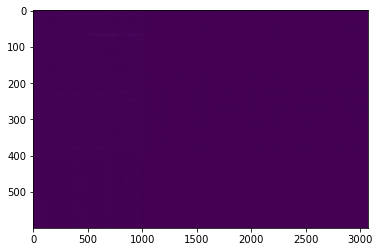

,AUC,pAUC
Source_0,0.672300,0.567368
Source_1,0.527900,0.504737
Source_2,0.541700,0.505263
Target_0,0.699400,0.567368
Target_1,0.529400,0.508421
Target_2,0.537400,0.529474
mean,0.584683,0.530439
h_mean,0.576518,0.529055


2021-04-23 22:59:18,911 - pytorch_modeler.py - INFO - epoch:106/300, train_losses:0.171220, val_AUC_hmean:0.576518, val_pAUC_hmean:0.529055, best_flag:True
2021-04-23 22:59:18,912 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
2021-04-23 22:59:19,492 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 22:59:19,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.66it/s]
2021-04-23 22:59:19,881 - pytorch_modeler.py - INFO - epoch:107/300, train_losses:0.174489, val_AUC_hmean:0.576647, val_pAUC_hmean:0.527801, best_flag:False
2021-04-23 22:59:19,883 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
2021-04-23 22:59:20,478 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.52it/s]
2021-04-23 22:59:20,679 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 22:59:20,863

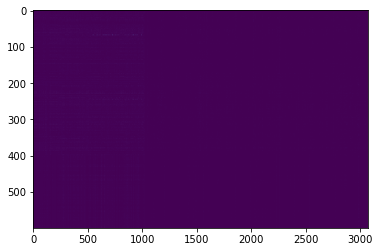

,AUC,pAUC
Source_0,0.675200,0.567895
Source_1,0.554500,0.512632
Source_2,0.515000,0.503684
Target_0,0.690000,0.567895
Target_1,0.532800,0.509474
Target_2,0.527900,0.528421
mean,0.582567,0.531667
h_mean,0.574346,0.530358


2021-04-23 22:59:33,349 - pytorch_modeler.py - INFO - epoch:120/300, train_losses:0.159759, val_AUC_hmean:0.574346, val_pAUC_hmean:0.530358, best_flag:True
2021-04-23 22:59:33,349 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.22it/s]
2021-04-23 22:59:33,973 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 22:59:34,162 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 22:59:34,351 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:0.158621, val_AUC_hmean:0.583222, val_pAUC_hmean:0.528419, best_flag:False
2021-04-23 22:59:34,352 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
2021-04-23 22:59:34,933 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 22:59:35,128 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 22:59:35,328

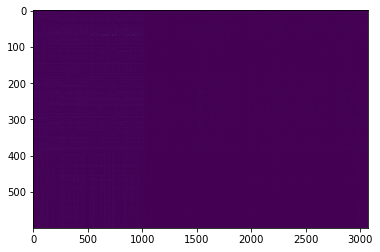

,AUC,pAUC
Source_0,0.675300,0.566316
Source_1,0.539400,0.512105
Source_2,0.554400,0.506842
Target_0,0.717100,0.572632
Target_1,0.530900,0.507895
Target_2,0.513600,0.535263
mean,0.588450,0.533509
h_mean,0.578948,0.532151


2021-04-23 22:59:49,612 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:0.150187, val_AUC_hmean:0.578948, val_pAUC_hmean:0.532151, best_flag:True
2021-04-23 22:59:49,613 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.28it/s]
2021-04-23 22:59:50,225 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 22:59:50,413 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.64it/s]
2021-04-23 22:59:50,615 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:0.168872, val_AUC_hmean:0.572368, val_pAUC_hmean:0.528698, best_flag:False
2021-04-23 22:59:50,616 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-23 22:59:51,192 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 22:59:51,382 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 22:59:51,574

100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 23:00:05,807 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 23:00:05,994 - pytorch_modeler.py - INFO - epoch:153/300, train_losses:0.139045, val_AUC_hmean:0.589275, val_pAUC_hmean:0.530200, best_flag:False
2021-04-23 23:00:05,996 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.38it/s]
2021-04-23 23:00:06,590 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 23:00:06,773 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:00:06,961 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:0.140839, val_AUC_hmean:0.584425, val_pAUC_hmean:0.528240, best_flag:False
2021-04-23 23:00:06,962 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-23 23:00:07,554 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
2021-04-23 23:00:21,987 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 23:00:22,177 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 23:00:22,376 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:0.132834, val_AUC_hmean:0.570237, val_pAUC_hmean:0.530580, best_flag:False
2021-04-23 23:00:22,377 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-23 23:00:22,948 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 23:00:23,139 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.81it/s]
2021-04-23 23:00:23,335 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:0.131510, val_AUC_hmean:0.586206, val_pAUC_hmean:0.531204, best_flag:False
2021-04-23 23:00:23,336 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

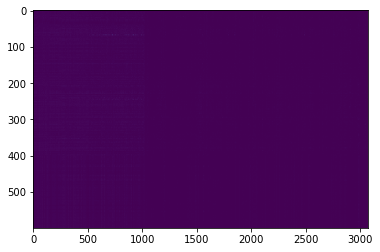

,AUC,pAUC
Source_0,0.679700,0.576316
Source_1,0.554500,0.510000
Source_2,0.558900,0.508421
Target_0,0.714900,0.571579
Target_1,0.532300,0.507368
Target_2,0.505900,0.530526
mean,0.591033,0.534035
h_mean,0.581508,0.532470


2021-04-23 23:00:28,039 - pytorch_modeler.py - INFO - epoch:175/300, train_losses:0.128224, val_AUC_hmean:0.581508, val_pAUC_hmean:0.532470, best_flag:True
2021-04-23 23:00:28,039 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-23 23:00:28,637 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.21it/s]
2021-04-23 23:00:28,970 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2021-04-23 23:00:29,296 - pytorch_modeler.py - INFO - epoch:176/300, train_losses:0.124489, val_AUC_hmean:0.576749, val_pAUC_hmean:0.530173, best_flag:False
2021-04-23 23:00:29,297 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-23 23:00:29,889 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.19it/s]
2021-04-23 23:00:30,223 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2021-04-23 23:00:30,553

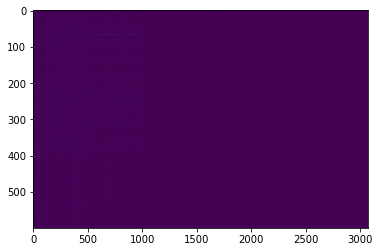

,AUC,pAUC
Source_0,0.689500,0.577368
Source_1,0.561100,0.511579
Source_2,0.547200,0.510526
Target_0,0.718100,0.571579
Target_1,0.530800,0.504737
Target_2,0.529700,0.534211
mean,0.596067,0.535000
h_mean,0.586832,0.533419


2021-04-23 23:00:34,619 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:0.123039, val_AUC_hmean:0.586832, val_pAUC_hmean:0.533419, best_flag:True
2021-04-23 23:00:34,620 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.34it/s]
2021-04-23 23:00:35,083 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]
2021-04-23 23:00:35,276 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 23:00:35,462 - pytorch_modeler.py - INFO - epoch:181/300, train_losses:0.120989, val_AUC_hmean:0.579980, val_pAUC_hmean:0.532052, best_flag:False
2021-04-23 23:00:35,463 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 23:00:35,911 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 23:00:36,092 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 23:00:36,276

100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 23:00:48,606 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.39it/s]
2021-04-23 23:00:48,820 - pytorch_modeler.py - INFO - epoch:197/300, train_losses:0.112602, val_AUC_hmean:0.579070, val_pAUC_hmean:0.530508, best_flag:False
2021-04-23 23:00:48,821 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-23 23:00:49,265 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 23:00:49,456 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 23:00:49,642 - pytorch_modeler.py - INFO - epoch:198/300, train_losses:0.110898, val_AUC_hmean:0.586754, val_pAUC_hmean:0.529724, best_flag:False
2021-04-23 23:00:49,644 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 23:00:50,086 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  4.43it/s]
2021-04-23 23:01:02,626 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-23 23:01:02,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-23 23:01:03,001 - pytorch_modeler.py - INFO - epoch:214/300, train_losses:0.104013, val_AUC_hmean:0.581256, val_pAUC_hmean:0.530367, best_flag:False
2021-04-23 23:01:03,003 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.33it/s]
2021-04-23 23:01:03,467 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.62it/s]
2021-04-23 23:01:03,665 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-23 23:01:03,854 - pytorch_modeler.py - INFO - epoch:215/300, train_losses:0.103483, val_AUC_hmean:0.578045, val_pAUC_hmean:0.528506, best_flag:False
2021-04-23 23:01:03,856 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-23 23:01:16,409 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.32it/s]
2021-04-23 23:01:16,875 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:01:17,057 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 23:01:17,243 - pytorch_modeler.py - INFO - epoch:231/300, train_losses:0.098157, val_AUC_hmean:0.581412, val_pAUC_hmean:0.530030, best_flag:False
2021-04-23 23:01:17,244 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 23:01:17,700 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 23:01:17,881 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:01:18,075 - pytorch_modeler.py - INFO - epoch:232/300, train_losses:0.097773, val_AUC_hmean:0.575529, val_pAUC_hmean:0.532003, best_flag:False
2021-04-23 23:01:18,07

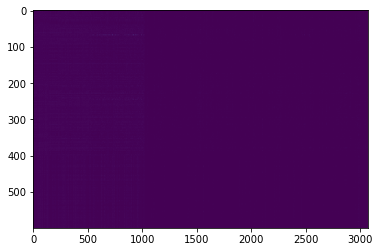

,AUC,pAUC
Source_0,0.677800,0.577368
Source_1,0.552600,0.508421
Source_2,0.549400,0.517368
Target_0,0.714700,0.573158
Target_1,0.534400,0.505789
Target_2,0.498700,0.529474
mean,0.587933,0.535263
h_mean,0.577989,0.533702


2021-04-23 23:01:25,615 - pytorch_modeler.py - INFO - epoch:240/300, train_losses:0.094008, val_AUC_hmean:0.577989, val_pAUC_hmean:0.533702, best_flag:True
2021-04-23 23:01:25,616 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 23:01:26,068 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.62it/s]
2021-04-23 23:01:26,267 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 23:01:26,459 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:0.094530, val_AUC_hmean:0.582678, val_pAUC_hmean:0.529334, best_flag:False
2021-04-23 23:01:26,460 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 23:01:26,913 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 23:01:27,096 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 23:01:27,291

100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 23:01:39,590 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 23:01:39,776 - pytorch_modeler.py - INFO - epoch:257/300, train_losses:0.088205, val_AUC_hmean:0.582919, val_pAUC_hmean:0.529942, best_flag:False
2021-04-23 23:01:39,777 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 23:01:40,230 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 23:01:40,412 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-23 23:01:40,602 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:0.086252, val_AUC_hmean:0.583005, val_pAUC_hmean:0.531925, best_flag:False
2021-04-23 23:01:40,603 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 23:01:41,053 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 23:01:53,590 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 23:01:53,784 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 23:01:53,971 - pytorch_modeler.py - INFO - epoch:274/300, train_losses:0.084722, val_AUC_hmean:0.582321, val_pAUC_hmean:0.530512, best_flag:False
2021-04-23 23:01:53,972 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-23 23:01:54,423 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 23:01:54,607 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 23:01:54,799 - pytorch_modeler.py - INFO - epoch:275/300, train_losses:0.081789, val_AUC_hmean:0.583042, val_pAUC_hmean:0.531464, best_flag:False
2021-04-23 23:01:54,800 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

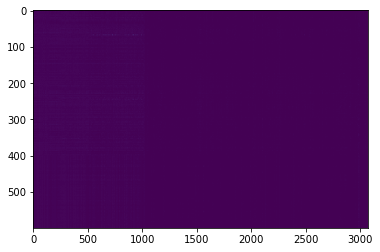

,AUC,pAUC
Source_0,0.682400,0.572632
Source_1,0.551400,0.504737
Source_2,0.564000,0.525789
Target_0,0.716300,0.580526
Target_1,0.529700,0.503158
Target_2,0.495300,0.530000
mean,0.589850,0.536140
h_mean,0.579434,0.534461


2021-04-23 23:02:04,068 - pytorch_modeler.py - INFO - epoch:285/300, train_losses:0.080482, val_AUC_hmean:0.579434, val_pAUC_hmean:0.534461, best_flag:True
2021-04-23 23:02:04,069 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-23 23:02:04,521 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 23:02:04,701 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 23:02:04,886 - pytorch_modeler.py - INFO - epoch:286/300, train_losses:0.080004, val_AUC_hmean:0.589574, val_pAUC_hmean:0.530034, best_flag:False
2021-04-23 23:02:04,888 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 23:02:05,327 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 23:02:05,512 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.67it/s]
2021-04-23 23:02:05,713

,AUC,pAUC
Source_0,0.682400,0.572632
Source_1,0.551400,0.504737
Source_2,0.564000,0.525789
Target_0,0.716300,0.580526
Target_1,0.529700,0.503158
Target_2,0.495300,0.530000
mean,0.589850,0.536140
h_mean,0.579434,0.534461


2021-04-23 23:02:16,607 - 00_train.py - INFO - TARGET MACHINE_TYPE: slider
2021-04-23 23:02:16,608 - 00_train.py - INFO - MAKE DATA_LOADER


elapsed time: 292.063748360 [sec]


2021-04-23 23:02:17,130 - 00_train.py - INFO - TRAINING
2021-04-23 23:02:17,344 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.39it/s]
2021-04-23 23:02:17,803 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:02:17,985 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


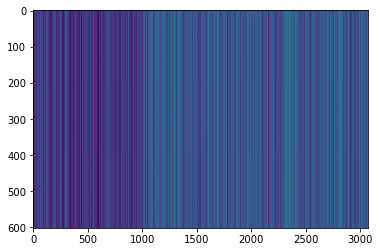

,AUC,pAUC
Source_0,0.455800,0.492105
Source_1,0.403200,0.478421
Source_2,0.386631,0.492448
Target_0,0.431100,0.483158
Target_1,0.421020,0.493770
Target_2,0.433295,0.503632
mean,0.421841,0.490589
h_mean,0.420661,0.490457


2021-04-23 23:02:19,088 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:56.593754, val_AUC_hmean:0.420661, val_pAUC_hmean:0.490457, best_flag:True
2021-04-23 23:02:19,089 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-23 23:02:19,539 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 23:02:19,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


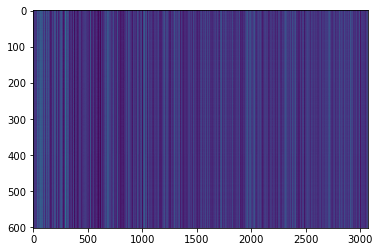

,AUC,pAUC
Source_0,0.454900,0.483158
Source_1,0.384500,0.473684
Source_2,0.372638,0.492917
Target_0,0.437200,0.494211
Target_1,0.426837,0.492803
Target_2,0.450788,0.509096
mean,0.421144,0.490978
h_mean,0.418671,0.490738


2021-04-23 23:02:20,859 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:21.578742, val_AUC_hmean:0.418671, val_pAUC_hmean:0.490738, best_flag:True
2021-04-23 23:02:20,860 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 23:02:21,308 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 23:02:21,502 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


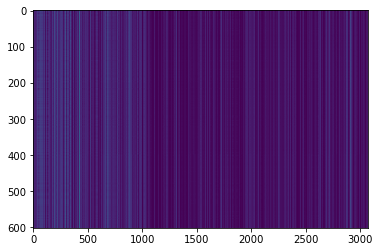

,AUC,pAUC
Source_0,0.465700,0.504211
Source_1,0.385600,0.473684
Source_2,0.393494,0.508866
Target_0,0.432000,0.496316
Target_1,0.429694,0.501182
Target_2,0.461457,0.513244
mean,0.427991,0.499584
h_mean,0.425801,0.499248


2021-04-23 23:02:22,614 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:11.192697, val_AUC_hmean:0.425801, val_pAUC_hmean:0.499248, best_flag:True
2021-04-23 23:02:22,615 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-23 23:02:23,060 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:02:23,243 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-23 23:02:23,429 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:6.681041, val_AUC_hmean:0.425625, val_pAUC_hmean:0.492935, best_flag:False
2021-04-23 23:02:23,430 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 23:02:23,868 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 23:02:24,057 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-23 23:02:24,252 - 

100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


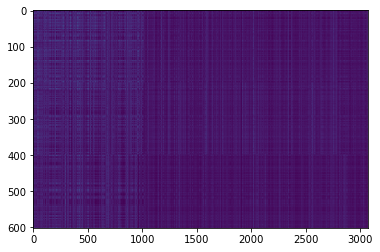

,AUC,pAUC
Source_0,0.550800,0.477368
Source_1,0.592200,0.510000
Source_2,0.578253,0.492448
Target_0,0.550700,0.505263
Target_1,0.552245,0.511386
Target_2,0.581603,0.510310
mean,0.567634,0.501129
h_mean,0.567132,0.500814


2021-04-23 23:02:37,415 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:0.513319, val_AUC_hmean:0.567132, val_pAUC_hmean:0.500814, best_flag:True
2021-04-23 23:02:37,416 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.31it/s]
2021-04-23 23:02:37,882 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:02:38,065 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


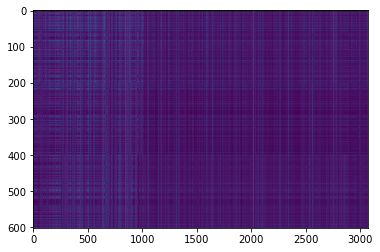

,AUC,pAUC
Source_0,0.542300,0.480000
Source_1,0.583400,0.516316
Source_2,0.588414,0.493386
Target_0,0.562600,0.510526
Target_1,0.548163,0.507734
Target_2,0.589581,0.500496
mean,0.569076,0.501410
h_mean,0.568428,0.501117


2021-04-23 23:02:39,174 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:0.480952, val_AUC_hmean:0.568428, val_pAUC_hmean:0.501117, best_flag:True
2021-04-23 23:02:39,175 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 23:02:39,623 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 23:02:39,808 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


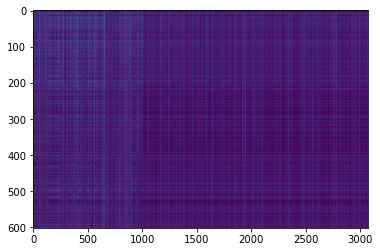

,AUC,pAUC
Source_0,0.527500,0.476316
Source_1,0.582900,0.525263
Source_2,0.566310,0.489164
Target_0,0.566300,0.527368
Target_1,0.554490,0.520301
Target_2,0.587370,0.496449
mean,0.564145,0.505810
h_mean,0.563437,0.505049


2021-04-23 23:02:40,914 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.469652, val_AUC_hmean:0.563437, val_pAUC_hmean:0.505049, best_flag:True
2021-04-23 23:02:40,916 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 23:02:41,373 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 23:02:41,562 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


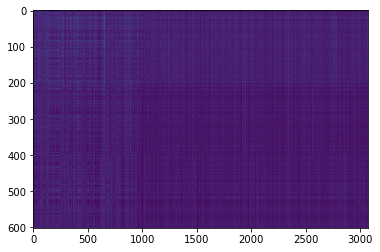

,AUC,pAUC
Source_0,0.542800,0.487895
Source_1,0.606300,0.566316
Source_2,0.567112,0.498077
Target_0,0.580500,0.558421
Target_1,0.551633,0.525994
Target_2,0.575548,0.504846
mean,0.570649,0.523591
h_mean,0.569914,0.521926


2021-04-23 23:02:42,665 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.441801, val_AUC_hmean:0.569914, val_pAUC_hmean:0.521926, best_flag:True
2021-04-23 23:02:42,666 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 23:02:43,123 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-23 23:02:43,303 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 23:02:43,489 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.436144, val_AUC_hmean:0.575881, val_pAUC_hmean:0.521308, best_flag:False
2021-04-23 23:02:43,491 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-23 23:02:43,928 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-23 23:02:44,108 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 23:02:44,298 -

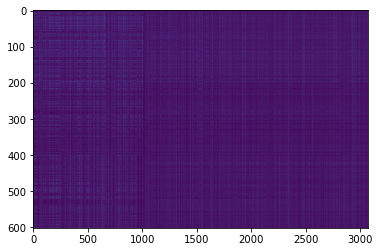

,AUC,pAUC
Source_0,0.561200,0.505789
Source_1,0.638800,0.577368
Source_2,0.610606,0.522469
Target_0,0.599100,0.514737
Target_1,0.574184,0.522879
Target_2,0.612168,0.515976
mean,0.599343,0.526536
h_mean,0.598244,0.525560


2021-04-23 23:02:46,860 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.399513, val_AUC_hmean:0.598244, val_pAUC_hmean:0.525560, best_flag:True
2021-04-23 23:02:46,861 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 23:02:47,309 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 23:02:47,493 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-23 23:02:47,698 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.393182, val_AUC_hmean:0.588227, val_pAUC_hmean:0.515342, best_flag:False
2021-04-23 23:02:47,699 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-23 23:02:48,138 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:02:48,323 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


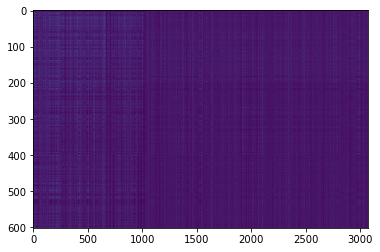

,AUC,pAUC
Source_0,0.534300,0.515263
Source_1,0.619800,0.570526
Source_2,0.618449,0.521531
Target_0,0.598400,0.526842
Target_1,0.532041,0.523845
Target_2,0.641869,0.521136
mean,0.590810,0.529857
h_mean,0.587624,0.529245


2021-04-23 23:02:49,442 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.386002, val_AUC_hmean:0.587624, val_pAUC_hmean:0.529245, best_flag:True
2021-04-23 23:02:49,443 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.29it/s]
2021-04-23 23:02:49,911 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.59it/s]
2021-04-23 23:02:50,111 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


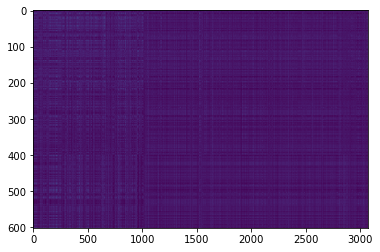

,AUC,pAUC
Source_0,0.627400,0.537368
Source_1,0.664300,0.583158
Source_2,0.647326,0.561404
Target_0,0.614900,0.532105
Target_1,0.566837,0.555102
Target_2,0.642445,0.511018
mean,0.627201,0.546693
h_mean,0.625583,0.545720


2021-04-23 23:02:51,262 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.371927, val_AUC_hmean:0.625583, val_pAUC_hmean:0.545720, best_flag:True
2021-04-23 23:02:51,263 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-23 23:02:51,711 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.57it/s]
2021-04-23 23:02:51,914 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 23:02:52,100 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.374450, val_AUC_hmean:0.604369, val_pAUC_hmean:0.527062, best_flag:False
2021-04-23 23:02:52,101 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 23:02:52,557 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 23:02:52,741 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 23:02:52,929 -

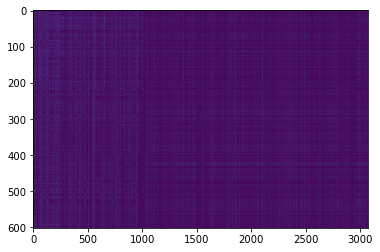

,AUC,pAUC
Source_0,0.616600,0.553684
Source_1,0.622000,0.585789
Source_2,0.606952,0.598461
Target_0,0.575400,0.521053
Target_1,0.488878,0.536627
Target_2,0.649270,0.541877
mean,0.593183,0.556249
h_mean,0.588195,0.554926


2021-04-23 23:02:55,537 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:0.356048, val_AUC_hmean:0.588195, val_pAUC_hmean:0.554926, best_flag:True
2021-04-23 23:02:55,538 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.42it/s]
2021-04-23 23:02:55,992 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 23:02:56,177 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 23:02:56,366 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:0.351812, val_AUC_hmean:0.621098, val_pAUC_hmean:0.540768, best_flag:False
2021-04-23 23:02:56,367 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-23 23:02:56,810 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 23:02:56,995 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 23:02:57,185 -

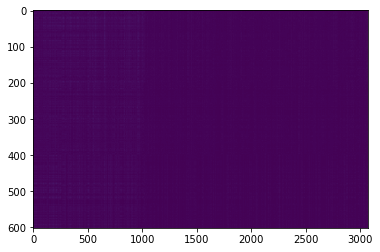

,AUC,pAUC
Source_0,0.619500,0.521579
Source_1,0.673100,0.611053
Source_2,0.697504,0.577352
Target_0,0.588700,0.567895
Target_1,0.563673,0.539527
Target_2,0.685409,0.524070
mean,0.637981,0.556913
h_mean,0.633896,0.555128


2021-04-23 23:03:03,099 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:0.334553, val_AUC_hmean:0.633896, val_pAUC_hmean:0.555128, best_flag:True
2021-04-23 23:03:03,100 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-23 23:03:03,671 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 23:03:03,856 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


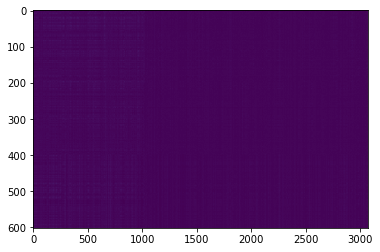

,AUC,pAUC
Source_0,0.630700,0.521053
Source_1,0.688500,0.603158
Source_2,0.700535,0.575945
Target_0,0.614500,0.568947
Target_1,0.586939,0.550806
Target_2,0.683775,0.525183
mean,0.650825,0.557515
h_mean,0.648017,0.556036


2021-04-23 23:03:04,955 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:0.324810, val_AUC_hmean:0.648017, val_pAUC_hmean:0.556036, best_flag:True
2021-04-23 23:03:04,955 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 23:03:05,534 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-23 23:03:05,716 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


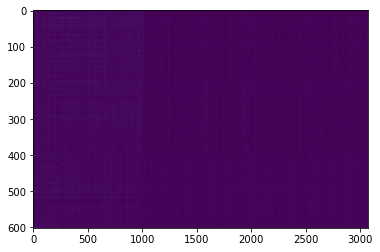

,AUC,pAUC
Source_0,0.613200,0.520526
Source_1,0.714100,0.611579
Source_2,0.674866,0.583451
Target_0,0.595700,0.563684
Target_1,0.567245,0.552417
Target_2,0.680604,0.525183
mean,0.640952,0.559473
h_mean,0.636685,0.557696


2021-04-23 23:03:06,850 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:0.320177, val_AUC_hmean:0.636685, val_pAUC_hmean:0.557696, best_flag:True
2021-04-23 23:03:06,851 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-23 23:03:07,448 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 23:03:07,638 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


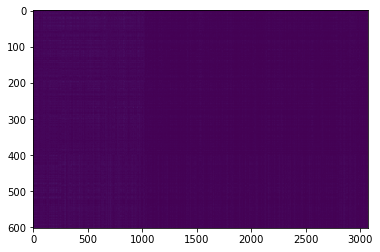

,AUC,pAUC
Source_0,0.658600,0.528947
Source_1,0.706800,0.607895
Source_2,0.705437,0.595647
Target_0,0.612300,0.564211
Target_1,0.604898,0.545650
Target_2,0.671665,0.523766
mean,0.659950,0.561019
h_mean,0.657465,0.559246


2021-04-23 23:03:08,765 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:0.317535, val_AUC_hmean:0.657465, val_pAUC_hmean:0.559246, best_flag:True
2021-04-23 23:03:08,766 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 23:03:09,350 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.77it/s]
2021-04-23 23:03:09,545 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 23:03:09,737 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:0.319831, val_AUC_hmean:0.641240, val_pAUC_hmean:0.554586, best_flag:False
2021-04-23 23:03:09,738 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 23:03:10,325 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-23 23:03:10,513 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


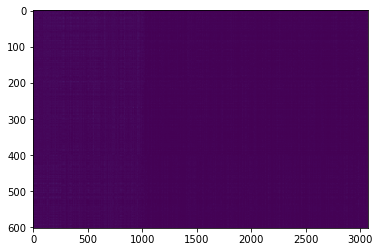

,AUC,pAUC
Source_0,0.642900,0.532632
Source_1,0.724000,0.623158
Source_2,0.714260,0.605029
Target_0,0.569000,0.561053
Target_1,0.577245,0.543394
Target_2,0.666571,0.526194
mean,0.648996,0.565243
h_mean,0.643310,0.562952


2021-04-23 23:03:11,661 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:0.314423, val_AUC_hmean:0.643310, val_pAUC_hmean:0.562952, best_flag:True
2021-04-23 23:03:11,662 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.27it/s]
2021-04-23 23:03:12,275 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-23 23:03:12,465 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


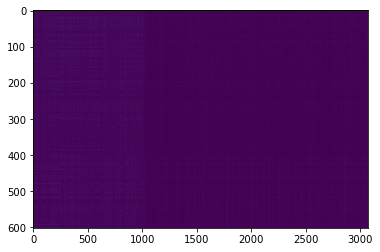

,AUC,pAUC
Source_0,0.673900,0.541053
Source_1,0.703300,0.614737
Source_2,0.705437,0.611127
Target_0,0.585700,0.554737
Target_1,0.545102,0.542320
Target_2,0.670415,0.528420
mean,0.647309,0.565399
h_mean,0.641243,0.563364


2021-04-23 23:03:13,631 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:0.311256, val_AUC_hmean:0.641243, val_pAUC_hmean:0.563364, best_flag:True
2021-04-23 23:03:13,632 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
2021-04-23 23:03:14,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.55it/s]
2021-04-23 23:03:14,431 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


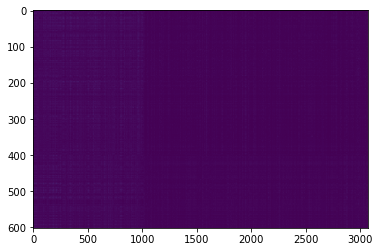

,AUC,pAUC
Source_0,0.654600,0.542105
Source_1,0.742700,0.634737
Source_2,0.710339,0.607843
Target_0,0.606300,0.557895
Target_1,0.565918,0.548228
Target_2,0.654652,0.531860
mean,0.655752,0.570445
h_mean,0.650351,0.568075


2021-04-23 23:03:15,547 - pytorch_modeler.py - INFO - epoch:49/300, train_losses:0.307321, val_AUC_hmean:0.650351, val_pAUC_hmean:0.568075, best_flag:True
2021-04-23 23:03:15,548 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.27it/s]
2021-04-23 23:03:16,161 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.11it/s]
2021-04-23 23:03:16,506 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2021-04-23 23:03:16,833 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:0.306537, val_AUC_hmean:0.634547, val_pAUC_hmean:0.564302, best_flag:False
2021-04-23 23:03:16,834 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.25it/s]
2021-04-23 23:03:17,451 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.15it/s]
2021-04-23 23:03:17,791 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.28it/s]


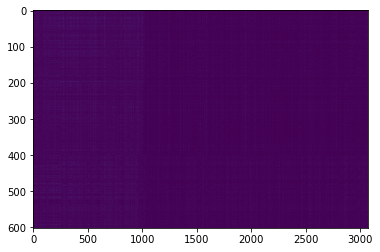

,AUC,pAUC
Source_0,0.676600,0.543158
Source_1,0.732400,0.641579
Source_2,0.715241,0.625199
Target_0,0.580100,0.546842
Target_1,0.552041,0.553169
Target_2,0.654075,0.532771
mean,0.651743,0.573786
h_mean,0.644769,0.570741


2021-04-23 23:03:19,119 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:0.301711, val_AUC_hmean:0.644769, val_pAUC_hmean:0.570741, best_flag:True
2021-04-23 23:03:19,120 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-23 23:03:19,581 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
2021-04-23 23:03:19,765 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


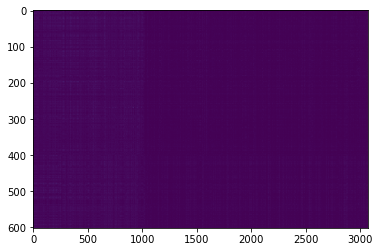

,AUC,pAUC
Source_0,0.694100,0.552105
Source_1,0.734700,0.631579
Source_2,0.718627,0.626607
Target_0,0.570600,0.544737
Target_1,0.536837,0.548872
Target_2,0.655805,0.538133
mean,0.651778,0.573672
h_mean,0.642845,0.571079


2021-04-23 23:03:20,915 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:0.297103, val_AUC_hmean:0.642845, val_pAUC_hmean:0.571079, best_flag:True
2021-04-23 23:03:20,916 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.30it/s]
2021-04-23 23:03:21,384 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 23:03:21,574 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


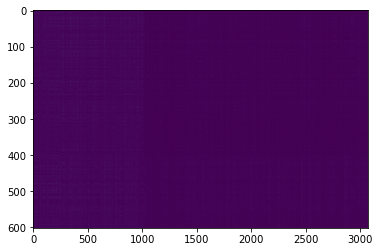

,AUC,pAUC
Source_0,0.672600,0.546842
Source_1,0.739200,0.631053
Source_2,0.716934,0.638803
Target_0,0.586400,0.549474
Target_1,0.542449,0.546939
Target_2,0.644271,0.536110
mean,0.650309,0.574870
h_mean,0.642717,0.571846


2021-04-23 23:03:22,731 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:0.292734, val_AUC_hmean:0.642717, val_pAUC_hmean:0.571846, best_flag:True
2021-04-23 23:03:22,732 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.27it/s]
2021-04-23 23:03:23,203 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.56it/s]
2021-04-23 23:03:23,404 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 23:03:23,589 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:0.288223, val_AUC_hmean:0.651174, val_pAUC_hmean:0.570339, best_flag:False
2021-04-23 23:03:23,590 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 23:03:24,043 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-23 23:03:24,221 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


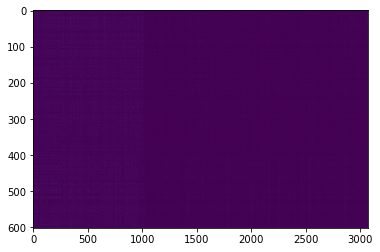

,AUC,pAUC
Source_0,0.674900,0.547368
Source_1,0.745200,0.631579
Source_2,0.728520,0.634112
Target_0,0.597600,0.547895
Target_1,0.562449,0.554780
Target_2,0.651384,0.538133
mean,0.660009,0.575645
h_mean,0.653398,0.572889


2021-04-23 23:03:25,359 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:0.287518, val_AUC_hmean:0.653398, val_pAUC_hmean:0.572889, best_flag:True
2021-04-23 23:03:25,360 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-23 23:03:25,800 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 23:03:25,982 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


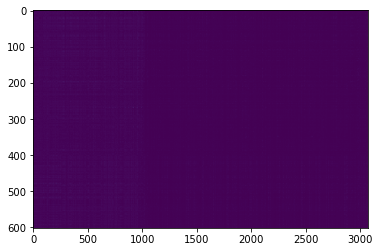

,AUC,pAUC
Source_0,0.681700,0.545263
Source_1,0.727400,0.645789
Source_2,0.726114,0.632236
Target_0,0.575100,0.548421
Target_1,0.548776,0.554135
Target_2,0.638793,0.536514
mean,0.649647,0.577060
h_mean,0.642027,0.573829


2021-04-23 23:03:27,131 - pytorch_modeler.py - INFO - epoch:56/300, train_losses:0.287858, val_AUC_hmean:0.642027, val_pAUC_hmean:0.573829, best_flag:True
2021-04-23 23:03:27,132 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.27it/s]
2021-04-23 23:03:27,603 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-23 23:03:27,795 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 23:03:27,988 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:0.298406, val_AUC_hmean:0.657199, val_pAUC_hmean:0.571828, best_flag:False
2021-04-23 23:03:27,990 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-23 23:03:28,435 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-23 23:03:28,613 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 23:03:28,800 -

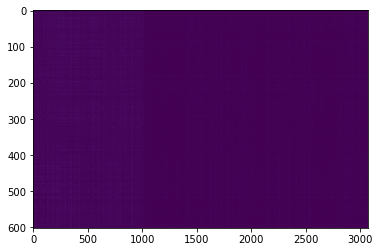

,AUC,pAUC
Source_0,0.698900,0.572632
Source_1,0.786800,0.635789
Source_2,0.708021,0.625199
Target_0,0.572300,0.538947
Target_1,0.561224,0.560795
Target_2,0.593137,0.539347
mean,0.653397,0.578785
h_mean,0.643136,0.576291


2021-04-23 23:03:33,053 - pytorch_modeler.py - INFO - epoch:62/300, train_losses:0.287965, val_AUC_hmean:0.643136, val_pAUC_hmean:0.576291, best_flag:True
2021-04-23 23:03:33,054 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.17it/s]
2021-04-23 23:03:33,536 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.72it/s]
2021-04-23 23:03:33,730 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


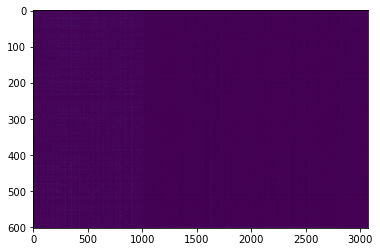

,AUC,pAUC
Source_0,0.693800,0.586842
Source_1,0.785900,0.636842
Source_2,0.695276,0.623323
Target_0,0.576900,0.540000
Target_1,0.551633,0.564662
Target_2,0.586409,0.536211
mean,0.648320,0.581313
h_mean,0.638058,0.578796


2021-04-23 23:03:34,838 - pytorch_modeler.py - INFO - epoch:63/300, train_losses:0.282428, val_AUC_hmean:0.638058, val_pAUC_hmean:0.578796, best_flag:True
2021-04-23 23:03:34,839 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-23 23:03:35,290 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 23:03:35,475 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


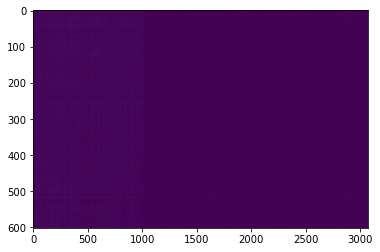

,AUC,pAUC
Source_0,0.703100,0.576842
Source_1,0.790700,0.644211
Source_2,0.710784,0.632236
Target_0,0.581800,0.545263
Target_1,0.581122,0.565414
Target_2,0.597559,0.538639
mean,0.660844,0.583767
h_mean,0.651681,0.581019


2021-04-23 23:03:36,553 - pytorch_modeler.py - INFO - epoch:64/300, train_losses:0.278861, val_AUC_hmean:0.651681, val_pAUC_hmean:0.581019, best_flag:True
2021-04-23 23:03:36,554 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-23 23:03:36,997 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 23:03:37,183 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


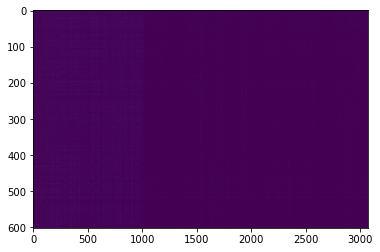

,AUC,pAUC
Source_0,0.695300,0.580000
Source_1,0.796500,0.647368
Source_2,0.689127,0.633174
Target_0,0.588800,0.546842
Target_1,0.554490,0.564232
Target_2,0.589869,0.538740
mean,0.652348,0.585059
h_mean,0.642264,0.582220


2021-04-23 23:03:38,312 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:0.275719, val_AUC_hmean:0.642264, val_pAUC_hmean:0.582220, best_flag:True
2021-04-23 23:03:38,313 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-23 23:03:38,771 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-23 23:03:38,950 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


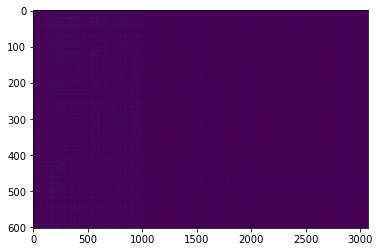

,AUC,pAUC
Source_0,0.706100,0.592632
Source_1,0.802900,0.650526
Source_2,0.696524,0.630359
Target_0,0.554800,0.544211
Target_1,0.569694,0.567132
Target_2,0.584679,0.535705
mean,0.652449,0.586761
h_mean,0.640647,0.583744


2021-04-23 23:03:40,065 - pytorch_modeler.py - INFO - epoch:66/300, train_losses:0.273157, val_AUC_hmean:0.640647, val_pAUC_hmean:0.583744, best_flag:True
2021-04-23 23:03:40,066 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-23 23:03:40,527 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 23:03:40,719 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


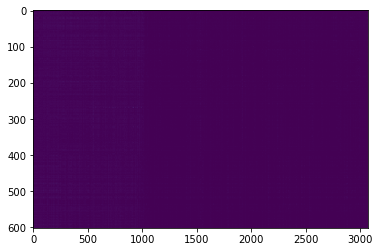

,AUC,pAUC
Source_0,0.716600,0.574211
Source_1,0.799800,0.649474
Source_2,0.729412,0.643025
Target_0,0.597200,0.546842
Target_1,0.558469,0.565306
Target_2,0.611880,0.544305
mean,0.668894,0.587194
h_mean,0.658172,0.584156


2021-04-23 23:03:41,836 - pytorch_modeler.py - INFO - epoch:67/300, train_losses:0.271132, val_AUC_hmean:0.658172, val_pAUC_hmean:0.584156, best_flag:True
2021-04-23 23:03:41,837 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 23:03:42,292 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-23 23:03:42,484 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-23 23:03:42,669 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:0.267477, val_AUC_hmean:0.636106, val_pAUC_hmean:0.581298, best_flag:False
2021-04-23 23:03:42,670 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-23 23:03:43,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-23 23:03:43,292 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-23 23:03:43,478 -

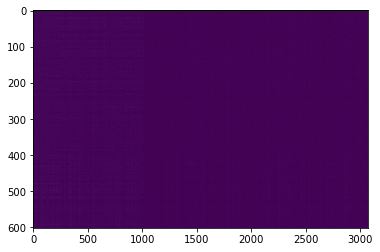

,AUC,pAUC
Source_0,0.702600,0.563684
Source_1,0.769900,0.656316
Source_2,0.754100,0.650530
Target_0,0.603100,0.546316
Target_1,0.582551,0.564017
Target_2,0.614571,0.547239
mean,0.671137,0.588017
h_mean,0.662978,0.584471


2021-04-23 23:03:50,157 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:0.251005, val_AUC_hmean:0.662978, val_pAUC_hmean:0.584471, best_flag:True
2021-04-23 23:03:50,158 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 23:03:50,608 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 23:03:50,793 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 23:03:50,983 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:0.253063, val_AUC_hmean:0.642044, val_pAUC_hmean:0.576638, best_flag:False
2021-04-23 23:03:50,984 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-23 23:03:51,431 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-23 23:03:51,610 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:03:51,798 -

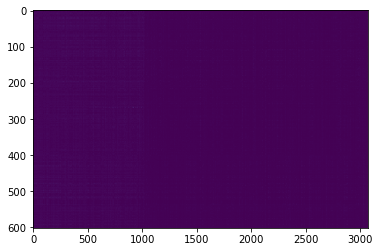

,AUC,pAUC
Source_0,0.703100,0.565263
Source_1,0.792900,0.648421
Source_2,0.746257,0.657097
Target_0,0.603100,0.546316
Target_1,0.550408,0.564447
Target_2,0.617455,0.546733
mean,0.668870,0.588046
h_mean,0.658041,0.584552


2021-04-23 23:03:53,540 - pytorch_modeler.py - INFO - epoch:79/300, train_losses:0.251615, val_AUC_hmean:0.658041, val_pAUC_hmean:0.584552, best_flag:True
2021-04-23 23:03:53,541 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 23:03:53,993 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-23 23:03:54,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 23:03:54,375 - pytorch_modeler.py - INFO - epoch:80/300, train_losses:0.247923, val_AUC_hmean:0.655710, val_pAUC_hmean:0.577091, best_flag:False
2021-04-23 23:03:54,376 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-23 23:03:54,825 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.79it/s]
2021-04-23 23:03:55,024 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 23:03:55,220 -

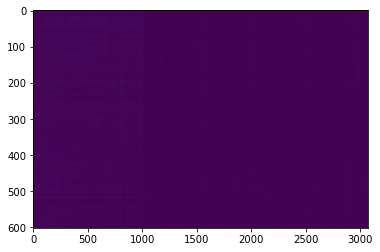

,AUC,pAUC
Source_0,0.690400,0.561579
Source_1,0.798100,0.668421
Source_2,0.735740,0.658974
Target_0,0.608100,0.543684
Target_1,0.579490,0.560795
Target_2,0.619473,0.554220
mean,0.671884,0.591279
h_mean,0.663351,0.587021


2021-04-23 23:03:59,507 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:0.236804, val_AUC_hmean:0.663351, val_pAUC_hmean:0.587021, best_flag:True
2021-04-23 23:03:59,508 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-23 23:03:59,963 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.61it/s]
2021-04-23 23:04:00,162 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 23:04:00,348 - pytorch_modeler.py - INFO - epoch:86/300, train_losses:0.235631, val_AUC_hmean:0.656369, val_pAUC_hmean:0.582723, best_flag:False
2021-04-23 23:04:00,349 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 23:04:00,802 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-23 23:04:00,992 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 23:04:01,180 -

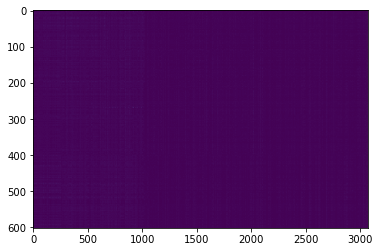

,AUC,pAUC
Source_0,0.694700,0.571579
Source_1,0.779500,0.663158
Source_2,0.720677,0.660381
Target_0,0.598400,0.538421
Target_1,0.512551,0.579807
Target_2,0.610246,0.555232
mean,0.652679,0.594763
h_mean,0.640290,0.590854


2021-04-23 23:04:05,438 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:0.240544, val_AUC_hmean:0.640290, val_pAUC_hmean:0.590854, best_flag:True
2021-04-23 23:04:05,439 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-23 23:04:05,898 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 23:04:06,095 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-23 23:04:06,289 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:0.235053, val_AUC_hmean:0.654196, val_pAUC_hmean:0.583391, best_flag:False
2021-04-23 23:04:06,291 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-23 23:04:06,744 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-23 23:04:06,935 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 23:04:07,126 -

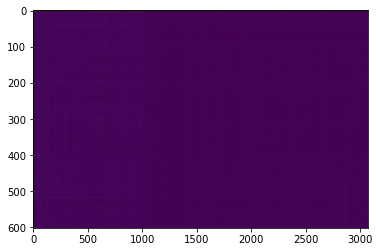

,AUC,pAUC
Source_0,0.702500,0.558947
Source_1,0.797300,0.671579
Source_2,0.745811,0.667417
Target_0,0.608500,0.548947
Target_1,0.561429,0.577121
Target_2,0.617263,0.553208
mean,0.672134,0.596203
h_mean,0.662021,0.591806


2021-04-23 23:04:14,677 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:0.217961, val_AUC_hmean:0.662021, val_pAUC_hmean:0.591806, best_flag:True
2021-04-23 23:04:14,678 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.38it/s]
2021-04-23 23:04:15,272 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:04:15,456 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


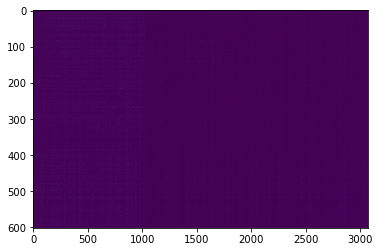

,AUC,pAUC
Source_0,0.747200,0.593158
Source_1,0.797200,0.657368
Source_2,0.768093,0.671639
Target_0,0.604600,0.543684
Target_1,0.549184,0.567669
Target_2,0.600250,0.551387
mean,0.677754,0.597484
h_mean,0.664048,0.593442


2021-04-23 23:04:16,553 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:0.219375, val_AUC_hmean:0.664048, val_pAUC_hmean:0.593442, best_flag:True
2021-04-23 23:04:16,554 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.41it/s]
2021-04-23 23:04:17,143 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.36it/s]
2021-04-23 23:04:17,352 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.63it/s]
2021-04-23 23:04:17,556 - pytorch_modeler.py - INFO - epoch:103/300, train_losses:0.216325, val_AUC_hmean:0.647830, val_pAUC_hmean:0.588051, best_flag:False
2021-04-23 23:04:17,557 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 23:04:18,142 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 23:04:18,321 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


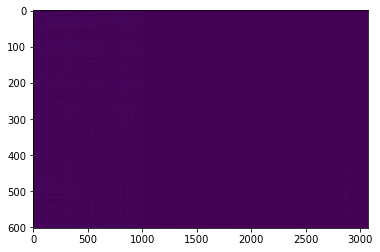

,AUC,pAUC
Source_0,0.740300,0.598947
Source_1,0.807200,0.662632
Source_2,0.758467,0.668824
Target_0,0.592400,0.549474
Target_1,0.546020,0.581633
Target_2,0.608708,0.548251
mean,0.675516,0.601627
h_mean,0.661492,0.597783


2021-04-23 23:04:19,429 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:0.214544, val_AUC_hmean:0.661492, val_pAUC_hmean:0.597783, best_flag:True
2021-04-23 23:04:19,430 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.28it/s]
2021-04-23 23:04:20,043 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:04:20,230 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 23:04:20,418 - pytorch_modeler.py - INFO - epoch:105/300, train_losses:0.211184, val_AUC_hmean:0.651581, val_pAUC_hmean:0.585619, best_flag:False
2021-04-23 23:04:20,419 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.27it/s]
2021-04-23 23:04:21,033 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]
2021-04-23 23:04:21,226 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.61it/s]
2021-04-23 23:04:21,430

100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-23 23:04:35,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 23:04:35,859 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:0.201005, val_AUC_hmean:0.636526, val_pAUC_hmean:0.581674, best_flag:False
2021-04-23 23:04:35,859 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.41it/s]
2021-04-23 23:04:36,448 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-23 23:04:36,645 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:04:36,834 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:0.198176, val_AUC_hmean:0.645143, val_pAUC_hmean:0.584311, best_flag:False
2021-04-23 23:04:36,835 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-23 23:04:37,432 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

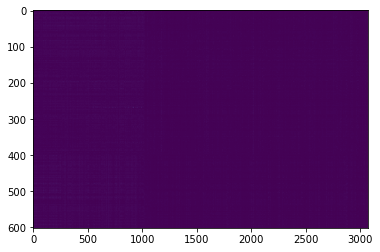

,AUC,pAUC
Source_0,0.723100,0.590000
Source_1,0.816200,0.680526
Source_2,0.757932,0.676330
Target_0,0.598400,0.542105
Target_1,0.546633,0.581955
Target_2,0.554594,0.548453
mean,0.666143,0.603228
h_mean,0.649975,0.598250


2021-04-23 23:04:42,614 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:0.196520, val_AUC_hmean:0.649975, val_pAUC_hmean:0.598250, best_flag:True
2021-04-23 23:04:42,615 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.27it/s]
2021-04-23 23:04:43,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-23 23:04:43,420 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-23 23:04:43,613 - pytorch_modeler.py - INFO - epoch:128/300, train_losses:0.195964, val_AUC_hmean:0.656806, val_pAUC_hmean:0.593094, best_flag:False
2021-04-23 23:04:43,614 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-23 23:04:44,192 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-23 23:04:44,376 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


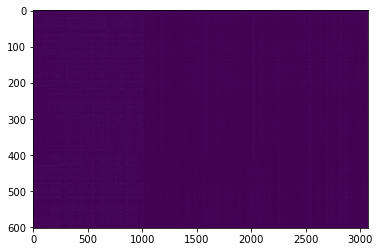

,AUC,pAUC
Source_0,0.711600,0.576316
Source_1,0.835800,0.697368
Source_2,0.747683,0.683835
Target_0,0.615900,0.547895
Target_1,0.564184,0.578733
Target_2,0.602557,0.547542
mean,0.679621,0.605282
h_mean,0.667044,0.599347


2021-04-23 23:04:45,488 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:0.194001, val_AUC_hmean:0.667044, val_pAUC_hmean:0.599347, best_flag:True
2021-04-23 23:04:45,489 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
2021-04-23 23:04:46,092 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:04:46,277 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-23 23:04:46,467 - pytorch_modeler.py - INFO - epoch:130/300, train_losses:0.192670, val_AUC_hmean:0.653792, val_pAUC_hmean:0.597796, best_flag:False
2021-04-23 23:04:46,469 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-23 23:04:47,044 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-23 23:04:47,227 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:04:47,414

100%|██████████| 1/1 [00:00<00:00,  5.63it/s]
2021-04-23 23:05:01,679 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 23:05:01,867 - pytorch_modeler.py - INFO - epoch:146/300, train_losses:0.174258, val_AUC_hmean:0.661953, val_pAUC_hmean:0.595531, best_flag:False
2021-04-23 23:05:01,868 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.42it/s]
2021-04-23 23:05:02,455 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.69it/s]
2021-04-23 23:05:02,650 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]
2021-04-23 23:05:02,849 - pytorch_modeler.py - INFO - epoch:147/300, train_losses:0.172273, val_AUC_hmean:0.661563, val_pAUC_hmean:0.593291, best_flag:False
2021-04-23 23:05:02,850 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-23 23:05:03,426 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-23 23:05:17,977 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 23:05:18,170 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-23 23:05:18,366 - pytorch_modeler.py - INFO - epoch:163/300, train_losses:0.161931, val_AUC_hmean:0.657178, val_pAUC_hmean:0.589608, best_flag:False
2021-04-23 23:05:18,367 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-23 23:05:18,944 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.58it/s]
2021-04-23 23:05:19,143 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 23:05:19,332 - pytorch_modeler.py - INFO - epoch:164/300, train_losses:0.163578, val_AUC_hmean:0.660134, val_pAUC_hmean:0.588596, best_flag:False
2021-04-23 23:05:19,333 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

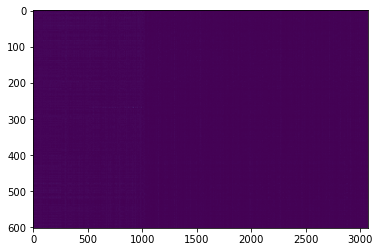

,AUC,pAUC
Source_0,0.726800,0.599474
Source_1,0.866700,0.684211
Source_2,0.744207,0.669763
Target_0,0.608200,0.547895
Target_1,0.561735,0.594952
Target_2,0.547962,0.541674
mean,0.675934,0.606328
h_mean,0.657697,0.601513


2021-04-23 23:05:26,056 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:0.157597, val_AUC_hmean:0.657697, val_pAUC_hmean:0.601513, best_flag:True
2021-04-23 23:05:26,058 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-23 23:05:26,642 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:05:26,826 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-23 23:05:27,023 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:0.156192, val_AUC_hmean:0.659970, val_pAUC_hmean:0.595138, best_flag:False
2021-04-23 23:05:27,025 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-23 23:05:27,600 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-23 23:05:27,784 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-23 23:05:27,972

100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-23 23:05:42,285 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-23 23:05:42,476 - pytorch_modeler.py - INFO - epoch:187/300, train_losses:0.165750, val_AUC_hmean:0.662181, val_pAUC_hmean:0.589108, best_flag:False
2021-04-23 23:05:42,478 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-23 23:05:43,054 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-23 23:05:43,238 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 23:05:43,424 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:0.165461, val_AUC_hmean:0.672796, val_pAUC_hmean:0.591335, best_flag:False
2021-04-23 23:05:43,424 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
2021-04-23 23:05:44,008 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-23 23:05:58,484 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 23:05:58,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-23 23:05:58,878 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:0.145894, val_AUC_hmean:0.658593, val_pAUC_hmean:0.588803, best_flag:False
2021-04-23 23:05:58,879 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.41it/s]
2021-04-23 23:05:59,468 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-23 23:05:59,652 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2021-04-23 23:05:59,848 - pytorch_modeler.py - INFO - epoch:205/300, train_losses:0.145405, val_AUC_hmean:0.658051, val_pAUC_hmean:0.589003, best_flag:False
2021-04-23 23:05:59,849 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-23 23:06:14,447 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.34it/s]
2021-04-23 23:06:15,048 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-23 23:06:15,233 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-23 23:06:15,421 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:0.134036, val_AUC_hmean:0.656701, val_pAUC_hmean:0.589756, best_flag:False
2021-04-23 23:06:15,422 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.38it/s]
2021-04-23 23:06:16,017 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]
2021-04-23 23:06:16,211 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-23 23:06:16,399 - pytorch_modeler.py - INFO - epoch:222/300, train_losses:0.131196, val_AUC_hmean:0.665439, val_pAUC_hmean:0.592213, best_flag:False
2021-04-23 23:06:16,40

2021-04-23 23:06:32,070 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.38it/s]
2021-04-23 23:06:32,663 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.32it/s]
2021-04-23 23:06:32,986 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.35it/s]
2021-04-23 23:06:33,314 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:0.128673, val_AUC_hmean:0.662066, val_pAUC_hmean:0.593420, best_flag:False
2021-04-23 23:06:33,315 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.29it/s]
2021-04-23 23:06:33,925 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.22it/s]
2021-04-23 23:06:34,257 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.21it/s]
2021-04-23 23:06:34,596 - pytorch_modeler.py - INFO - epoch:239/300, train_losses:0.127257, val_AUC_hmean:0.661027, val_pAUC_hmean:0.591044, best_flag:False
2021-04-23 23:06:34,59

2021-04-23 23:06:53,414 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-23 23:06:54,006 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2021-04-23 23:06:54,330 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2021-04-23 23:06:54,657 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:0.118961, val_AUC_hmean:0.661429, val_pAUC_hmean:0.590561, best_flag:False
2021-04-23 23:06:54,658 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
2021-04-23 23:06:55,253 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.28it/s]
2021-04-23 23:06:55,578 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.34it/s]
2021-04-23 23:06:55,901 - pytorch_modeler.py - INFO - epoch:256/300, train_losses:0.115679, val_AUC_hmean:0.653597, val_pAUC_hmean:0.593190, best_flag:False
2021-04-23 23:06:55,90

2021-04-23 23:07:08,791 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-23 23:07:09,238 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 23:07:09,419 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-23 23:07:09,617 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:0.111385, val_AUC_hmean:0.664568, val_pAUC_hmean:0.587782, best_flag:False
2021-04-23 23:07:09,618 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.59it/s]
2021-04-23 23:07:10,056 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-23 23:07:10,236 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-23 23:07:10,418 - pytorch_modeler.py - INFO - epoch:273/300, train_losses:0.111276, val_AUC_hmean:0.660852, val_pAUC_hmean:0.588249, best_flag:False
2021-04-23 23:07:10,42

2021-04-23 23:07:22,820 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.39it/s]
2021-04-23 23:07:23,278 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]
2021-04-23 23:07:23,468 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-23 23:07:23,655 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:0.103835, val_AUC_hmean:0.668195, val_pAUC_hmean:0.591764, best_flag:False
2021-04-23 23:07:23,656 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-23 23:07:24,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-23 23:07:24,290 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-23 23:07:24,479 - pytorch_modeler.py - INFO - epoch:290/300, train_losses:0.103068, val_AUC_hmean:0.664934, val_pAUC_hmean:0.592624, best_flag:False
2021-04-23 23:07:24,48

,AUC,pAUC
Source_0,0.726800,0.599474
Source_1,0.866700,0.684211
Source_2,0.744207,0.669763
Target_0,0.608200,0.547895
Target_1,0.561735,0.594952
Target_2,0.547962,0.541674
mean,0.675934,0.606328
h_mean,0.657697,0.601513


elapsed time: 316.094814301 [sec]


In [12]:
for machine_type in machine_types:
    run(machine_type)